In [807]:
from datetime import datetime, timedelta
import matplotlib.dates as mdates

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf


def read_csv_files(file_paths):
    data = {}
    for key, path in file_paths.items():
        df = pd.read_csv(path)
        df['Date'] = pd.to_datetime(df['Date'])  # Ensure 'Date' column is datetime
        df.set_index('Date', inplace=True)  # Set 'Date' as index
        data[key] = df
    return data

def display_first_last_rows(df, n=40):
    print(df.head(n))
    print(df.tail(n))

def count_observations(df):
    return len(df)

def deduce_periodicity(df):
    df.index = pd.to_datetime(df.index)
    diff = df.index.to_series().diff().dropna()
    return diff.mode()[0]

def descriptive_statistics(df):
    return df.describe()

def identify_missing_values(df):
    return df.isna().sum()

def handle_missing_values(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    return df.fillna(df[numeric_columns].mean())

def detect_anomalies(df, column, window=365):
    rolling_df = df[column].rolling(window=window, center=True)
    Q1 = rolling_df.quantile(0.25)
    Q3 = rolling_df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    anomalies = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return anomalies

def handle_anomalies(df, column, stock_name,  window=365):
    anomalies = detect_anomalies(df, column)
    plot_stock_data_with_anomalies(data, stock_name, column, is_anomalies=True)
    print(f"Found {len(anomalies)} anomalies in {column}")
    df.loc[anomalies.index, column] = np.nan
    rolling_mean = df[column].rolling(window=window, center=True).mean()
    df.loc[:, column] = df[column].fillna(rolling_mean)
    return df

def calculate_moving_average(df, column, window):
    df[f'MA_{window}'] = df[column].rolling(window=window).mean()
    return df

def calculate_correlation(cleaned_data):
    returns = {ticker: df['Close'].pct_change(fill_method=None) for ticker, df in cleaned_data.items()}
    return pd.DataFrame(returns).corr()

def calculate_performance(df):
    initial_price = df['Close'].iloc[0]
    final_price = df['Close'].iloc[-1]
    return (final_price - initial_price) / initial_price

def calculate_annualized_return(df):
    initial_price = df['Close'].iloc[0]
    final_price = df['Close'].iloc[-1]
    print(df.head())
    print(df.tail())
    start_date = df['Date'].iloc[0]
    end_date = df['Date'].iloc[-1]
    n_years = (end_date- start_date).days / 365.25
    return (final_price / initial_price) ** (1 / n_years) - 1

def calculate_volatility(df):
    df['daily_return'] = df['Close'].pct_change(fill_method=None)
    return df['daily_return'].std()

def calculate_sharpe_ratio(df, risk_free_rate=0.01):
    df['daily_return'] = df['Close'].pct_change(fill_method=None)
    mean_return = df['daily_return'].mean()
    std_dev = df['daily_return'].std()
    return (mean_return - risk_free_rate) / std_dev


def plot_trends(df, ticker):
    plt.figure(figsize=(14, 7))
    df_filtered = df[df['Date'] >= datetime.now() - timedelta(days=3*365)]
    plt.plot(df_filtered['Date'], df_filtered['Close'], label='Close Price')
    for column in df.columns:
        if column.startswith('MA_'):
            plt.plot(df_filtered['Date'], df_filtered[column], label=column)
    plt.title(f'Trend Analysis for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

def plot_stock_data_with_anomalies(data, stock_name, column, is_anomalies=True):
    df = data[stock_name]
    anomalies = detect_anomalies(df, column)
    plt.figure(figsize=(14, 7))
    plt.plot(df.index, df[column], label='Data')
    plt.scatter(anomalies.index, anomalies[column], color='red', label='Anomalies')

    legend = f'{stock_name} - {column} with Anomalies' if is_anomalies else f'{stock_name} - {column} after Anomalies Handling'
    plt.title(legend)
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend()
    plt.show()

def calculate_average_daily_return(df):
    """
    Calculate the average daily return and resample to get weekly, monthly, and yearly averages.
    
    Parameters:
    df (DataFrame): The input DataFrame with stock data. It should contain 'Open' and 'Close' columns.
    
    Returns:
    dict: A dictionary with resampled average daily returns for weekly, monthly, and yearly periods.
    """
    df['Daily Return'] = (df['Close'] - df['Open']) / df['Open']
    avg_daily_return = {
        'weekly': df['Daily Return'].resample('W').mean(),
        'monthly': df['Daily Return'].resample('ME').mean(),
        'yearly': df['Daily Return'].resample('YE').mean(),
    }
    return avg_daily_return

def calculate_daily_return(df):
    """
    Calculate the daily return.
    
    Parameters:
    df (DataFrame): The input DataFrame with stock data. It should contain 'Open' and 'Close' columns.
    
    Returns:
    Series: A Series with the daily returns.
    """
    daily_return = (df['Close'] - df['Open']) / df['Open']
    return daily_return

def calculate_average_prices(df):
    avg_prices = {
        'daily': df[['Open', 'Close']].resample('D').mean(),
        'weekly': df[['Open', 'Close']].resample('W').mean(),
        'monthly': df[['Open', 'Close']].resample('ME').mean(),
        'yearly': df[['Open', 'Close']].resample('YE').mean(),
    }
    return avg_prices

def calculate_price_changes(df):
    df['Daily Change'] = df['Close'].diff()

    monthly_close = df['Close'].resample('ME').ffill()
    monthly_change = monthly_close.diff()
    monthly_change.name = 'Monthly Change'

    df = df.merge(monthly_change, left_index=True, right_index=True, how='left')
    df['Monthly Change'].fillna(method='ffill', inplace=True)

    return df


def calculate_bollinger_bands(df, window=20):
    df = df.copy()  # Faire une copie du DataFrame pour éviter les SettingWithCopyWarning
    df['MA20'] = df['Close'].rolling(window=window).mean()
    df['STD20'] = df['Close'].rolling(window=window).std()
    df['Upper Band'] = df['MA20'] + (df['STD20'] * 2)
    df['Lower Band'] = df['MA20'] - (df['STD20'] * 2)
    return df

def plot_bollinger_bands(cleaned_data, tickers):
    end_date = datetime.now()
    start_date = end_date - timedelta(days=3*365)

    for ticker in tickers:
        df = cleaned_data[ticker]


        df_filtered = df[df['Date'] >= start_date]
        df_filtered = calculate_bollinger_bands(df_filtered)

        plt.figure(figsize=(14, 7))
        plt.plot(df_filtered['Date'], df_filtered['Close'], label=f'{ticker} Close Price')
        plt.plot(df_filtered['Date'], df_filtered['Upper Band'], label='Upper Band', color='red')
        plt.plot(df_filtered['Date'], df_filtered['Lower Band'], label='Lower Band', color='green')
        plt.plot(df_filtered['Date'], df_filtered['MA20'], label='MA20',alpha=0.5)
        plt.fill_between(df_filtered['Date'], df_filtered['Lower Band'], df_filtered['Upper Band'], color='blue', alpha=0.1)

        plt.title(f'Bollinger Bands for {ticker} - Last 3 Years')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend(loc='best')
        plt.show()

def calculate_macd(df, short_window=12, long_window=26, signal_window=9):
    df['EMA12'] = df['Close'].ewm(span=short_window, adjust=False).mean()
    df['EMA26'] = df['Close'].ewm(span=long_window, adjust=False).mean()
    df['MACD'] = df['EMA12'] - df['EMA26']
    df['Signal Line'] = df['MACD'].ewm(span=signal_window, adjust=False).mean()
    df['MACD Histogram'] = df['MACD'] - df['Signal Line']
    return df

def plot_macd(ticker):
    end_date = datetime.now()
    start_date = end_date - timedelta(days=3*365)

    df = cleaned_data[ticker]
    df = calculate_macd(df)

    # Filtrer les données pour les trois dernières années en utilisant la colonne 'Date'
    df_filtered = df[df['Date'] >= start_date]

    plt.figure(figsize=(14, 7))
    plt.plot(df_filtered['Date'], df_filtered['MACD'], label='MACD', color='blue')
    plt.plot(df_filtered['Date'], df_filtered['Signal Line'], label='Signal Line', color='red')
    plt.bar(df_filtered['Date'], df_filtered['MACD Histogram'], label='MACD Histogram', color=['green' if val >= 0 else 'red' for val in df_filtered['MACD Histogram']], alpha=0.6)

    plt.title(f'MACD for {ticker} - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('MACD')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.show()

def calculate_rsi(df, window=14):
    delta = df['Close'].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)

    avg_gain = gain.ewm(com=window - 1, adjust=False).mean()
    avg_loss = loss.ewm(com=window - 1, adjust=False).mean()

    rs = avg_gain / avg_loss
    df['RSI'] = 100 - (100 / (1 + rs))
    return df

def plot_rsi(ticker):
    end_date = datetime.now()
    start_date = end_date - timedelta(days=3*365)

    
    df = cleaned_data[ticker]
    df = calculate_rsi(df)

    df_filtered = df[df['Date'] >= start_date]

    plt.figure(figsize=(14, 7))
    plt.plot(df_filtered['Date'], df_filtered['RSI'], label='RSI', color='purple')

    plt.axhline(70, color='purple', linestyle='--', linewidth=1)
    plt.axhline(30, color='purple', linestyle='--', linewidth=1)

    plt.fill_between(df_filtered['Date'], 30, 70, color='purple', alpha=0.1)

    plt.title(f'RSI for {ticker} - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.show()
def plot_close_price_with_rsi(df, ticker):
    plt.figure(figsize=(14, 10))
    plt.subplot(2, 1, 1)
    plt.plot(df['Date'], df['Close'], label='Close Price')
    plt.title(f'Close Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='best')
    plt.grid(True)
    plt.subplot(2, 1, 2)
    plt.plot(df['Date'], df['RSI'], label='RSI', color='purple')

    plt.axhline(70, color='purple', linestyle='--', linewidth=1)
    plt.axhline(30, color='purple', linestyle='--', linewidth=1)

    plt.fill_between(df['Date'], 30, 70, color='purple', alpha=0.1)

    plt.title(f'RSI for {ticker} - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.show()

def plot_close_price_with_macd(df, ticker):
    plt.figure(figsize=(14, 10))
    plt.subplot(2, 1, 1)
    plt.plot(df['Date'], df['Close'], label='Close Price')
    plt.title(f'Close Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='best')
    plt.grid(True)
    plt.subplot(2, 1, 2)
    plt.plot(df['Date'], df['MACD'], label='MACD', color='blue')
    plt.plot(df['Date'], df['Signal Line'], label='Signal Line', color='red')
    plt.bar(df['Date'], df['MACD Histogram'], label='MACD Histogram', color=['green' if val >= 0 else 'red' for val in df['MACD Histogram']], alpha=0.6)
    plt.title(f'MACD for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('MACD')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.tight_layout()
    plt.show()

def calculate_ichimoku(df):
    high_9 = df['High'].rolling(window=9).max()
    low_9 = df['Low'].rolling(window=9).min()
    df['Tenkan_sen'] = (high_9 + low_9) / 2

    high_26 = df['High'].rolling(window=26).max()
    low_26 = df['Low'].rolling(window=26).min()
    df['Kijun_sen'] = (high_26 + low_26) / 2

    df['Chikou_span'] = df['Close'].shift(-26)

    df['Senkou_span_a'] = ((df['Tenkan_sen'] + df['Kijun_sen']) / 2).shift(26)

    high_52 = df['High'].rolling(window=52).max()
    low_52 = df['Low'].rolling(window=52).min()
    df['Senkou_span_b'] = ((high_52 + low_52) / 2).shift(26)
    return df

def plot_closing_price_and_ichimoku(tickers, cleaned_data,):
    start_date = datetime.now() - timedelta(days=1*365)
    end_date = datetime.now()
    for ticker in tickers:
        df = cleaned_data[ticker]
        df = calculate_ichimoku(df)

        df_filtered = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

        plt.figure(figsize=(14, 7))

        plt.plot(df_filtered['Date'], df_filtered['Close'], label='Close', color='black')

        plt.plot(df_filtered['Date'], df_filtered['Tenkan_sen'], label='Tenkan-sen', color='red')
        plt.plot(df_filtered['Date'], df_filtered['Kijun_sen'], label='Kijun-sen', color='blue')
        plt.plot(df_filtered['Date'], df_filtered['Chikou_span'], label='Chikou Span', color='green')
        plt.plot(df_filtered['Date'], df_filtered['Senkou_span_a'], label='Senkou Span A', color='orange')
        plt.plot(df_filtered['Date'], df_filtered['Senkou_span_b'], label='Senkou Span B', color='purple')
        plt.fill_between(df_filtered['Date'], df_filtered['Senkou_span_a'], df_filtered['Senkou_span_b'],
                         where=df_filtered['Senkou_span_a'] >= df_filtered['Senkou_span_b'], color='green', alpha=0.2)
        plt.fill_between(df_filtered['Date'], df_filtered['Senkou_span_a'], df_filtered['Senkou_span_b'],
                         where=df_filtered['Senkou_span_a'] < df_filtered['Senkou_span_b'], color='red', alpha=0.2)

        plt.title(f'Ichimoku for {ticker} - Last Year')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend(loc='best')
        plt.grid(True)

        plt.gca().xaxis.set_major_locator(mdates.YearLocator())
        plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

        plt.show()

import seaborn as sns

def calculate_monthly_returns(df):
    df['Year'] = df.index.year
    df['Month'] = df.index.month
    df['Monthly Return'] = df['Close'].pct_change(periods=21, fill_method=None) * 100
    return df

def create_seasonality_table(df, start_year):
    df = df[df['Year'] >= start_year]
    seasonality_table = df.pivot_table(values='Monthly Return', index='Year', columns='Month', aggfunc='mean')
    seasonality_table.loc['Average'] = seasonality_table.mean()
    seasonality_table.loc['StDev'] = seasonality_table.std()
    seasonality_table.loc['Pos%'] = (seasonality_table > 0).mean() * 100
    return seasonality_table

def plot_seasonality_table(seasonality_table, ticker):
    plt.figure(figsize=(12, 8))

    cmap = sns.diverging_palette(30,130, as_cmap=True, s=300, l=50 )

    # Définir les valeurs limites pour la coloration (-30 à 30)
    ax = sns.heatmap(seasonality_table, annot=True, fmt=".2f", cmap=cmap, center=0, cbar_kws={'label': 'Monthly Return (%)'})

    # Modifier les étiquettes des colonnes pour afficher les mois sous forme de noms
    month_names = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    ax.set_xticklabels(month_names)

    ax.set_title(f'Seasonality Table for {ticker} - Last 10 Years')
    ax.set_xlabel('Month')
    ax.set_ylabel('Year')
    plt.show()

# Fonction principale pour traiter et visualiser la saisonnalité pour une liste de tickers
def process_and_plot_seasonality(start_year):
    for ticker, df in data.items():
        df = calculate_monthly_returns(df)
        seasonality_table = create_seasonality_table(df, start_year)
        plot_seasonality_table(seasonality_table, ticker)

Group composed of 5 students: 
- Student 1: DAVOINE Amaury 20200894
- Student 2: CLOTTEAU Mathis 
- Student 3: BERTHAULT Alexandre
- Student 4: BOUCHER Mayeul
- Student 5: DA SILVA Marc-Antoine

In [808]:
import os

tickers = ["AAPL", "MSFT","AMZN", "META", "GOOG", "TSLA", "ZM", ]
start_date = (datetime.now() - timedelta(days=30*365)).strftime('%Y-%m-%d')
end_date = datetime.now().strftime('%Y-%m-%d')
os.makedirs("data", exist_ok=True)
data = {}
for ticker in tickers:
    df = yf.download(ticker, start=start_date, end=end_date)
    df.reset_index(inplace=True)
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    df = df[['Open', 'High', 'Low', 'Close', 'Volume']]
    data[ticker] = df
    df.to_csv(f"data/{ticker}_historical_data.csv")
    print(df.head())
    print(df.tail())


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


                Open      High       Low     Close     Volume
Date                                                         
1994-07-21  0.237723  0.254464  0.236607  0.250000  289475200
1994-07-22  0.282366  0.285435  0.267857  0.276786  786576000
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000
                  Open        High         Low       Close    Volume
Date                                                                
2024-07-08  227.089996  227.850006  223.250000  227.820007  59085900
2024-07-09  227.929993  229.399994  226.369995  228.679993  48076100
2024-07-10  229.300003  233.080002  229.250000  232.979996  62627700
2024-07-11  231.389999  232.389999  225.770004  227.570007  64710600
2024-07-12  228.919998  232.639999  228.679993  230.539993  53008200
                Open      High       Low     Close     Volume
Date                 

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

                Open      High       Low     Close     Volume
Date                                                         
2004-08-19  2.490664  2.591785  2.390042  2.499133  897427216
2004-08-20  2.515820  2.716817  2.503118  2.697639  458857488
2004-08-23  2.758411  2.826406  2.716070  2.724787  366857939
2004-08-24  2.770615  2.779581  2.579581  2.611960  306396159
2004-08-25  2.614201  2.689918  2.587302  2.640104  184645512
                  Open        High         Low       Close    Volume
Date                                                                
2024-07-08  191.365005  191.679001  189.320007  190.479996  12097600
2024-07-09  191.750000  192.860001  190.229996  190.440002  10198500
2024-07-10  190.750000  193.309998  190.619995  192.660004  12052900
2024-07-11  191.339996  192.410004  186.820007  187.300003  16452000
2024-07-12  186.919998  188.690002  186.139999  186.779999  14429100
                Open      High       Low     Close     Volume
Date                 

In [809]:
cleaned_data = {}

for ticker, df in data.items():
    print(f"\nExploration des données pour {ticker} :")
    print(f"Premières et dernières lignes :")
    display_first_last_rows(df)
for ticker, df in data.items():
    print(f"Nombre d'observations pour {ticker}: {count_observations(df)}")
for ticker, df in data.items():
    print(f"Période entre les points de données : {deduce_periodicity(df)}")

for ticker, df in data.items():
    print("Statistiques descriptives :")
    print(descriptive_statistics(df))
for ticker, df in data.items():
    print(f"Valeurs manquantes pour {ticker} :")
    print(identify_missing_values(df))
    df = handle_missing_values(df)  # Handle missing values
    cleaned_data[ticker] = df

for ticker, df in cleaned_data.items():
    print(f"Valeurs manquantes pour {ticker} après nettoyage :")
    print(identify_missing_values(df))



Exploration des données pour AAPL :
Premières et dernières lignes :
                Open      High       Low     Close     Volume
Date                                                         
1994-07-21  0.237723  0.254464  0.236607  0.250000  289475200
1994-07-22  0.282366  0.285435  0.267857  0.276786  786576000
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000
1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600
1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400
1994-08-01  0.300223  0.301339  0.292411  0.297991  229275200
1994-08-02  0.299107  0.300223  0.289063  0.290737  269561600
1994-08-03  0.292411  0.296875  0.286830  0.295759  226844800
1994-08-04  0.295759  0.301339  0.295759  0.296875  184755200
1994-08-05  0.293527  0.297991  0.293527  0.296875   87012800
1994-08-08  0.295759  0.303571  0.294643  0.301339  141276800
1

Nettoyage des données pour AAPL :
Traitement de la colonne Open :


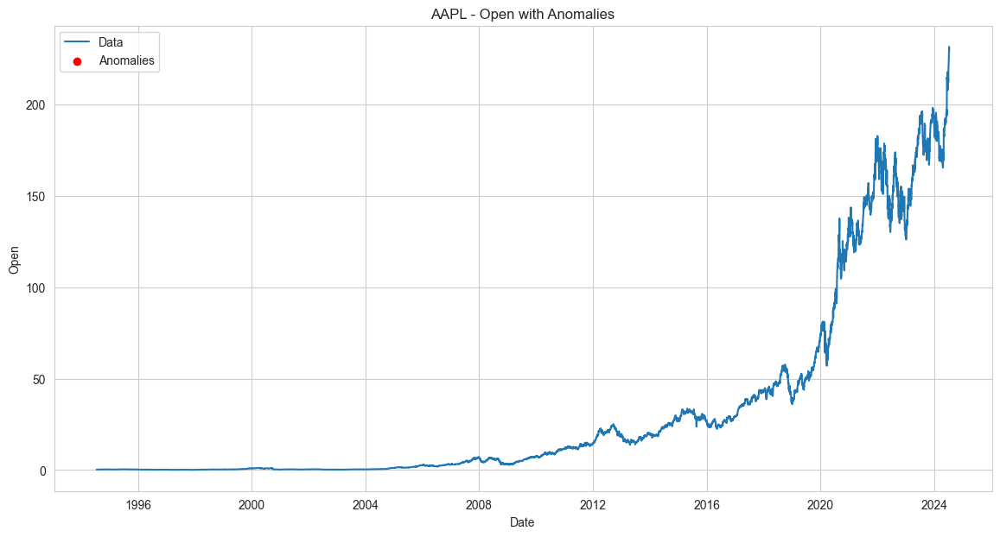

Found 0 anomalies in Open
Traitement de la colonne High :


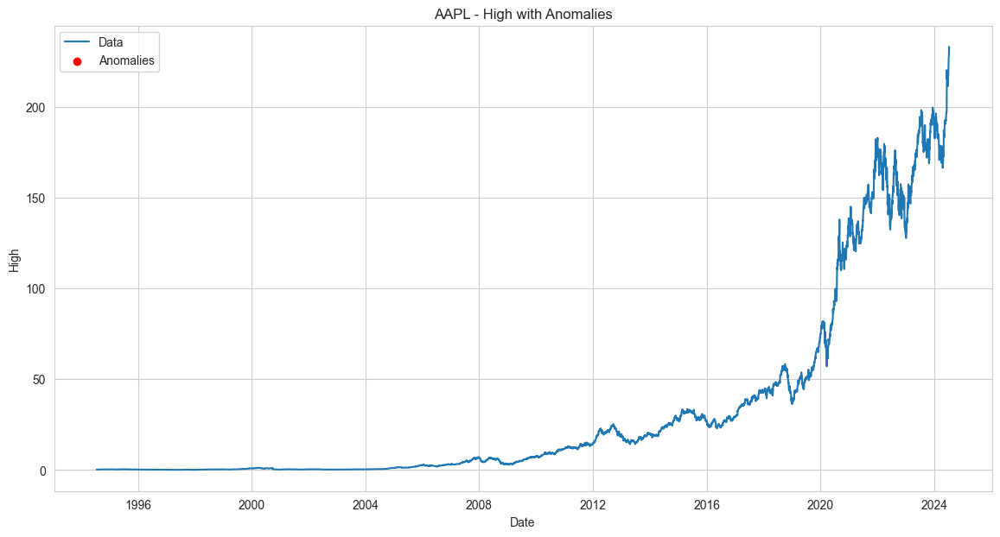

Found 0 anomalies in High
Traitement de la colonne Low :


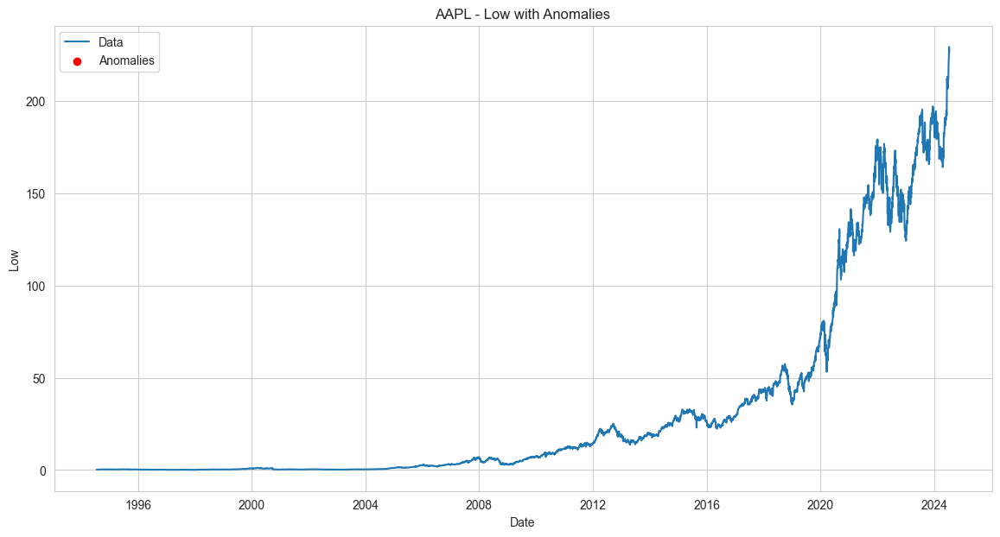

Found 0 anomalies in Low
Traitement de la colonne Close :


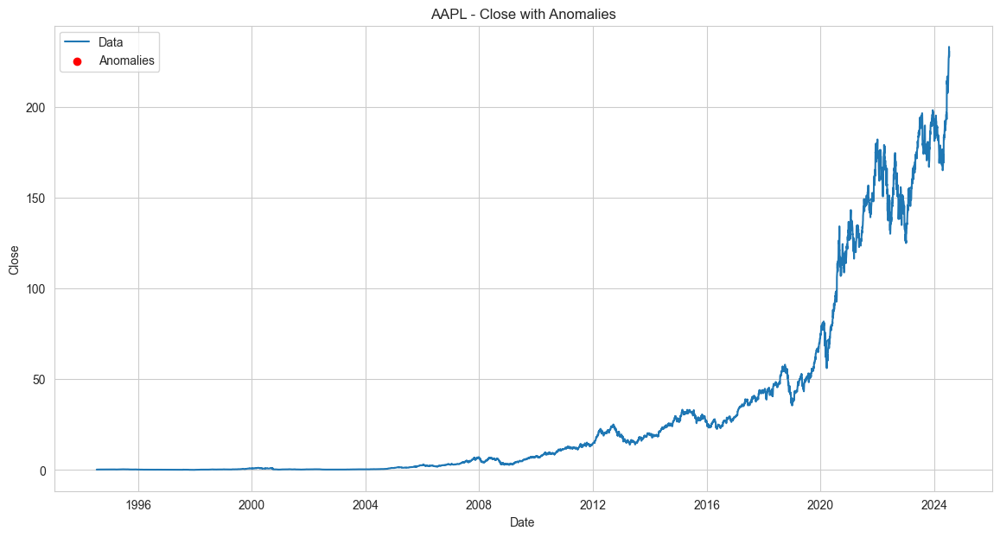

Found 0 anomalies in Close
Traitement de la colonne Volume :


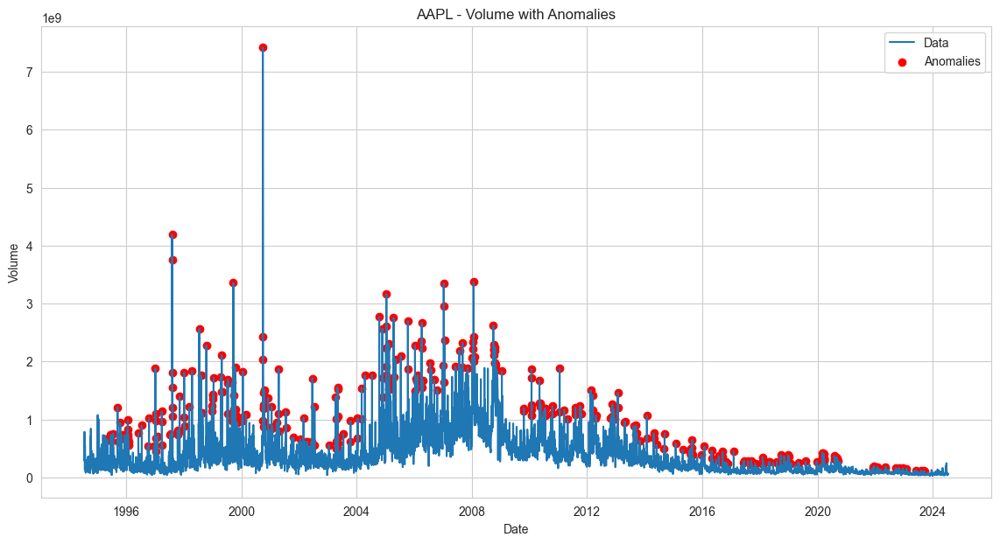

Found 353 anomalies in Volume
Nettoyage des données pour MSFT :
Traitement de la colonne Open :


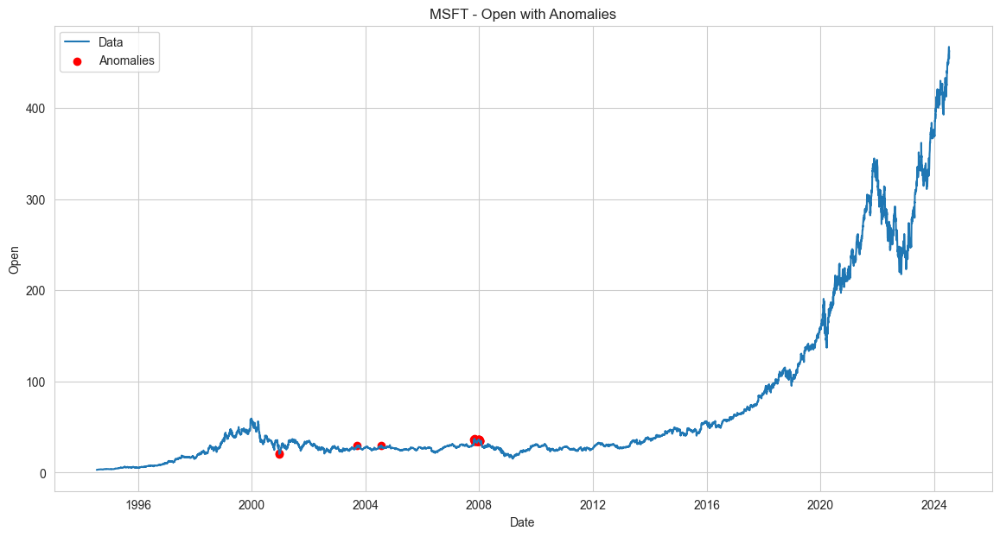

Found 37 anomalies in Open
Traitement de la colonne High :


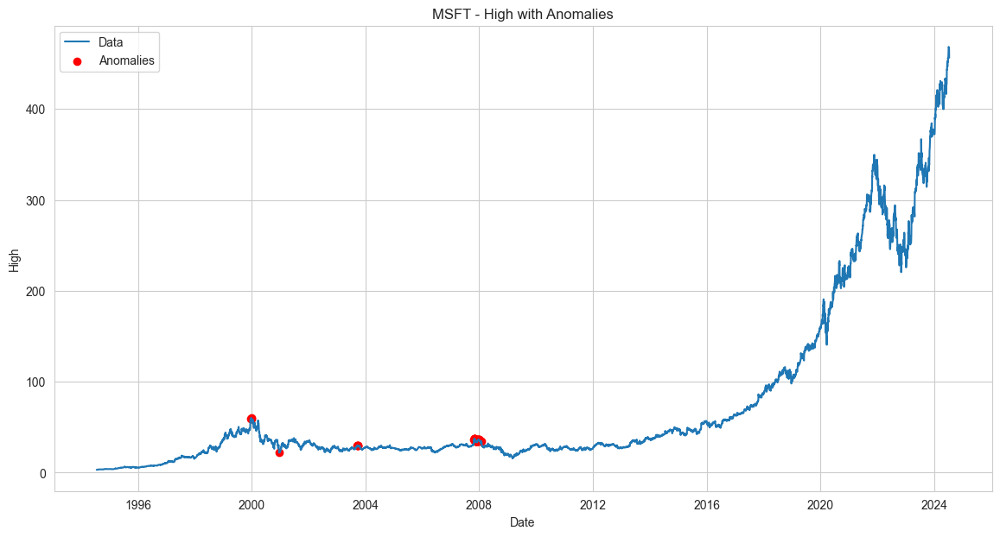

Found 46 anomalies in High
Traitement de la colonne Low :


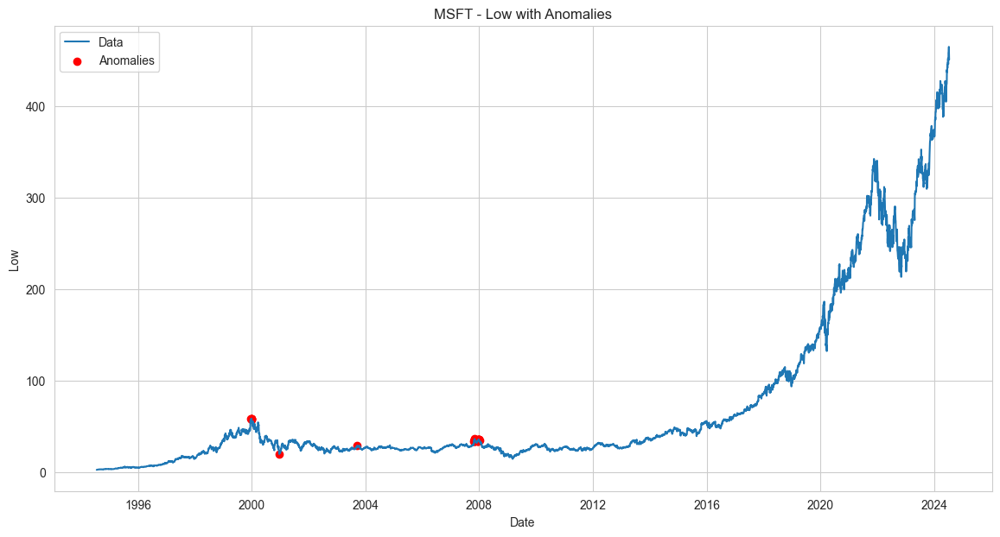

Found 30 anomalies in Low
Traitement de la colonne Close :


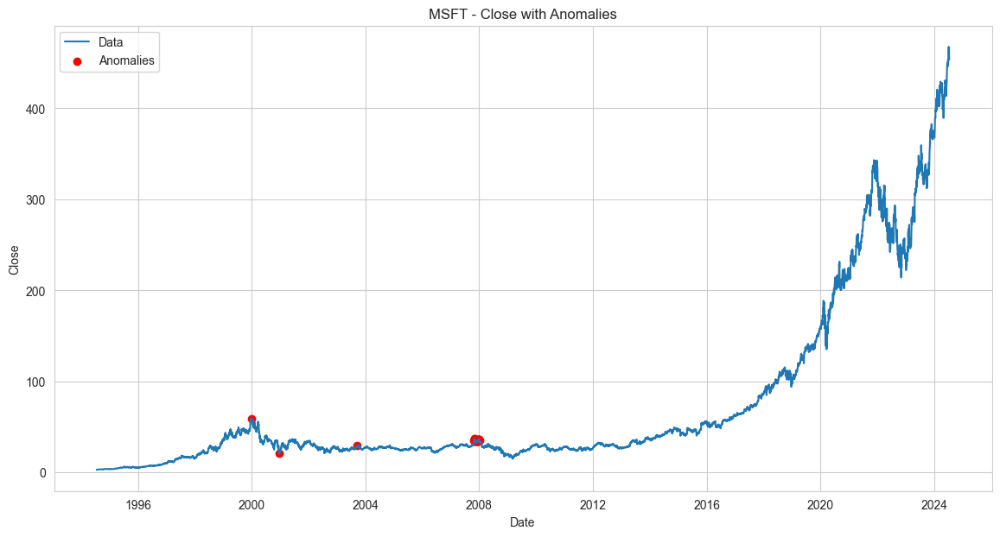

Found 32 anomalies in Close
Traitement de la colonne Volume :


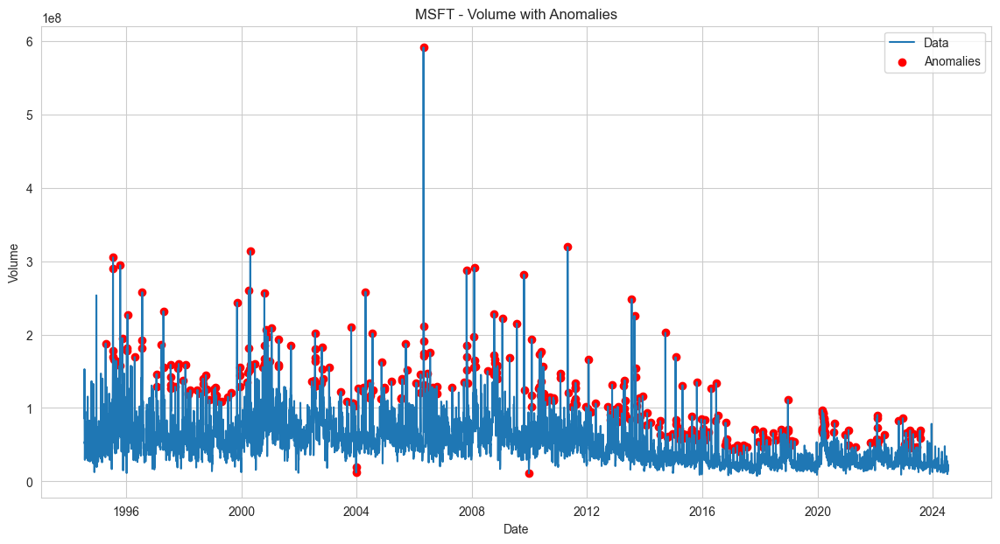

Found 376 anomalies in Volume
Nettoyage des données pour AMZN :
Traitement de la colonne Open :


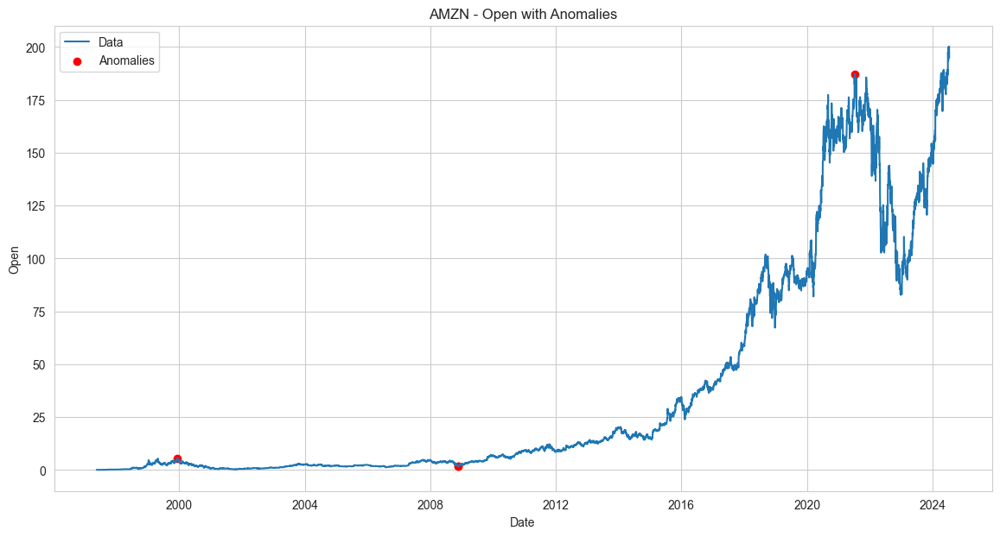

Found 4 anomalies in Open
Traitement de la colonne High :


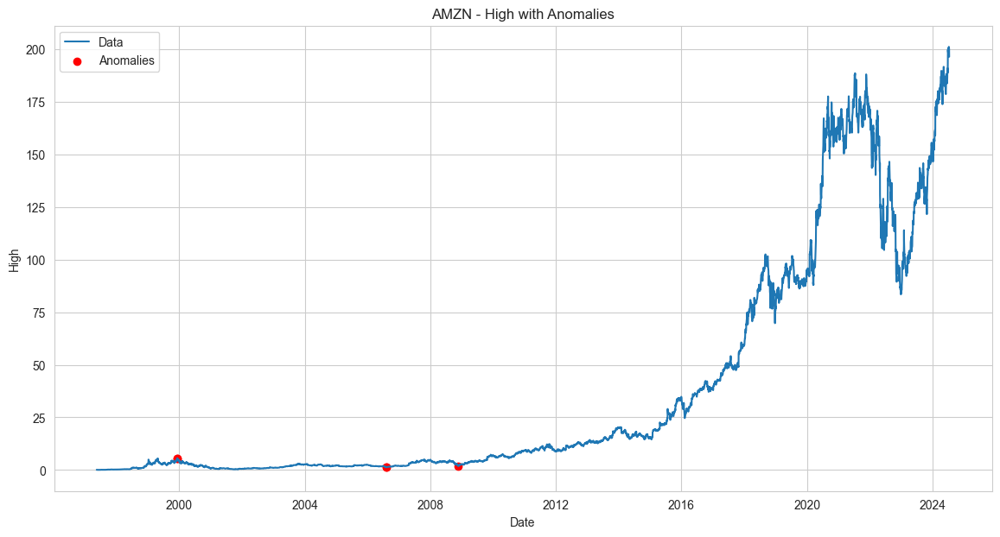

Found 5 anomalies in High
Traitement de la colonne Low :


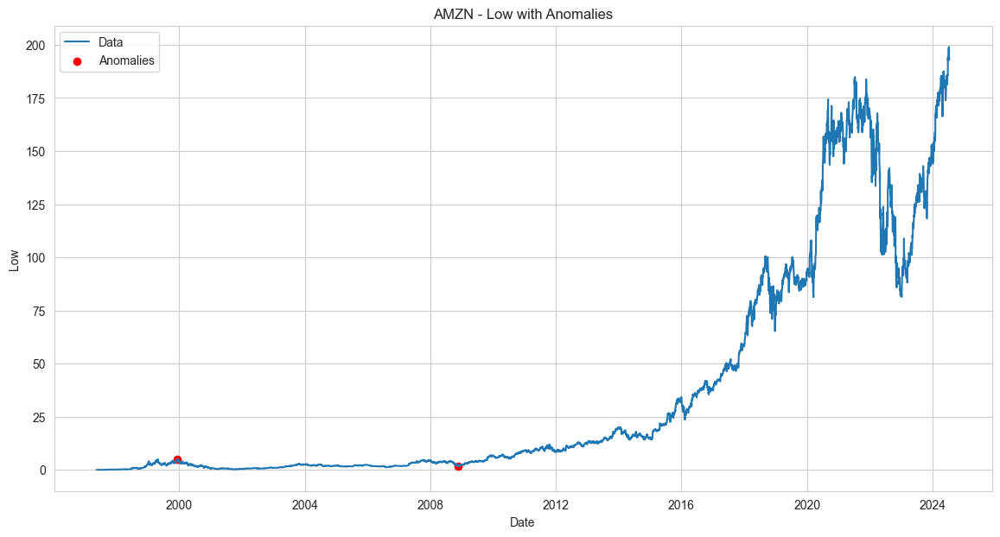

Found 2 anomalies in Low
Traitement de la colonne Close :


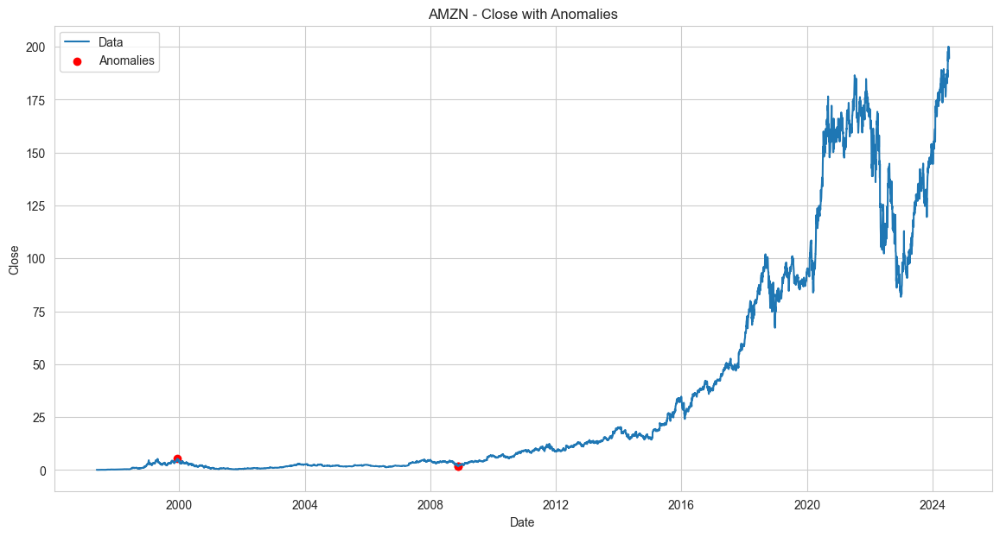

Found 3 anomalies in Close
Traitement de la colonne Volume :


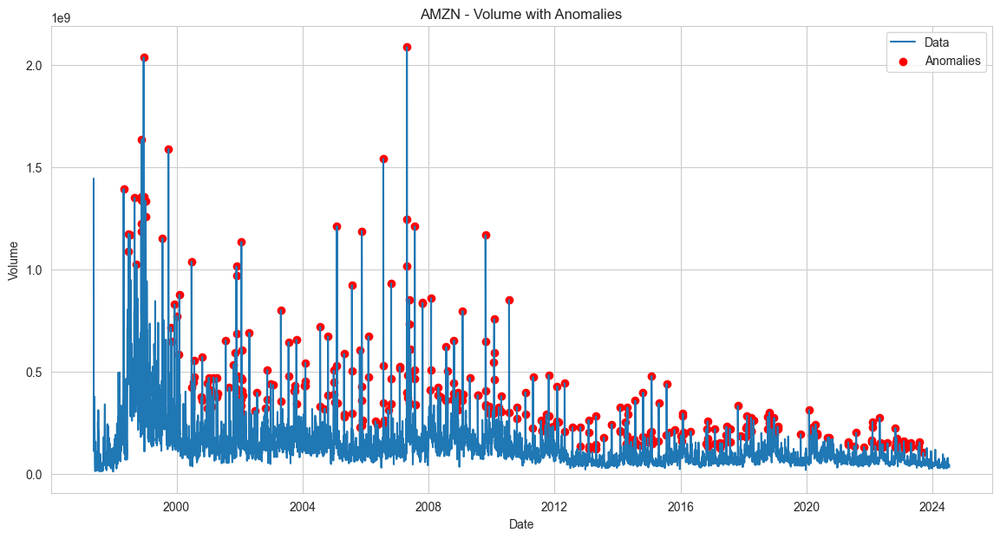

Found 348 anomalies in Volume
Nettoyage des données pour META :
Traitement de la colonne Open :


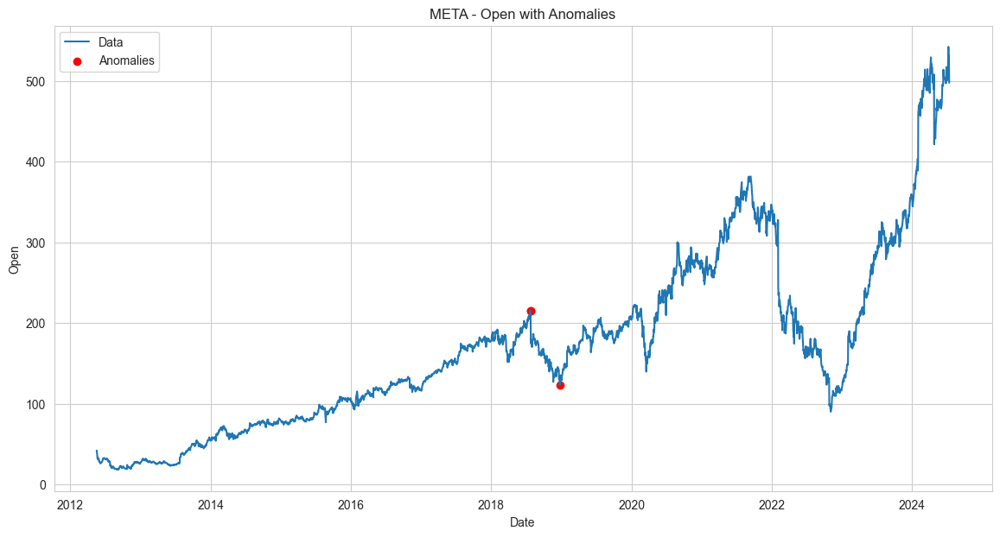

Found 3 anomalies in Open
Traitement de la colonne High :


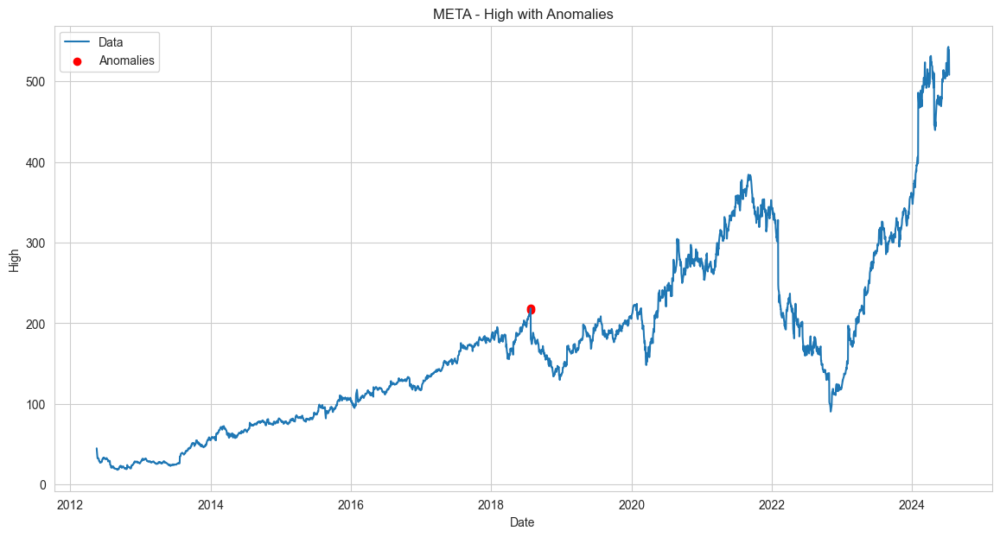

Found 2 anomalies in High
Traitement de la colonne Low :


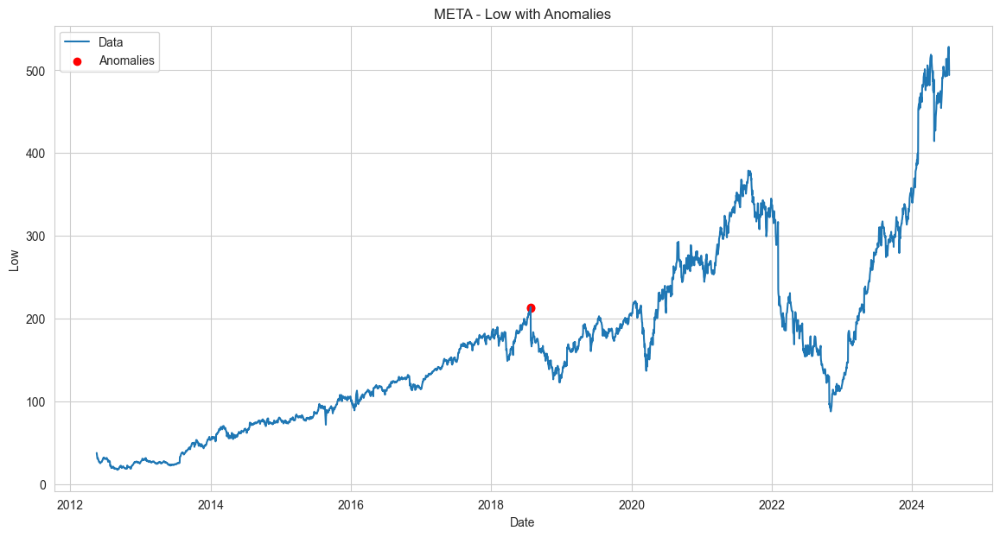

Found 2 anomalies in Low
Traitement de la colonne Close :


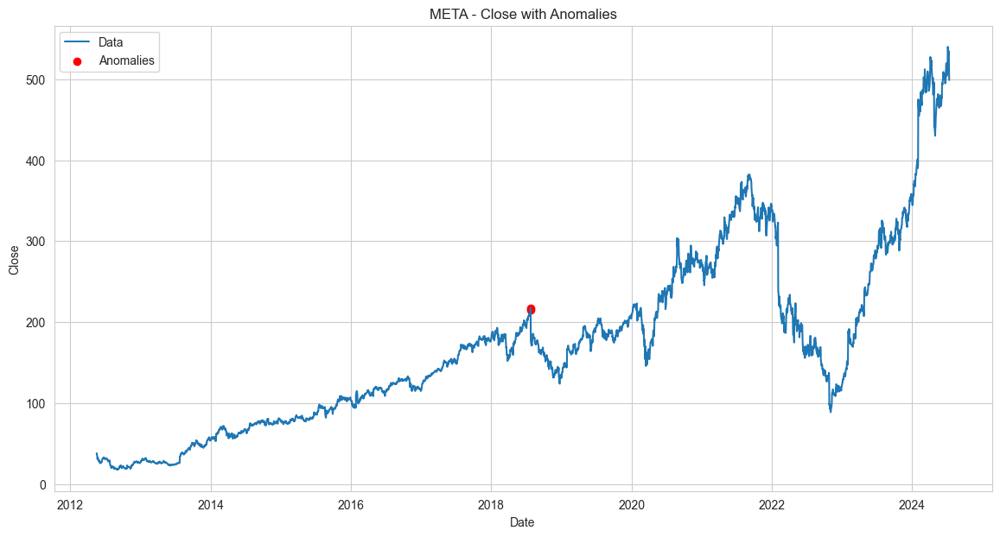

Found 2 anomalies in Close
Traitement de la colonne Volume :


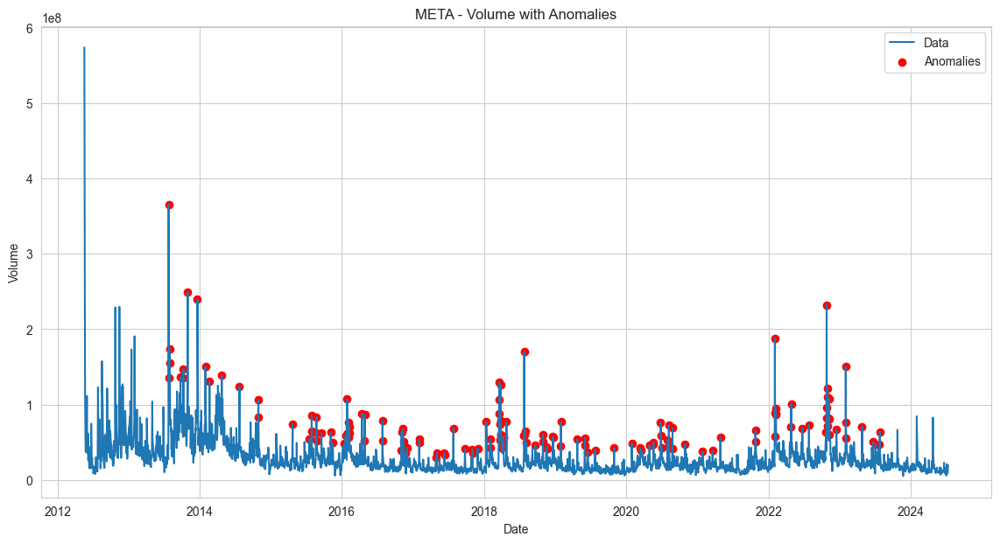

Found 147 anomalies in Volume
Nettoyage des données pour GOOG :
Traitement de la colonne Open :


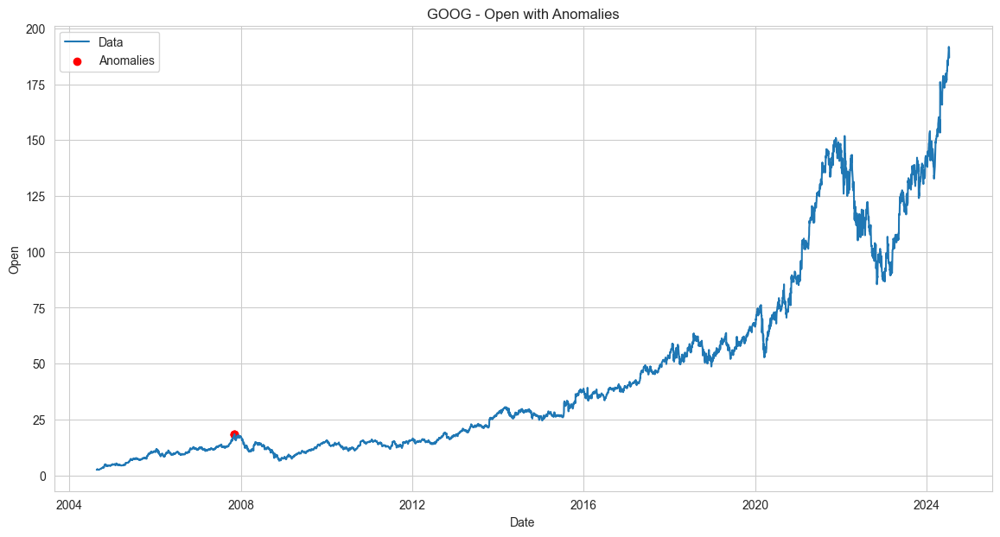

Found 3 anomalies in Open
Traitement de la colonne High :


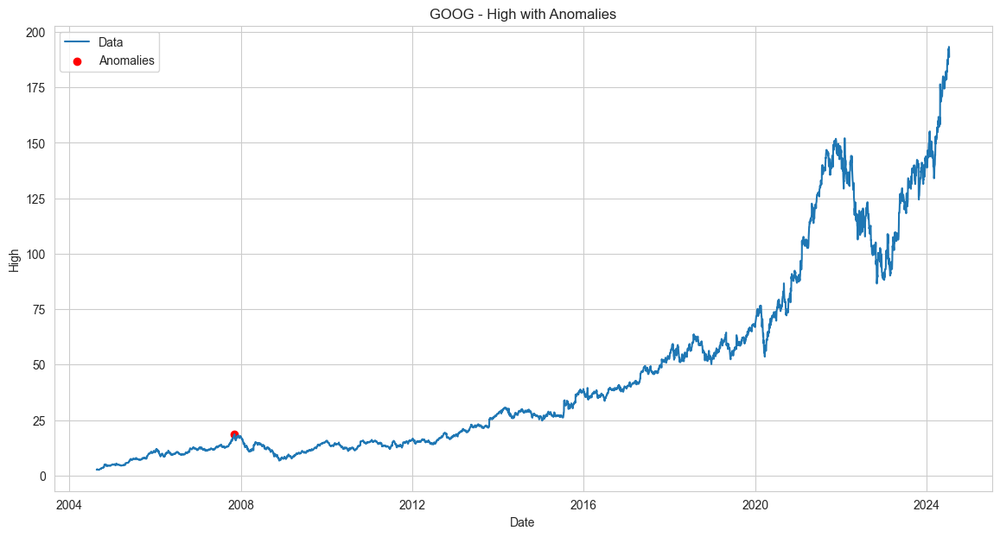

Found 1 anomalies in High
Traitement de la colonne Low :


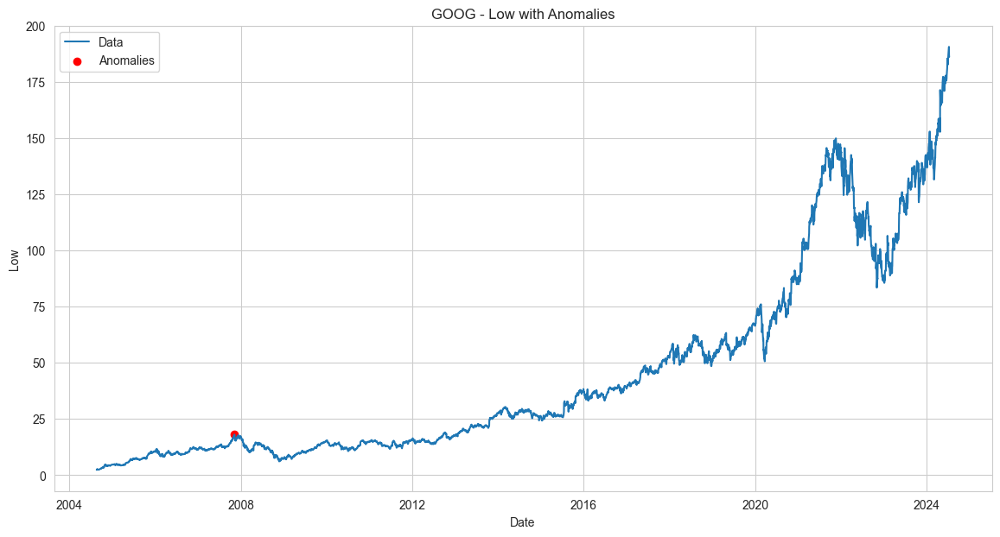

Found 1 anomalies in Low
Traitement de la colonne Close :


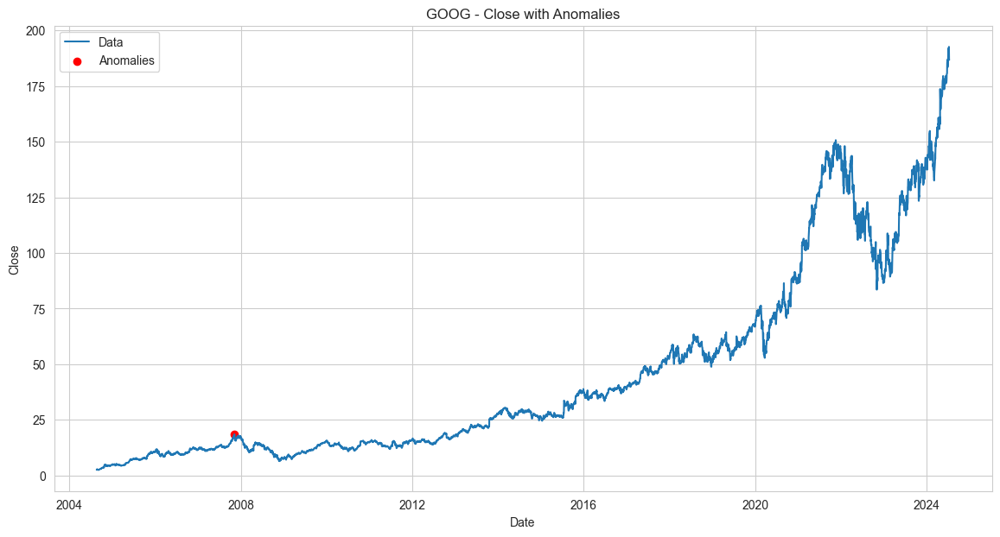

Found 1 anomalies in Close
Traitement de la colonne Volume :


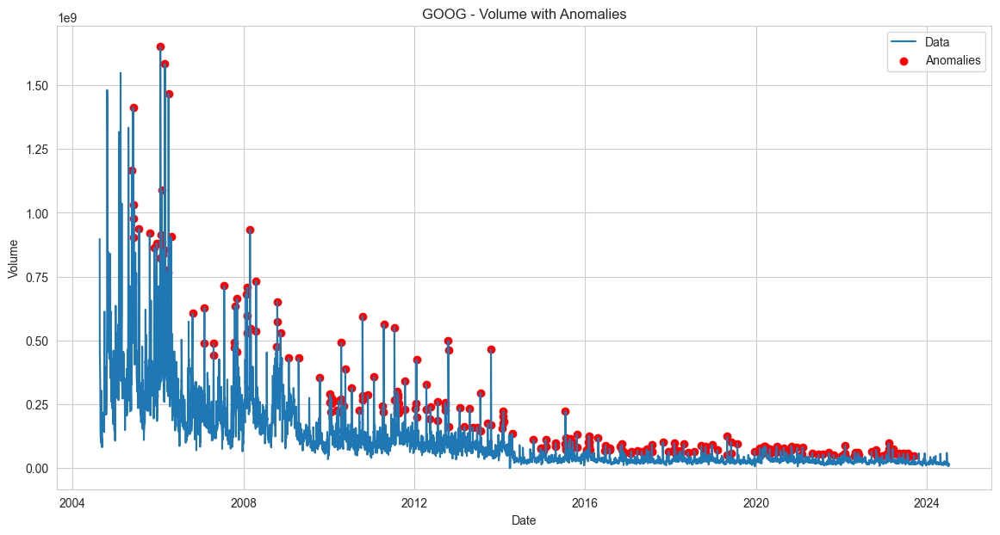

Found 260 anomalies in Volume
Nettoyage des données pour TSLA :
Traitement de la colonne Open :


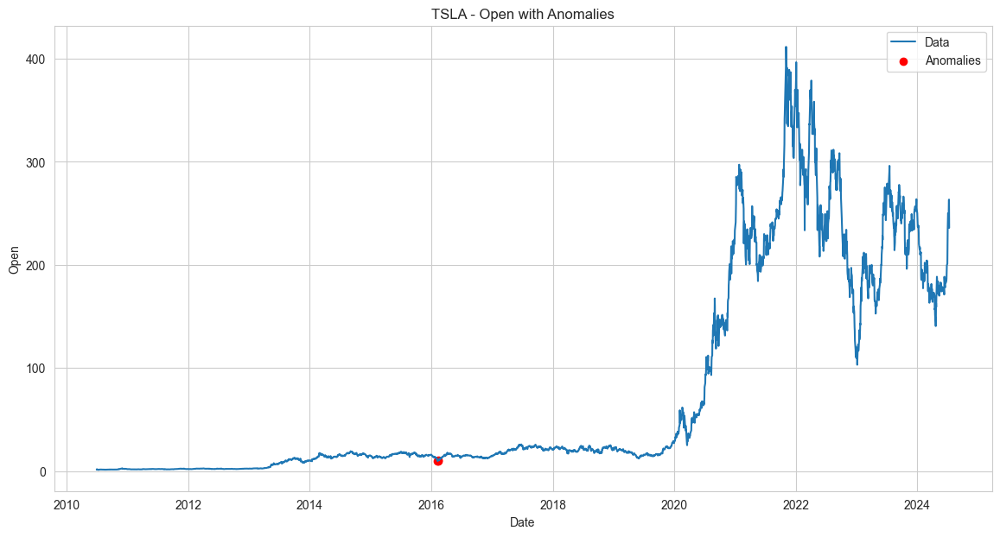

Found 3 anomalies in Open
Traitement de la colonne High :


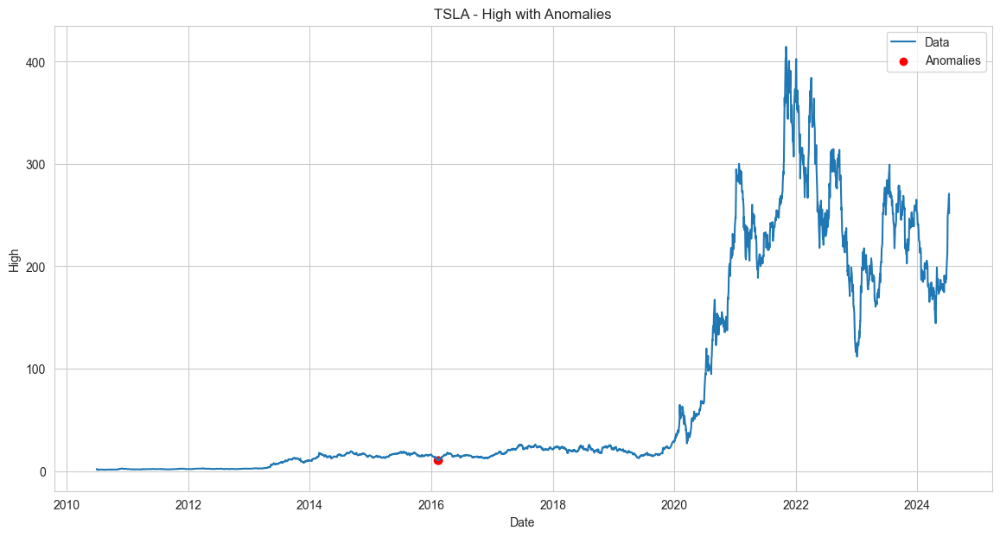

Found 3 anomalies in High
Traitement de la colonne Low :


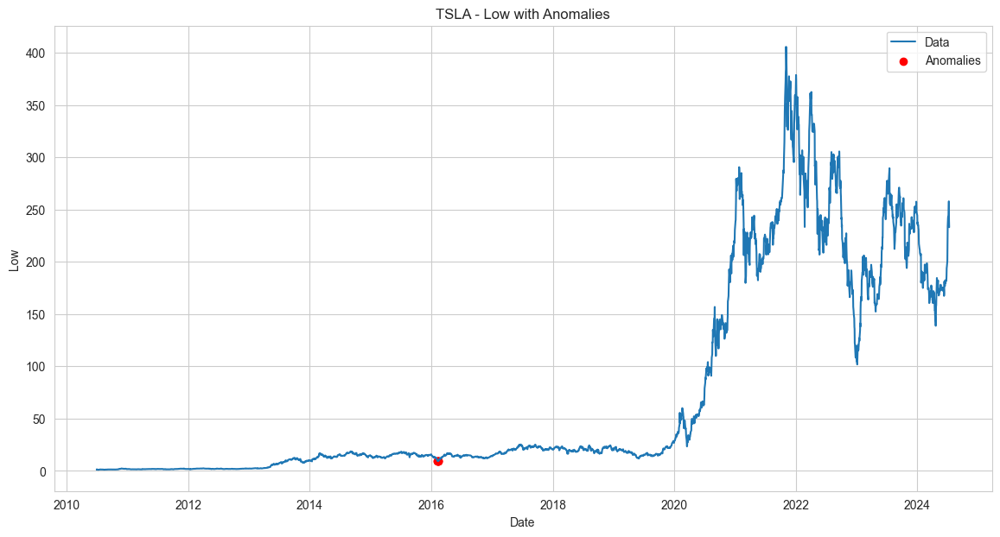

Found 5 anomalies in Low
Traitement de la colonne Close :


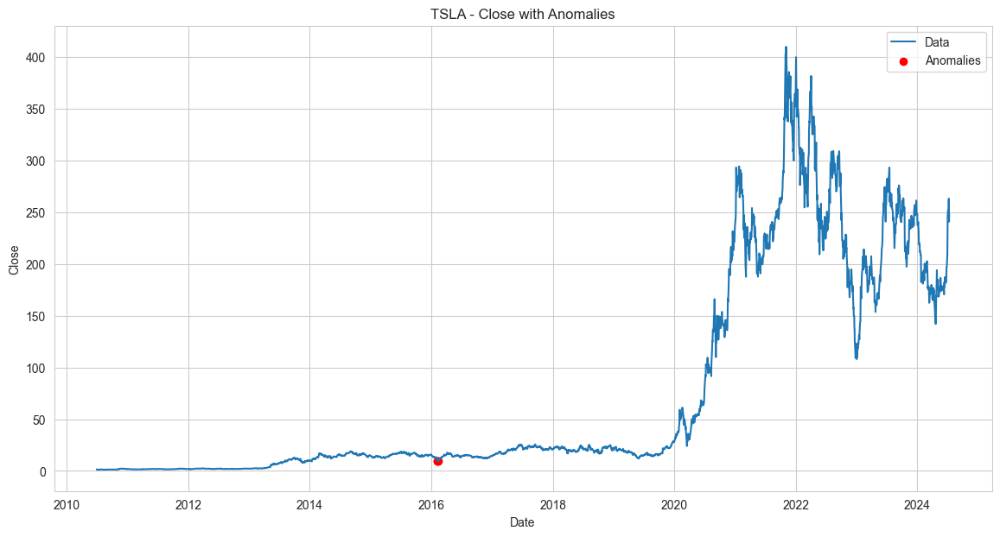

Found 3 anomalies in Close
Traitement de la colonne Volume :


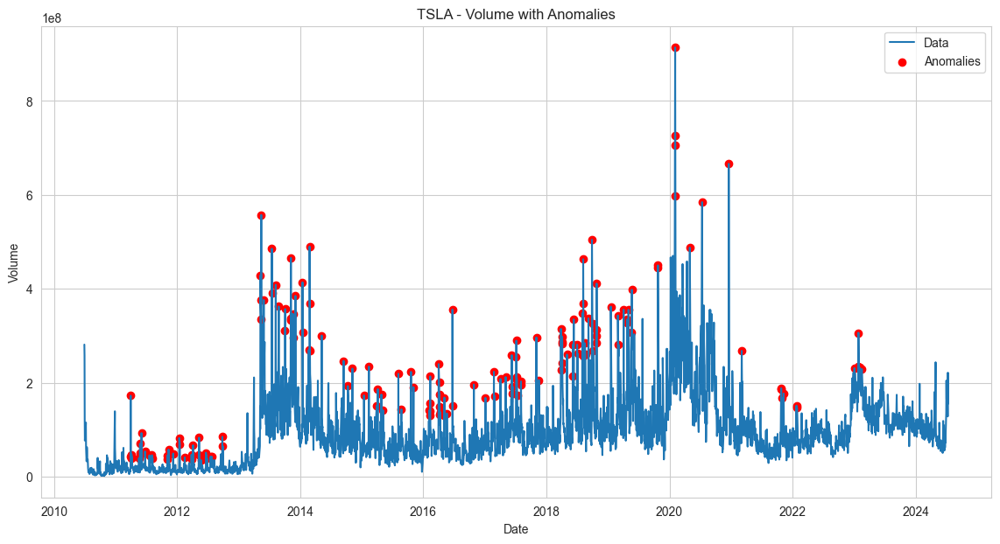

Found 163 anomalies in Volume
Nettoyage des données pour ZM :
Traitement de la colonne Open :


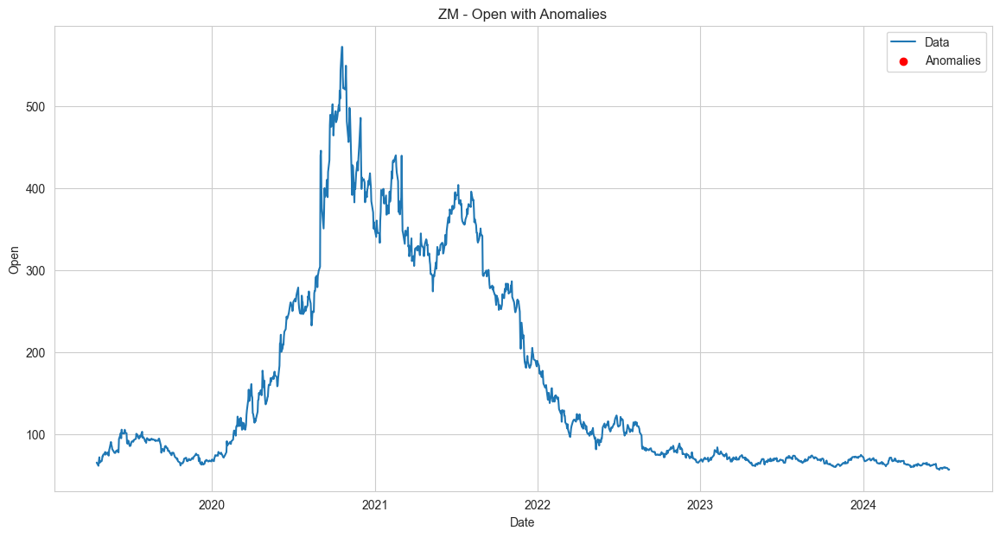

Found 0 anomalies in Open
Traitement de la colonne High :


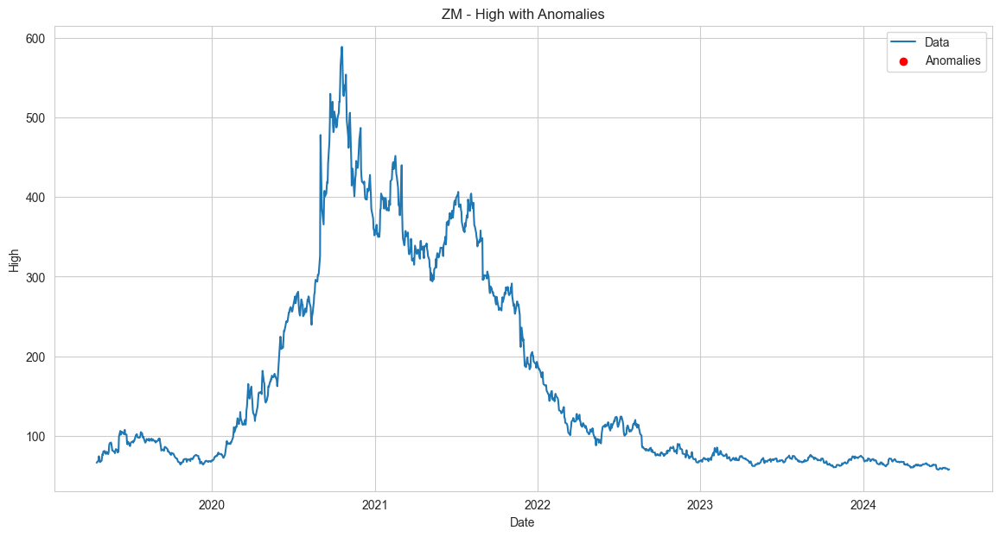

Found 0 anomalies in High
Traitement de la colonne Low :


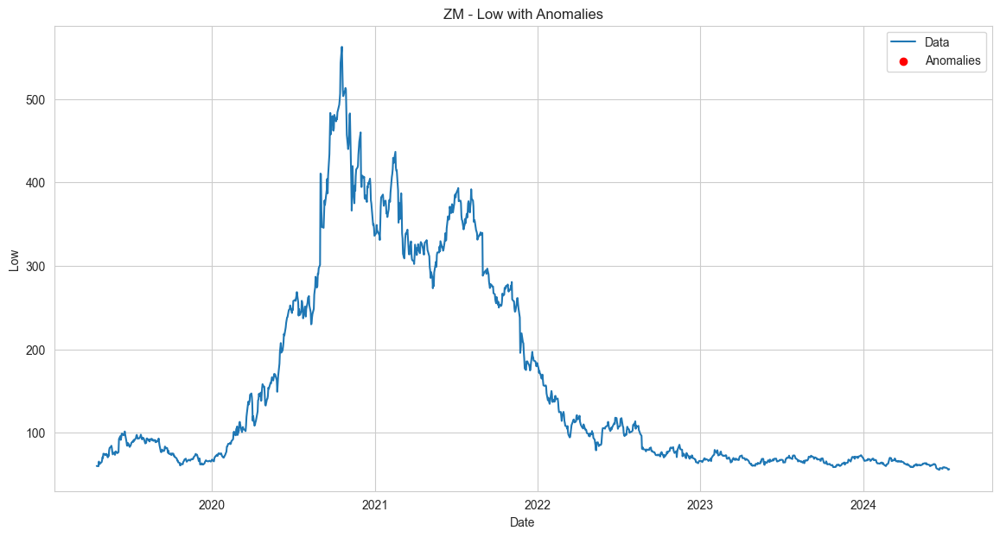

Found 0 anomalies in Low
Traitement de la colonne Close :


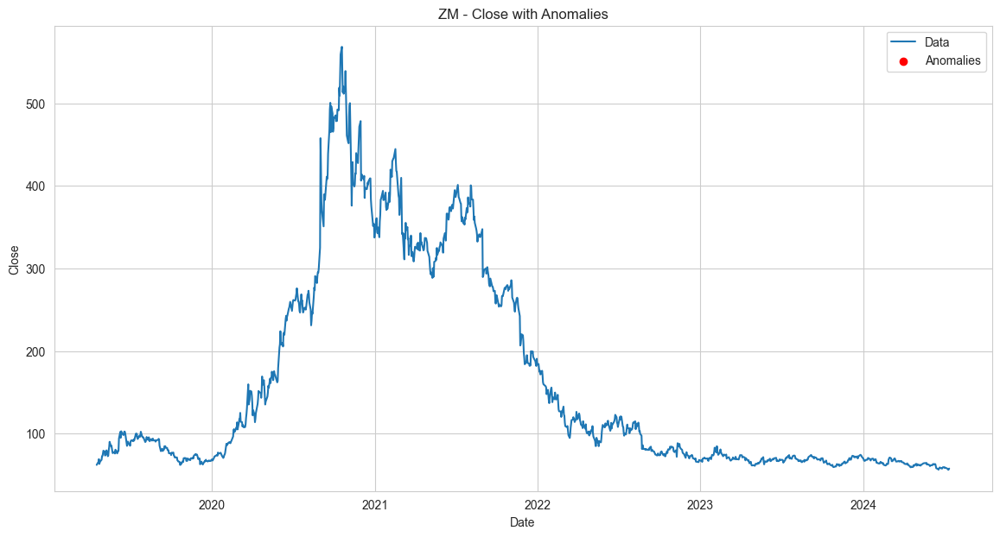

Found 0 anomalies in Close
Traitement de la colonne Volume :


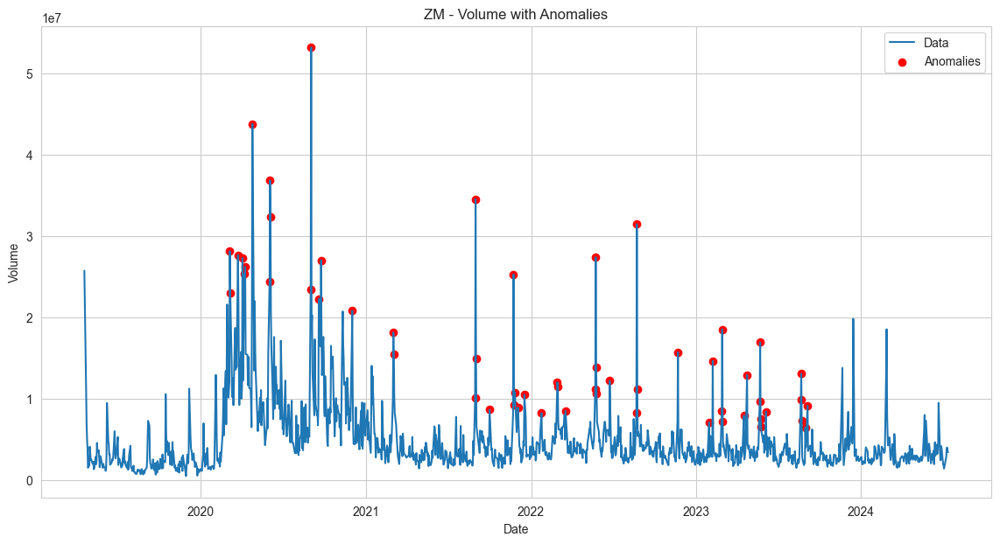

Found 56 anomalies in Volume


In [810]:
for ticker, df in data.items():
    print(f"Nettoyage des données pour {ticker} :")
    for column in ['Open', 'High', 'Low', 'Close', 'Volume']:
        print(f"Traitement de la colonne {column} :")
        df = handle_anomalies(df=df, column=column, stock_name=ticker)
    cleaned_data[ticker] = df

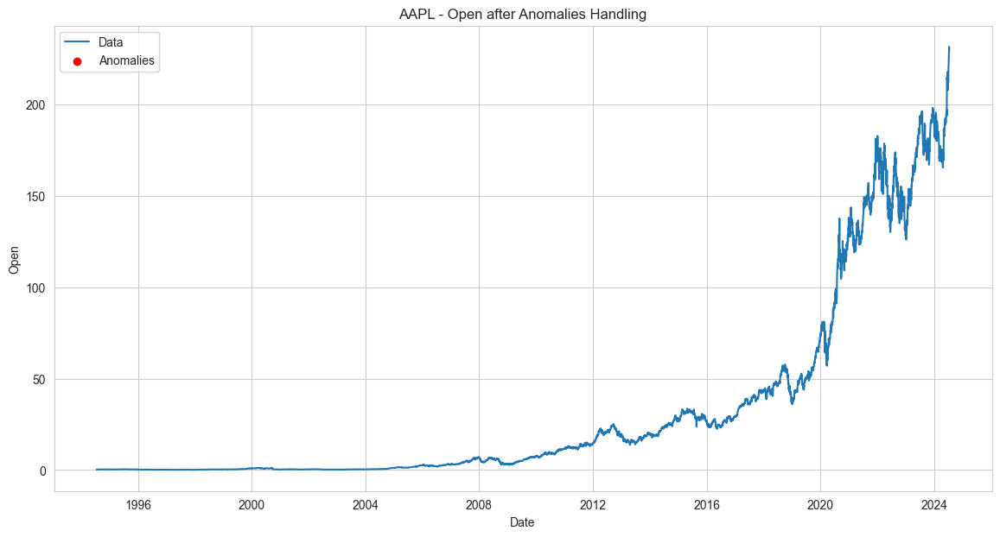

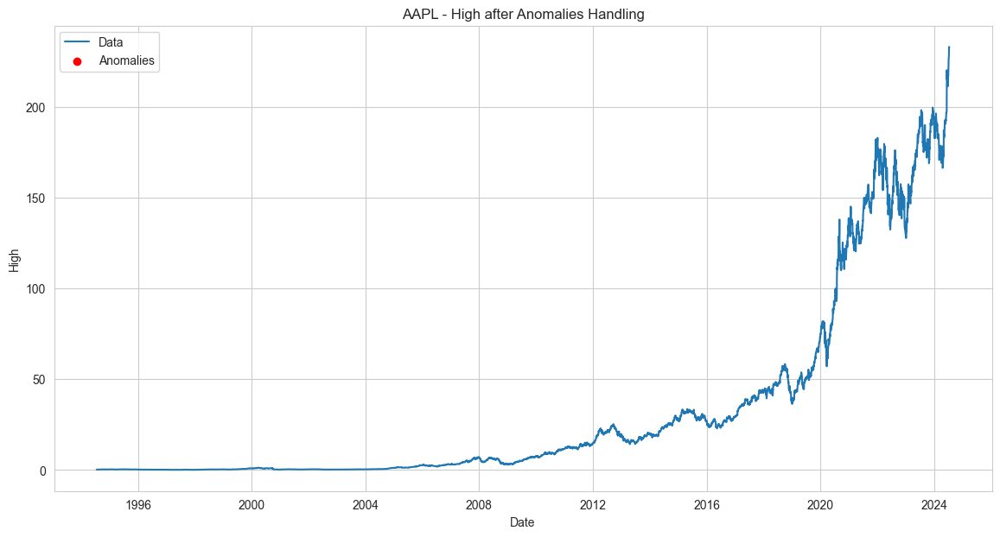

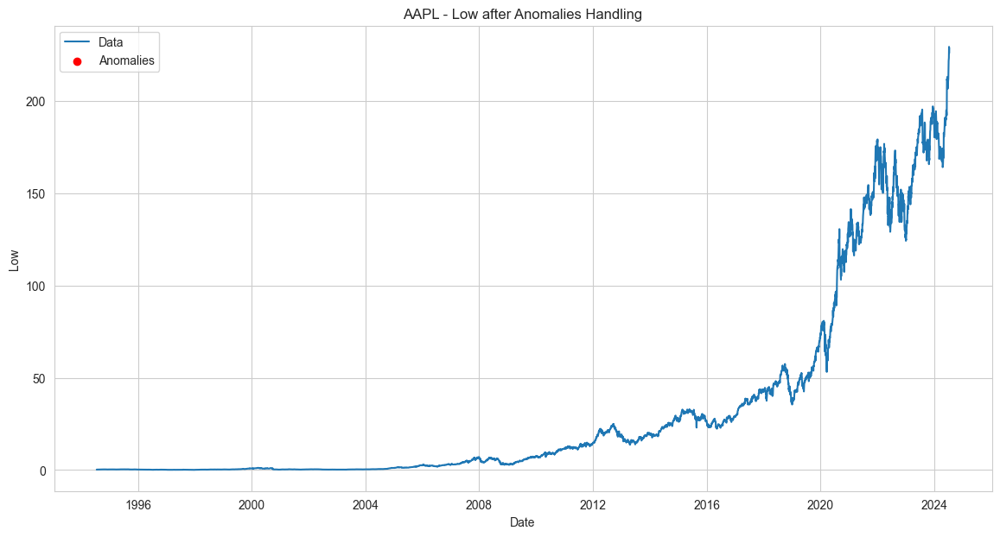

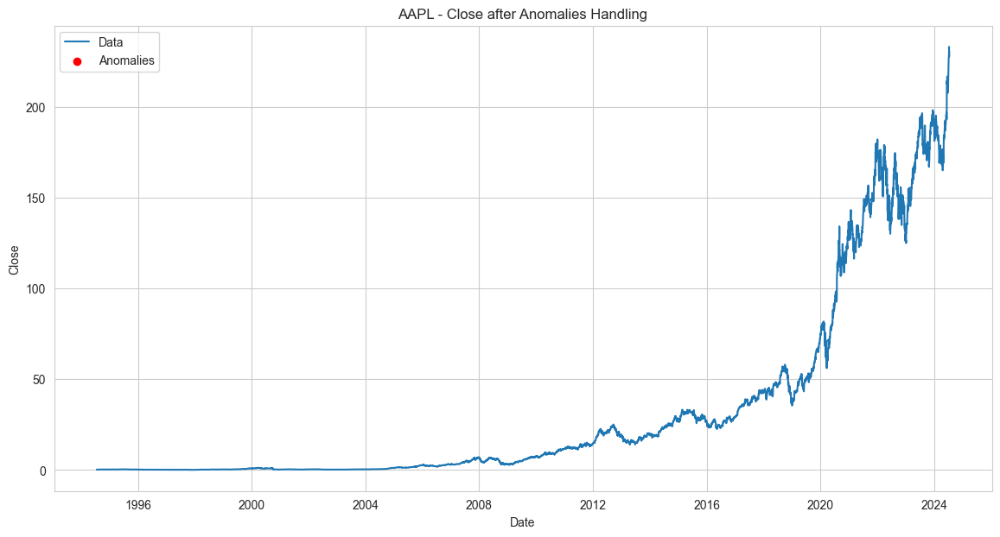

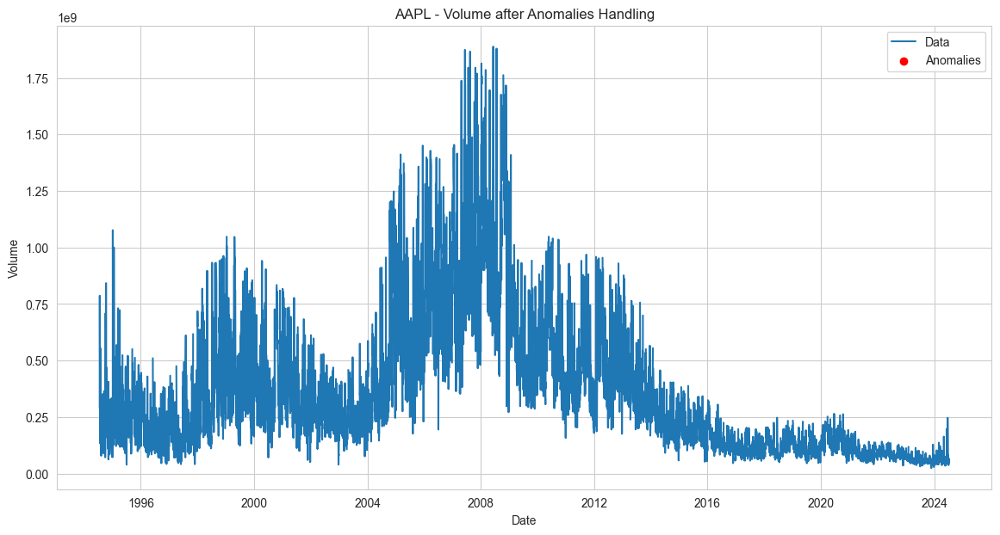

...

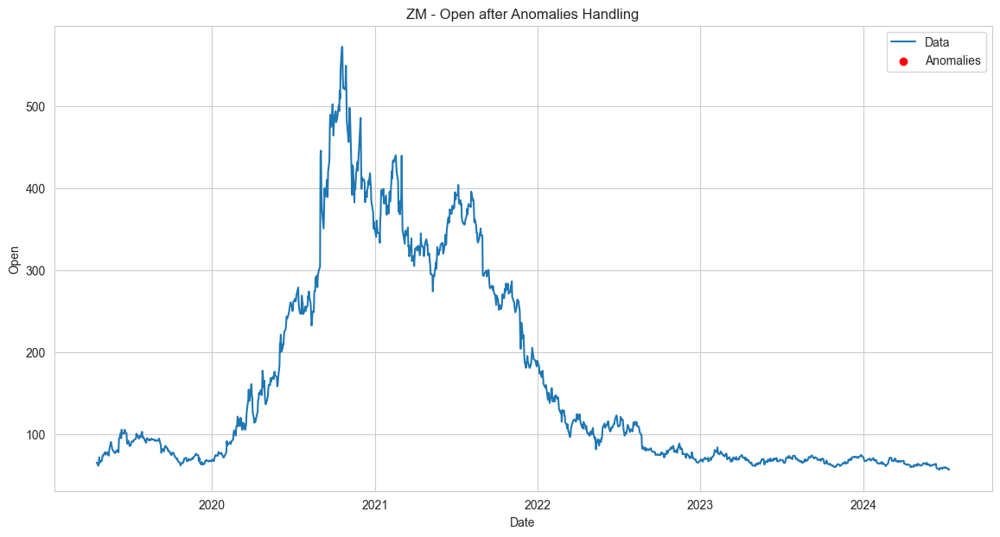

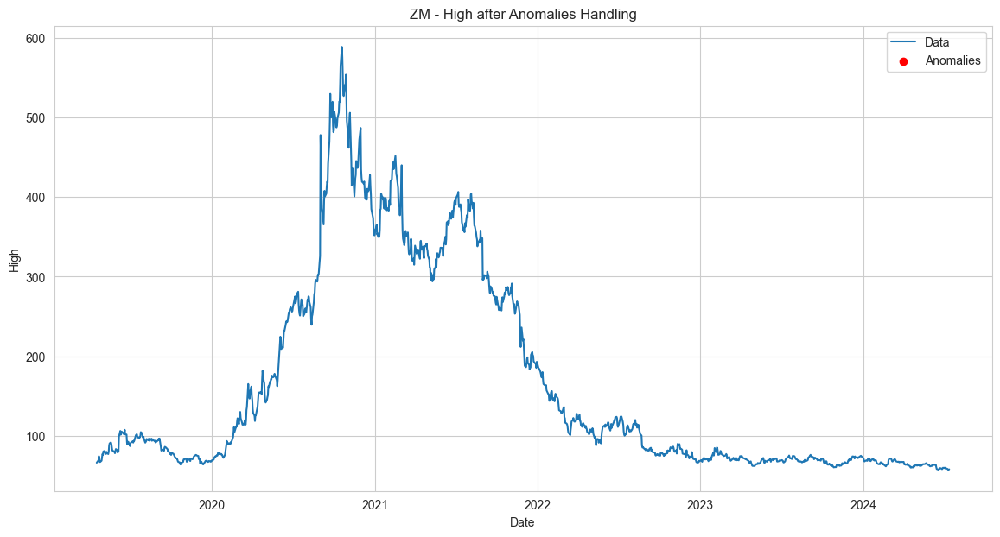

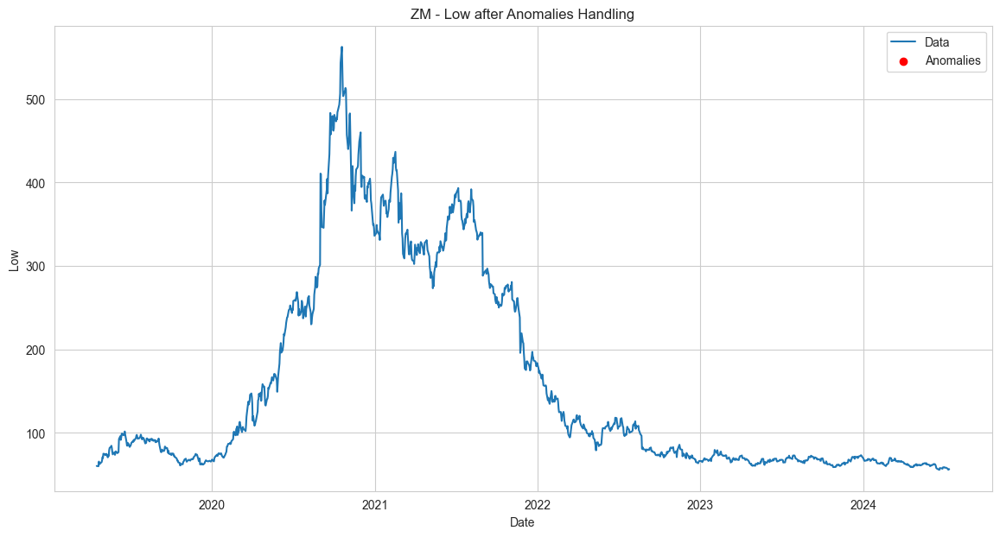

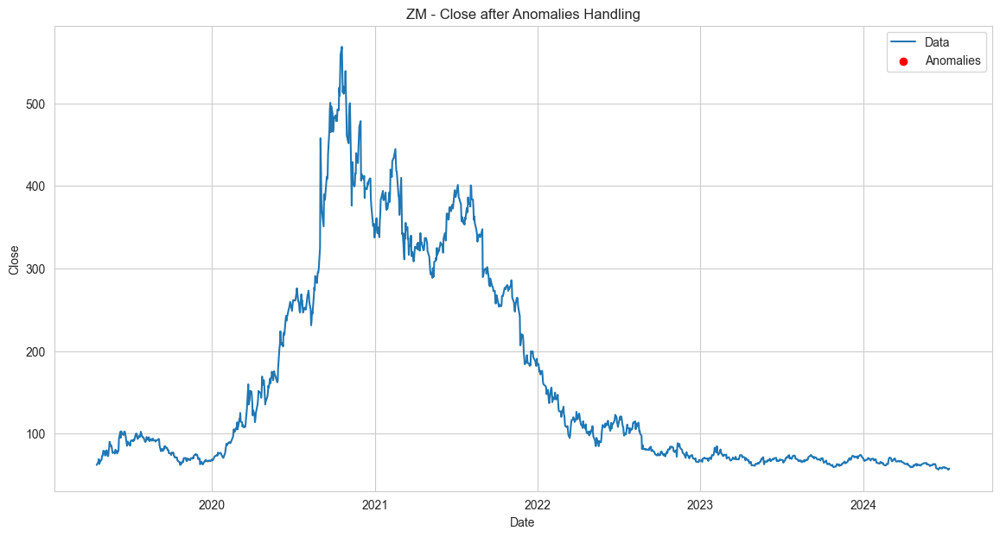

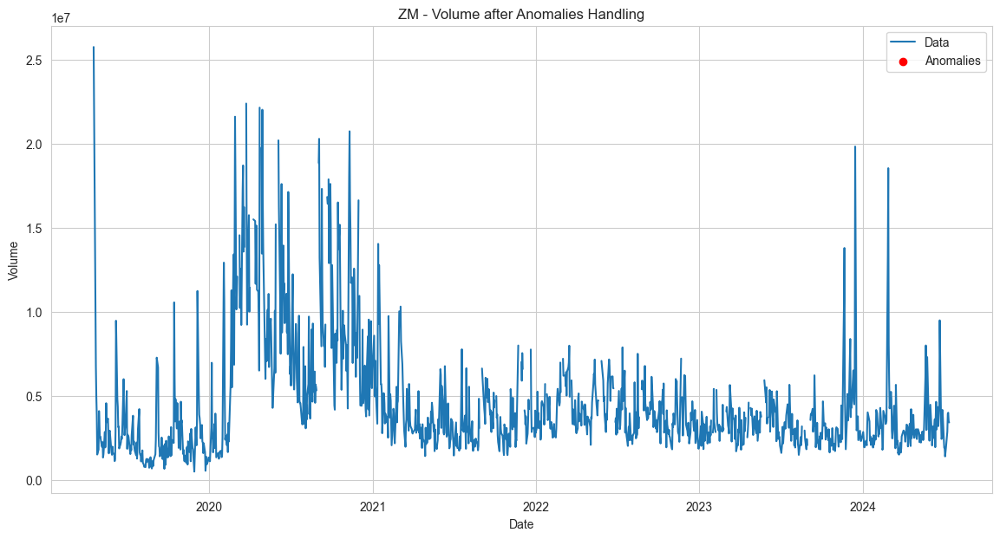

In [811]:
for ticker, df in cleaned_data.items():
    for column in ['Open', 'High', 'Low', 'Close', 'Volume']:
        plot_stock_data_with_anomalies(cleaned_data, ticker, column, is_anomalies=False)
    

In [812]:

os.makedirs("cleaned_data", exist_ok=True)
for ticker, df in cleaned_data.items():
    df.to_csv(f"cleaned_data/{ticker}_cleaned_data.csv", index=False)
    print(df.head())
    print(df.tail())    


                Open      High       Low     Close       Volume
Date                                                           
1994-07-21  0.237723  0.254464  0.236607  0.250000  289475200.0
1994-07-22  0.282366  0.285435  0.267857  0.276786  786576000.0
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400.0
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600.0
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000.0
                  Open        High         Low       Close      Volume
Date                                                                  
2024-07-08  227.089996  227.850006  223.250000  227.820007  59085900.0
2024-07-09  227.929993  229.399994  226.369995  228.679993  48076100.0
2024-07-10  229.300003  233.080002  229.250000  232.979996  62627700.0
2024-07-11  231.389999  232.389999  225.770004  227.570007  64710600.0
2024-07-12  228.919998  232.639999  228.679993  230.539993  53008200.0
                Open      High       Low     Close     

**Average of Opening and Closing Prices for Each Stock and Different Time Periods**


In [813]:

# Calculate average prices for each stock
for ticker, df in cleaned_data.items():
    avg_prices = calculate_average_prices(df)
    print(f"\nAverage prices for {ticker}:")
    for period, prices in avg_prices.items():
        print(f"\n{period.capitalize()} average prices:")
        print(prices)
    print(df.head())
    print(df.tail())



Average prices for AAPL:

Daily average prices:
                  Open       Close
Date                              
1994-07-21    0.237723    0.250000
1994-07-22    0.282366    0.276786
1994-07-23         NaN         NaN
1994-07-24         NaN         NaN
1994-07-25    0.277902    0.282924
...                ...         ...
2024-07-08  227.089996  227.820007
2024-07-09  227.929993  228.679993
2024-07-10  229.300003  232.979996
2024-07-11  231.389999  227.570007
2024-07-12  228.919998  230.539993

[10950 rows x 2 columns]

Weekly average prices:
                  Open       Close
Date                              
1994-07-24    0.260045    0.263393
1994-07-31    0.280357    0.285156
1994-08-07    0.296205    0.295647
1994-08-14    0.301563    0.305469
1994-08-21    0.309822    0.310491
...                ...         ...
2024-06-16  205.301999  208.014001
2024-06-23  213.819996  212.032497
2024-06-30  211.766000  211.036002
2024-07-07  217.472496  221.227501
2024-07-14  228.925998  22

**Day-to-Day and Month-to-Month Stock Price Changes**

In [814]:


# Calculate price changes for each stock
for ticker, df in cleaned_data.items():
    df = calculate_price_changes(df)
    cleaned_data[ticker] = df
    print(f"\nPrice changes for {ticker}:")
    print(df[['Daily Change', 'Monthly Change']].fillna(df['Monthly Change'].mean()).head())
    print(df.head(30))
    print(df.tail(30))



Price changes for AAPL:
            Daily Change  Monthly Change
Date                                    
1994-07-21      0.852814        0.852814
1994-07-22      0.026786        0.852814
1994-07-25      0.006138        0.852814
1994-07-26     -0.002790        0.852814
1994-07-27     -0.002790        0.852814
                Open      High       Low     Close       Volume  Daily Change  \
Date                                                                            
1994-07-21  0.237723  0.254464  0.236607  0.250000  289475200.0           NaN   
1994-07-22  0.282366  0.285435  0.267857  0.276786  786576000.0      0.026786   
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400.0      0.006138   
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600.0     -0.002790   
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000.0     -0.002790   
1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600.0      0.007254   
1994-07-29  0.284598  0.303571  0.284598

/var/folders/t8/c116jkz901vd_1zfgkw3g7rm0000gn/T/ipykernel_53602/3464213738.py:169: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Monthly Change'].fillna(method='ffill', inplace=True)
/var/folders/t8/c116jkz901vd_1zfgkw3g7rm0000gn/T/ipykernel_53602/3464213738.py:169: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['Monthly Change'].fillna(method='ffill', inplace=True)
/var/folders/t8/c116jkz901vd_1zfgkw3g7rm0000gn/T/ipykernel_53602/34

**Daily Return Based on Opening and Closing Prices**

In [815]:
# Calculate the daily return for each stock

In [816]:
# Fonction pour calculer le retour quotidien
def calculate_daily_return(df):
    df['Daily Return'] = (df['Close'] - df['Open']) / df['Open']
    return df

# Assurer que 'Date' est une colonne dans le DataFrame
def ensure_date_column(df):
    if df.index.name == 'Date':
        df = df.reset_index()
    return df

# Calculer le retour quotidien pour chaque action
for ticker, df in cleaned_data.items():
    df = ensure_date_column(df)  # S'assurer que 'Date' est dans les colonnes
    df = calculate_daily_return(df)
    cleaned_data[ticker] = df
    print(f"\nDaily return for {ticker}:")
    print(df[['Date', 'Daily Return']].dropna().head())
    print(df.head())
    print(df.tail())



Daily return for AAPL:
        Date  Daily Return
0 1994-07-21      0.051644
1 1994-07-22     -0.019762
2 1994-07-25      0.018071
3 1994-07-26     -0.011810
4 1994-07-27     -0.006000
        Date      Open      High       Low     Close       Volume  \
0 1994-07-21  0.237723  0.254464  0.236607  0.250000  289475200.0   
1 1994-07-22  0.282366  0.285435  0.267857  0.276786  786576000.0   
2 1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400.0   
3 1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600.0   
4 1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000.0   

   Daily Change  Monthly Change  Daily Return  
0           NaN             NaN      0.051644  
1      0.026786             NaN     -0.019762  
2      0.006138             NaN      0.018071  
3     -0.002790             NaN     -0.011810  
4     -0.002790             NaN     -0.006000  
           Date        Open        High         Low       Close      Volume  \
7542 2024-07-08  227.089996  227

**Stock with the Highest Daily Return**

In [817]:
# Find the stock with the highest daily return
average_daily_return = {}

for ticker, df in cleaned_data.items():
    df['Daily Return'] = df['Close'].pct_change(fill_method=None)
    avg_return = df['Daily Return'].mean()
    average_daily_return[ticker] = avg_return

best_stock = max(average_daily_return, key=average_daily_return.get)
print(f"\nStock with the highest average daily return: {best_stock} with an average return of {average_daily_return[best_stock]}")



Stock with the highest average daily return: TSLA with an average return of 0.002091304198747489


**Average Daily Return for Different Periods (Week, Month, Year)**

In [818]:
# Assurer que 'Date' est une colonne dans le DataFrame avant de calculer le retour quotidien
def ensure_date_column(df):
    if df.index.name == 'Date':
        df = df.reset_index()
    return df

# Calculer le retour quotidien pour chaque action
for ticker, df in cleaned_data.items():
    df = ensure_date_column(df)
    df = calculate_daily_return(df)
    cleaned_data[ticker] = df
    print(f"\nDaily return for {ticker}:")
    print(df[['Date', 'Daily Return']].head())



Daily return for AAPL:
        Date  Daily Return
0 1994-07-21      0.051644
1 1994-07-22     -0.019762
2 1994-07-25      0.018071
3 1994-07-26     -0.011810
4 1994-07-27     -0.006000

Daily return for MSFT:
        Date  Daily Return
0 1994-07-21     -0.017995
1 1994-07-22      0.042526
2 1994-07-25      0.011111
3 1994-07-26     -0.014670
4 1994-07-27     -0.017370

Daily return for AMZN:
        Date  Daily Return
0 1997-05-15     -0.196578
1 1997-05-16     -0.121701
2 1997-05-19     -0.029584
3 1997-05-20     -0.054211
4 1997-05-21     -0.127392

Daily return for META:
        Date  Daily Return
0 2012-05-18     -0.090844
1 2012-05-21     -0.068437
2 2012-05-22     -0.049371
3 2012-05-23      0.020083
4 2012-05-24      0.002428

Daily return for GOOG:
        Date  Daily Return
0 2004-08-19      0.003400
1 2004-08-20      0.072270
2 2004-08-23     -0.012190
3 2004-08-24     -0.057264
4 2004-08-25      0.009909

Daily return for TSLA:
        Date  Daily Return
0 2010-06-29      0

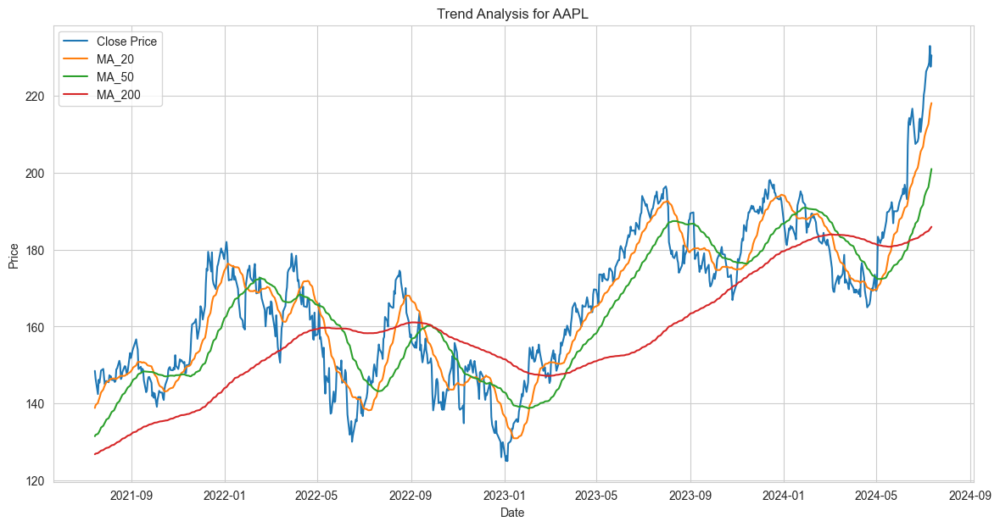

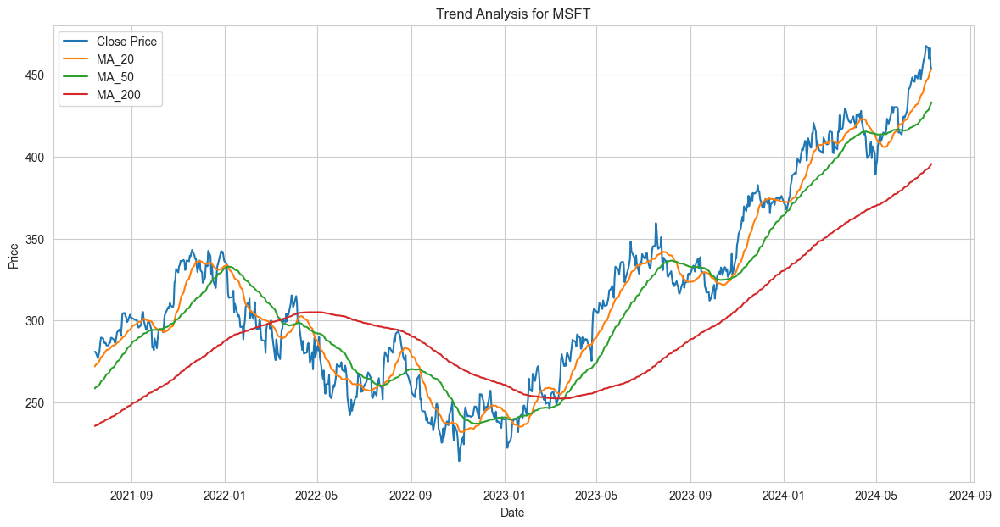

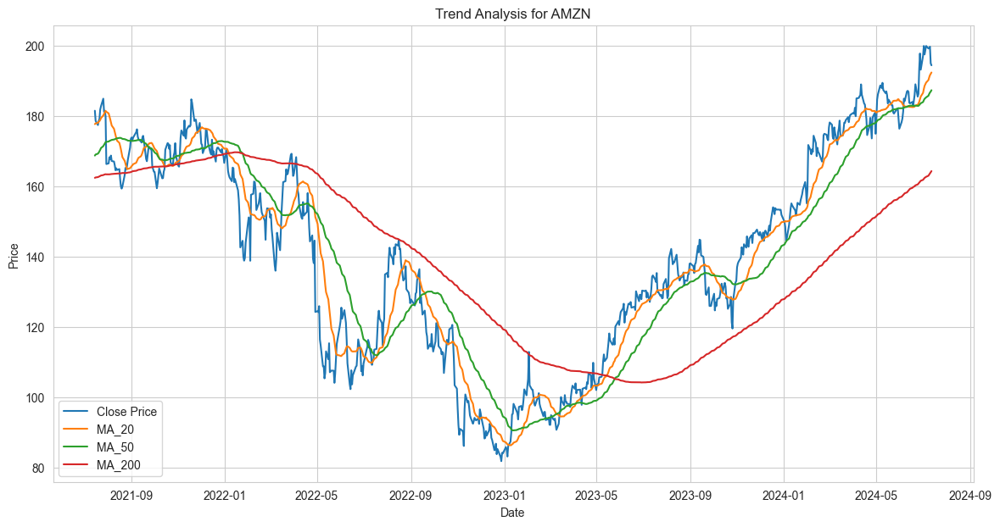

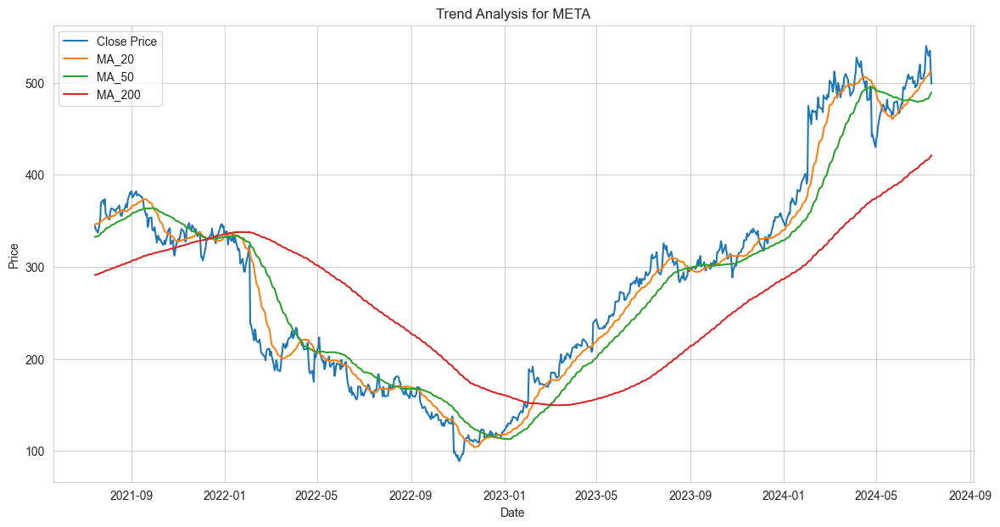

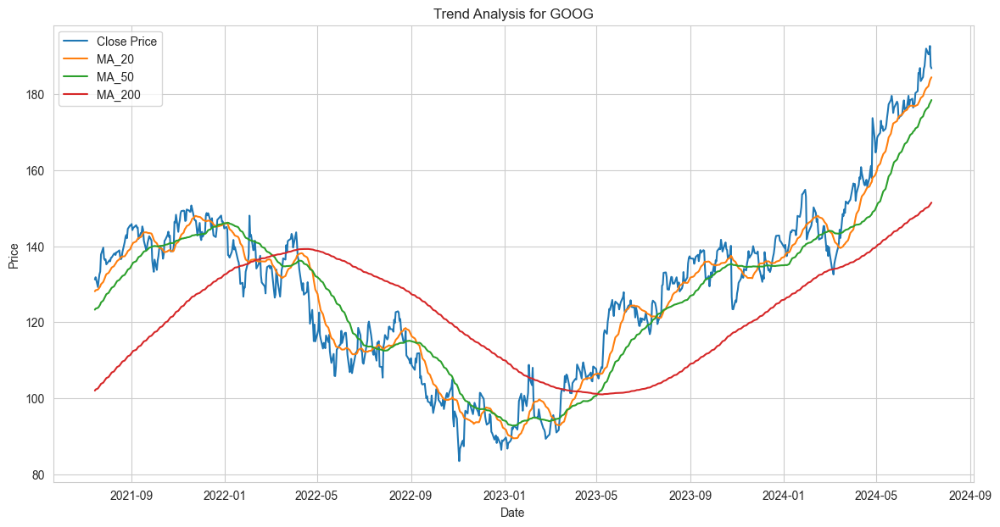

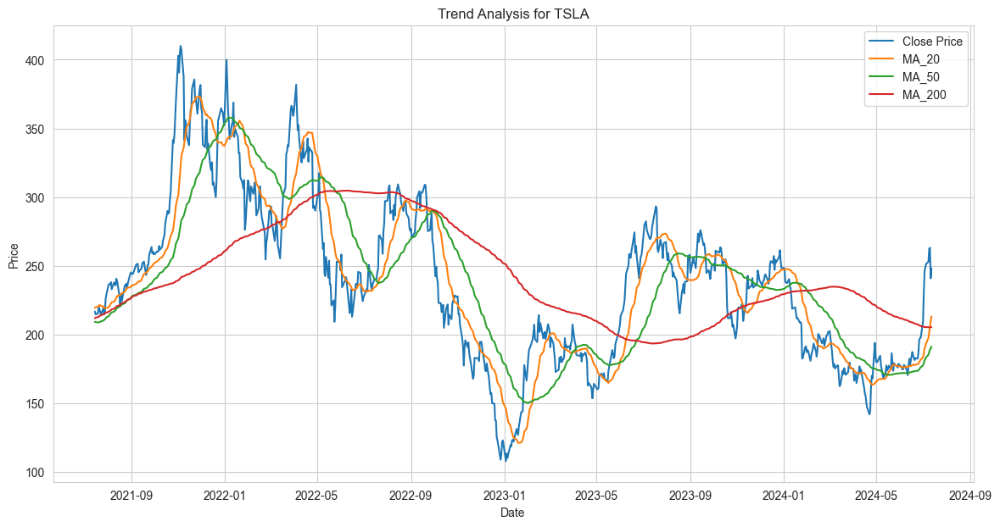

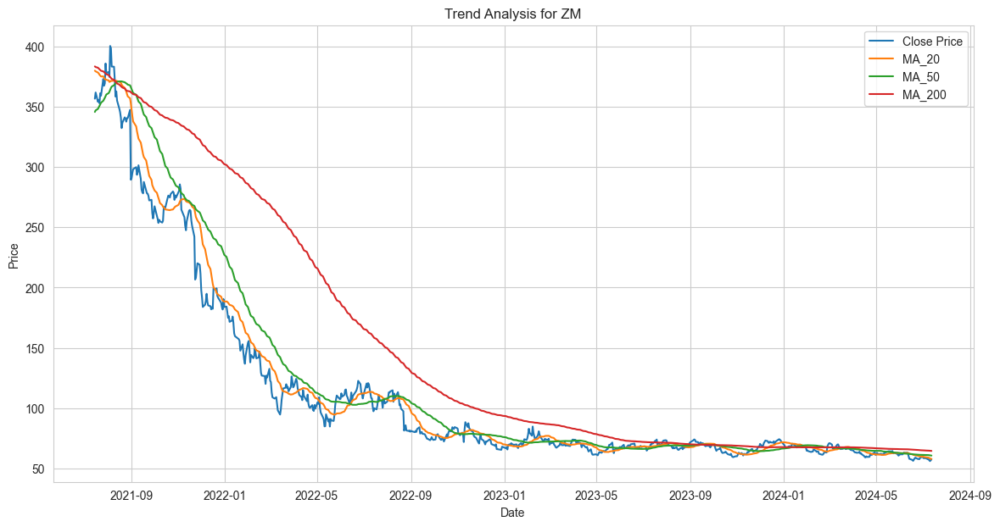

In [819]:
for ticker, df in cleaned_data.items():
    df = calculate_moving_average(df, 'Close', 20)
    df = calculate_moving_average(df, 'Close', 50)
    df = calculate_moving_average(df, 'Close', 200)
    plot_trends(df, ticker)

In [820]:
for ticker, df in cleaned_data.items():
    print(f"\nStatistiques descriptives pour {ticker} :")
    print(descriptive_statistics(df))
    
for ticker, df in cleaned_data.items():
    print(f"Volatilité pour {ticker} : {calculate_volatility(df):.4f}")



Statistiques descriptives pour AAPL :
                                Date         Open         High          Low  \
count                           7547  7547.000000  7547.000000  7547.000000   
mean   2009-07-13 10:43:57.869352192    32.015779    32.361087    31.687149   
min              1994-07-21 00:00:00     0.114955     0.118304     0.113839   
25%              2002-01-15 12:00:00     0.408571     0.416183     0.400268   
50%              2009-07-15 00:00:00     6.595000     6.658929     6.475000   
75%              2017-01-10 12:00:00    32.502501    32.718750    32.253750   
max              2024-07-12 00:00:00   231.389999   233.080002   229.250000   
std                              NaN    51.989054    52.551778    51.474680   

             Close        Volume  Daily Change  Monthly Change  Daily Return  \
count  7547.000000  7.194000e+03   7546.000000     7518.000000   7547.000000   
mean     32.038072  3.490299e+08      0.030518        0.852814      0.000235   
min      

In [821]:
for ticker, df in cleaned_data.items():
    print(df.head())
    print(df.tail())

        Date      Open      High       Low     Close       Volume  \
0 1994-07-21  0.237723  0.254464  0.236607  0.250000  289475200.0   
1 1994-07-22  0.282366  0.285435  0.267857  0.276786  786576000.0   
2 1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400.0   
3 1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600.0   
4 1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000.0   

   Daily Change  Monthly Change  Daily Return  MA_20  MA_50  MA_200  \
0           NaN             NaN      0.051644    NaN    NaN     NaN   
1      0.026786             NaN     -0.019762    NaN    NaN     NaN   
2      0.006138             NaN      0.018071    NaN    NaN     NaN   
3     -0.002790             NaN     -0.011810    NaN    NaN     NaN   
4     -0.002790             NaN     -0.006000    NaN    NaN     NaN   

   daily_return  
0           NaN  
1      0.107144  
2      0.022176  
3     -0.009861  
4     -0.009960  
           Date        Open        High         Lo

In [822]:
performance_data = []
for ticker, df in cleaned_data.items():
    total_return = calculate_performance(df)
    annualized_return = calculate_annualized_return(df)
    sharpe_ratio = calculate_sharpe_ratio(df)
    performance_data.append({
        'Ticker': ticker,
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Sharpe Ratio': sharpe_ratio
    })

        Date      Open      High       Low     Close       Volume  \
0 1994-07-21  0.237723  0.254464  0.236607  0.250000  289475200.0   
1 1994-07-22  0.282366  0.285435  0.267857  0.276786  786576000.0   
2 1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400.0   
3 1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600.0   
4 1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000.0   

   Daily Change  Monthly Change  Daily Return  MA_20  MA_50  MA_200  \
0           NaN             NaN      0.051644    NaN    NaN     NaN   
1      0.026786             NaN     -0.019762    NaN    NaN     NaN   
2      0.006138             NaN      0.018071    NaN    NaN     NaN   
3     -0.002790             NaN     -0.011810    NaN    NaN     NaN   
4     -0.002790             NaN     -0.006000    NaN    NaN     NaN   

   daily_return  
0           NaN  
1      0.107144  
2      0.022176  
3     -0.009861  
4     -0.009960  
           Date        Open        High         Lo

In [823]:
performance_df = pd.DataFrame(performance_data)
print(performance_df)

# Analyse de corrélation entre les actions
correlation_matrix = calculate_correlation(cleaned_data)
print("Matrice de corrélation :")
print(correlation_matrix)


  Ticker  Total Return  Annualized Return  Sharpe Ratio
0   AAPL    921.159973           0.255751     -0.326626
1   MSFT    150.974865           0.182448     -0.466720
2   AMZN   1985.274187           0.322612     -0.233296
3   META     12.049176           0.235416     -0.349934
4   GOOG     73.737915           0.242130     -0.463599
5   TSLA    154.858066           0.432884     -0.220914
6     ZM     -0.071290          -0.014029     -0.250680
Matrice de corrélation :
          AAPL      MSFT      AMZN      META      GOOG      TSLA        ZM
AAPL  1.000000  0.423815 -0.048210 -0.020430  0.004732  0.012085 -0.030460
MSFT  0.423815  1.000000 -0.011225 -0.014022  0.009501 -0.010181 -0.004791
AMZN -0.048210 -0.011225  1.000000  0.007623 -0.010011  0.005840 -0.009191
META -0.020430 -0.014022  0.007623  1.000000  0.012475  0.007696  0.006740
GOOG  0.004732  0.009501 -0.010011  0.012475  1.000000  0.000182 -0.009014
TSLA  0.012085 -0.010181  0.005840  0.007696  0.000182  1.000000  0.007974
ZM

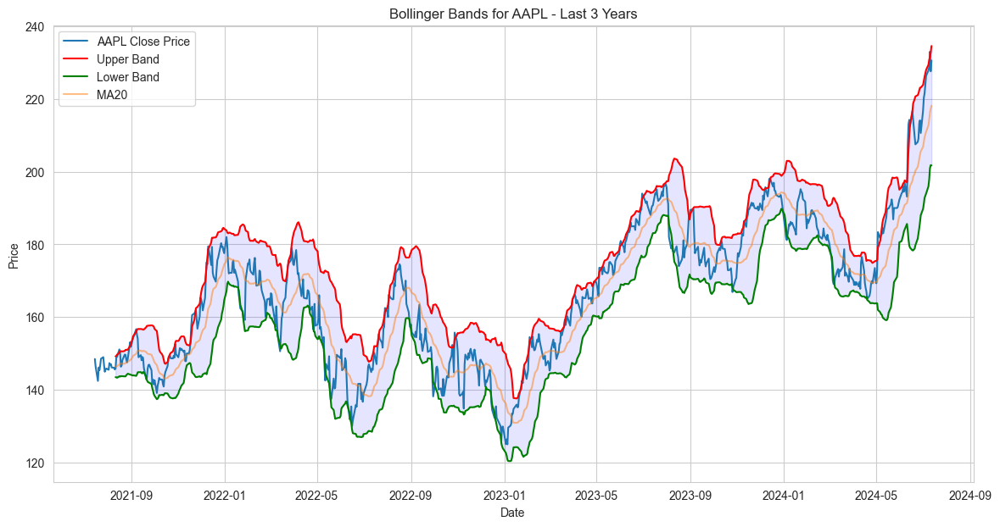

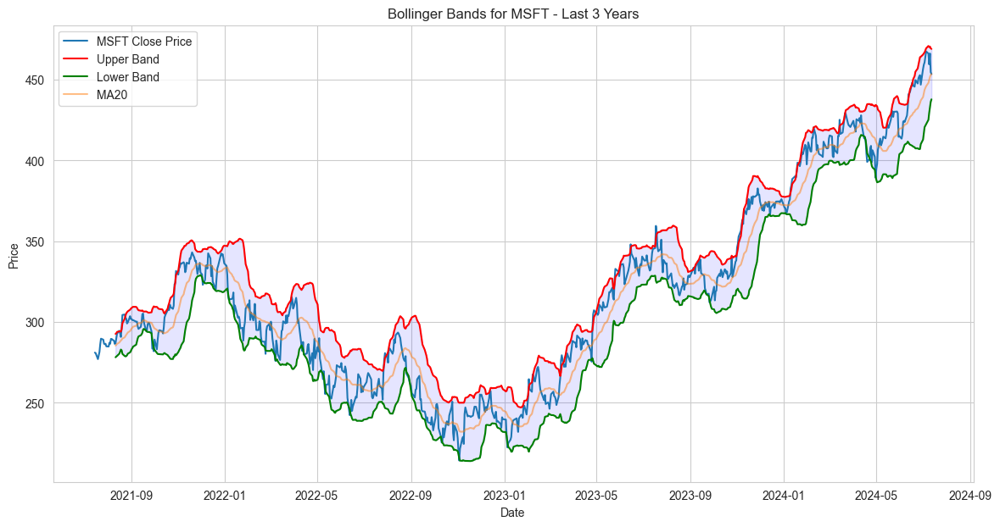

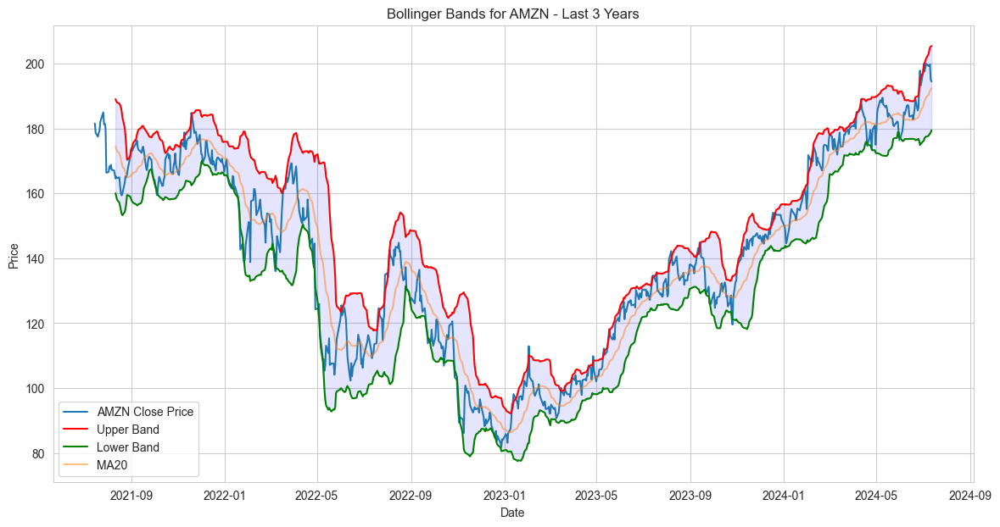

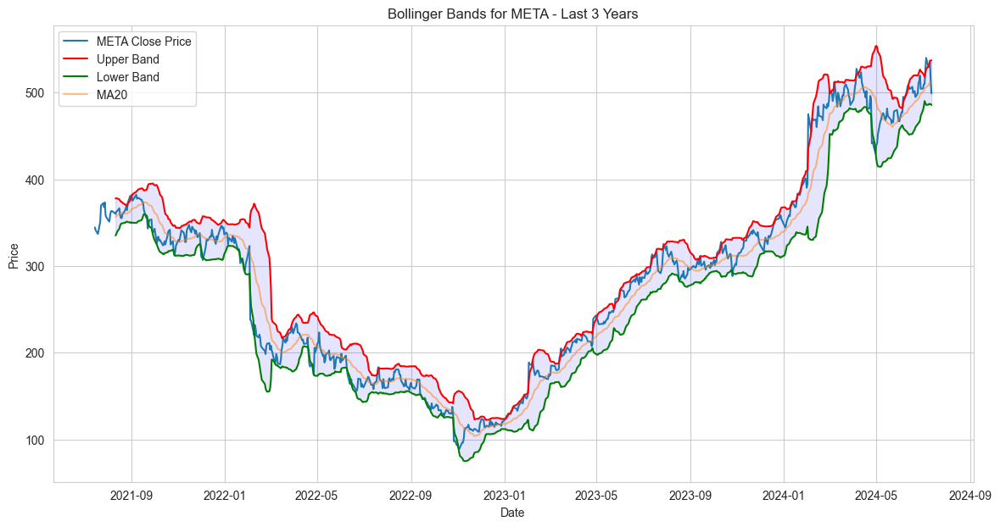

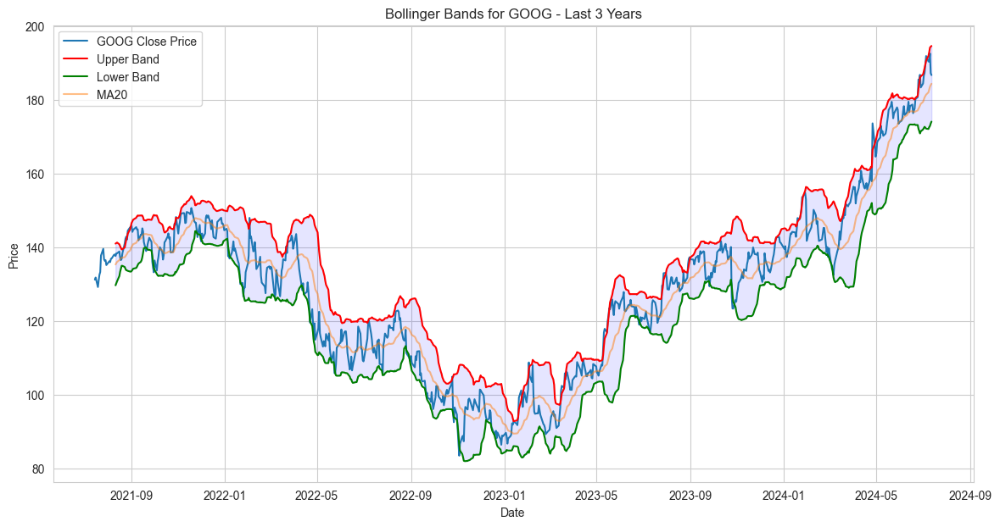

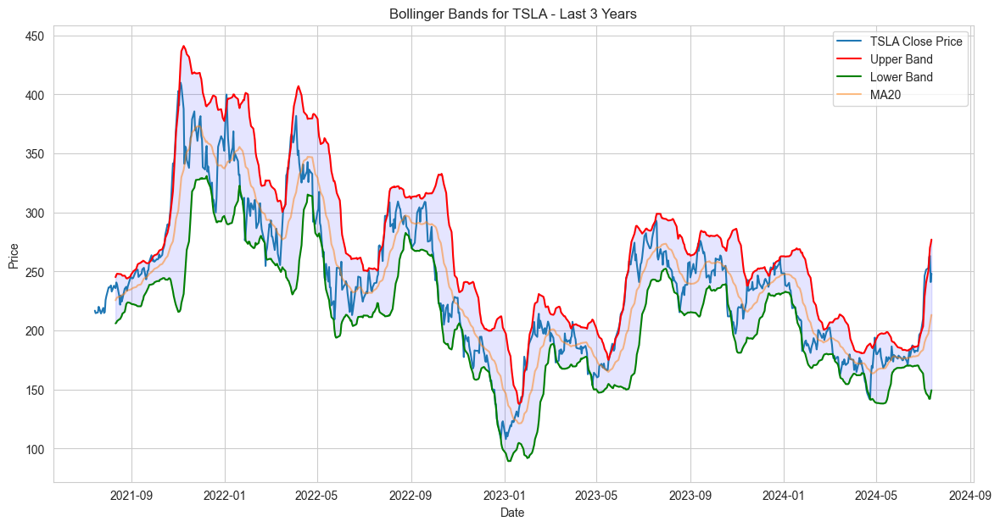

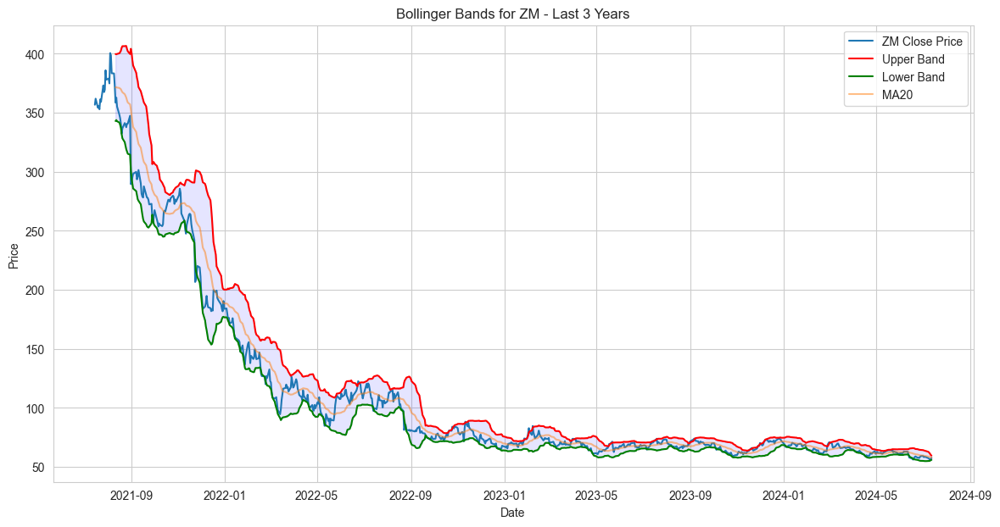

In [824]:
# calculate and plot the bollings

plot_bollinger_bands(cleaned_data, tickers)


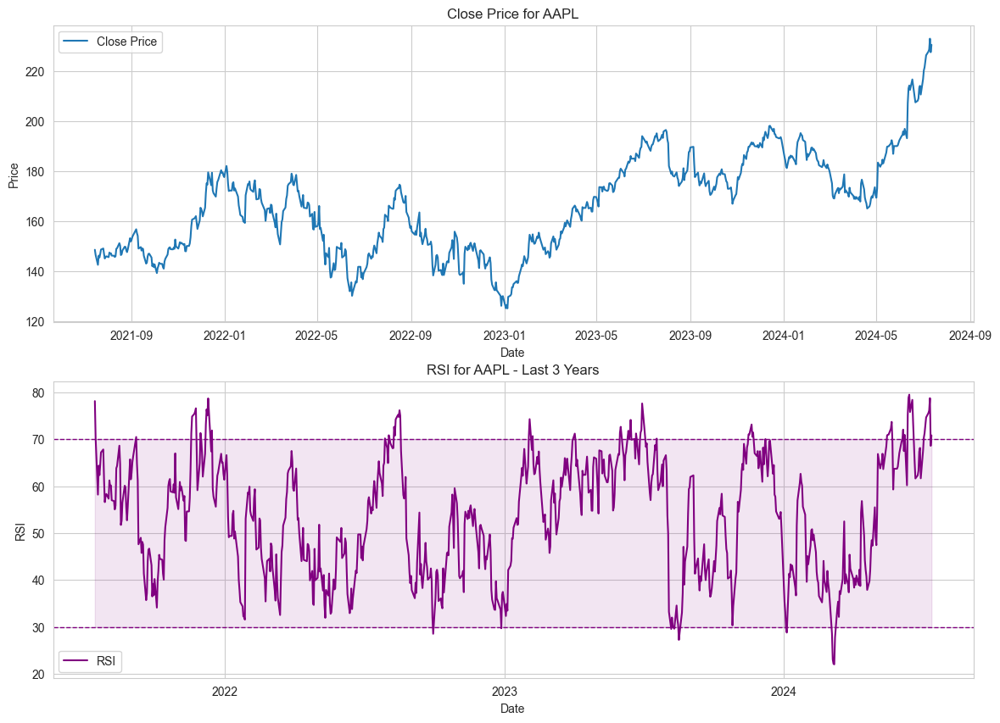

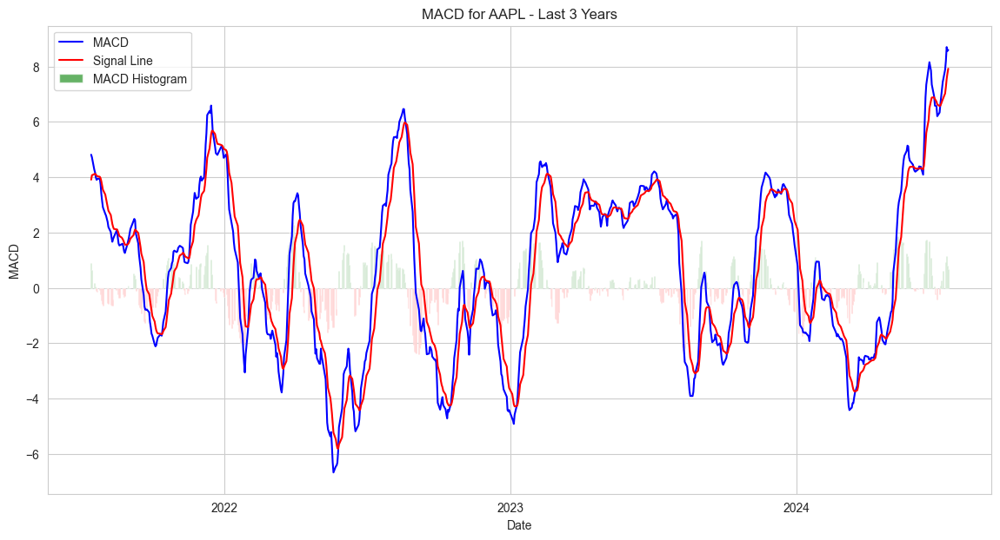

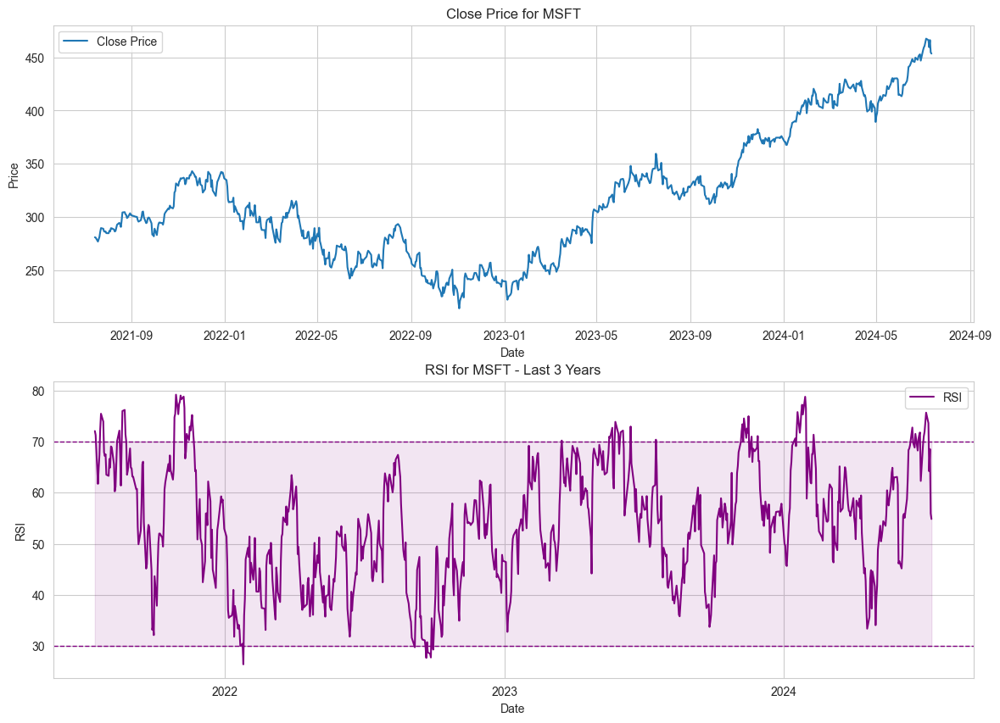

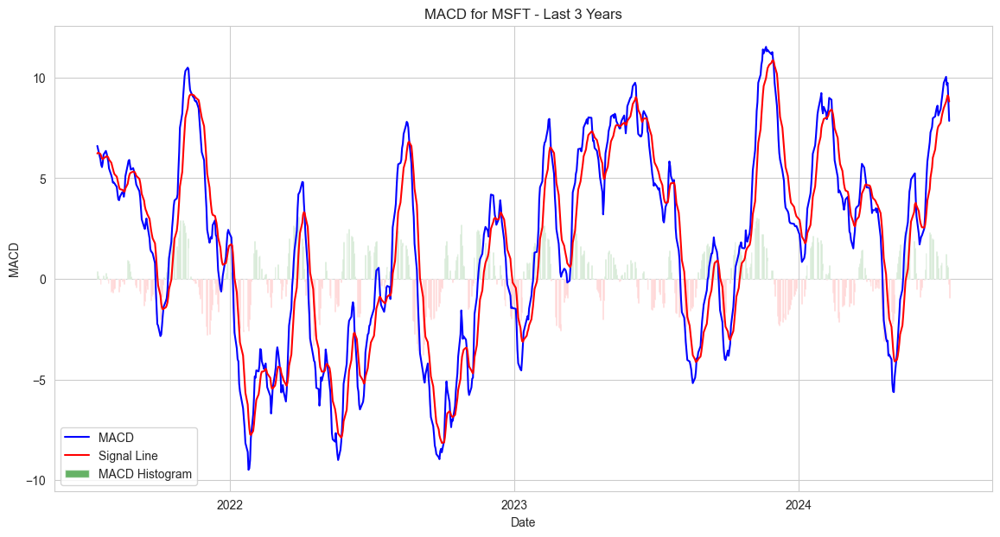

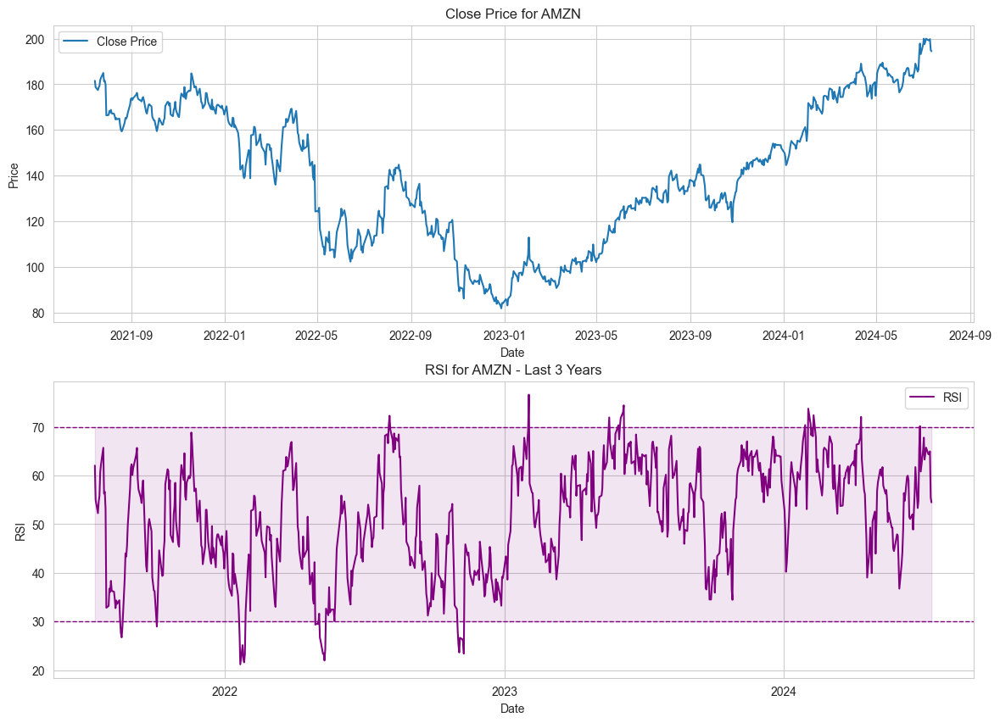

...

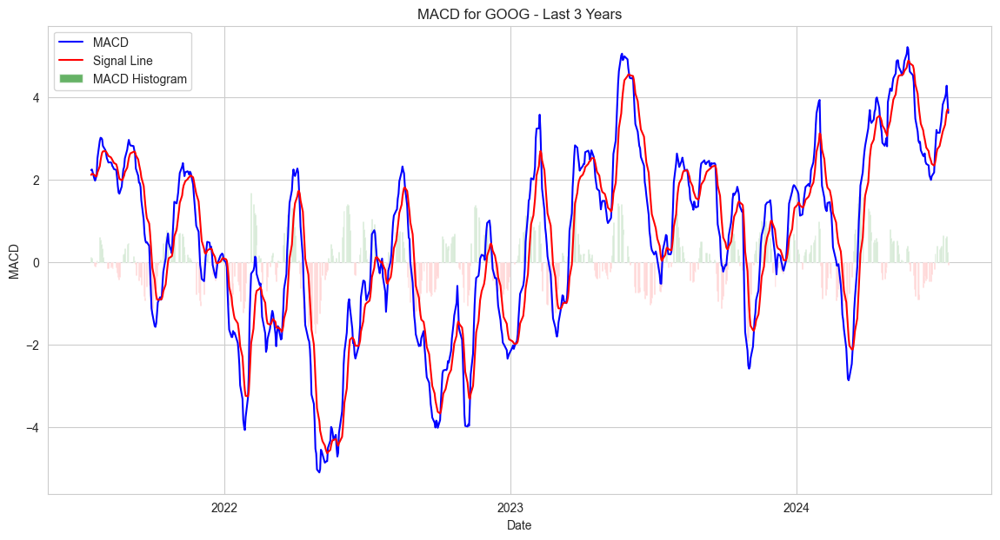

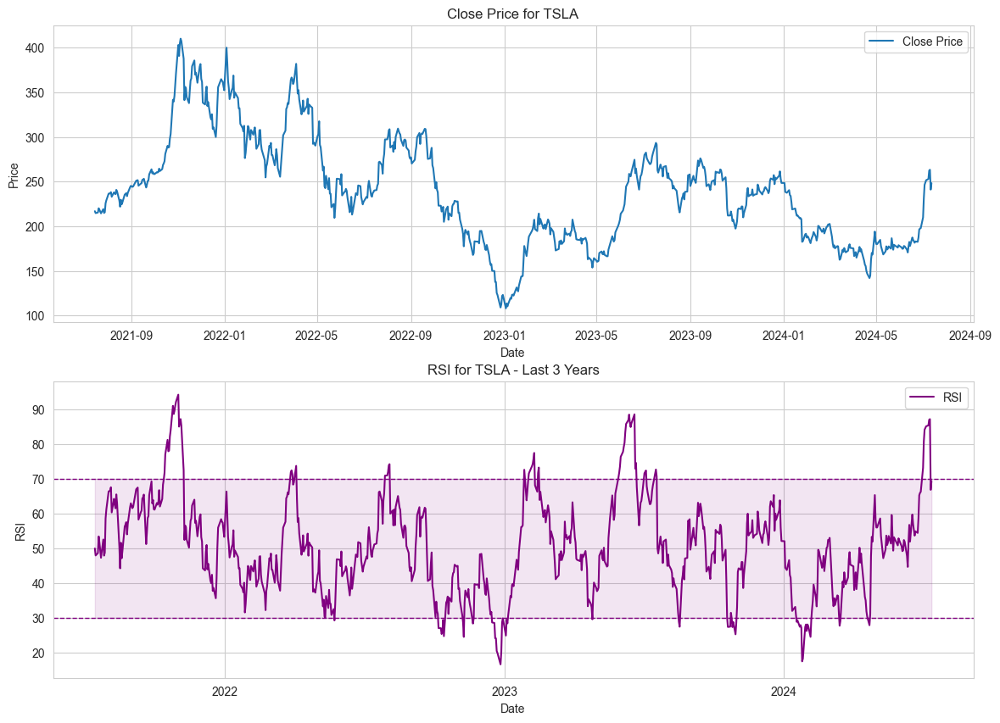

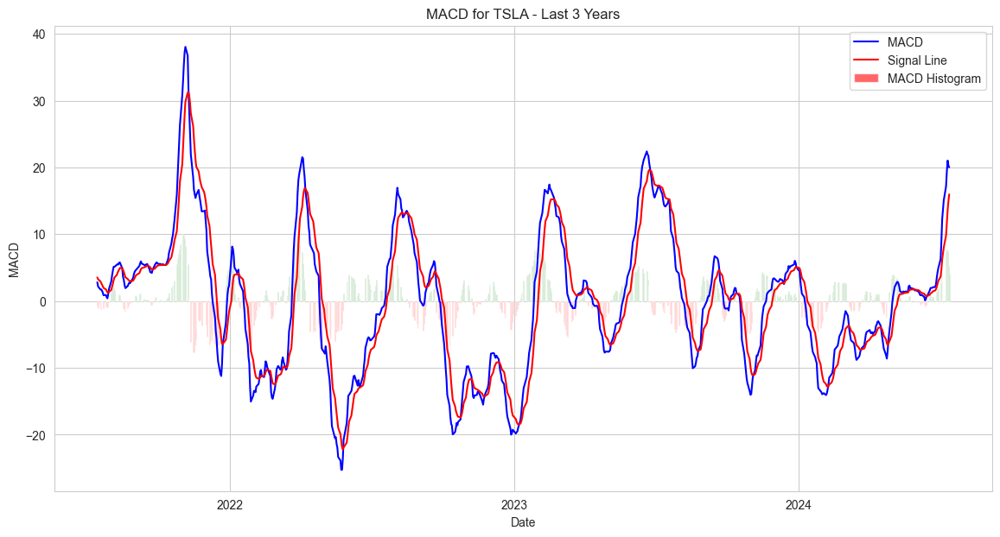

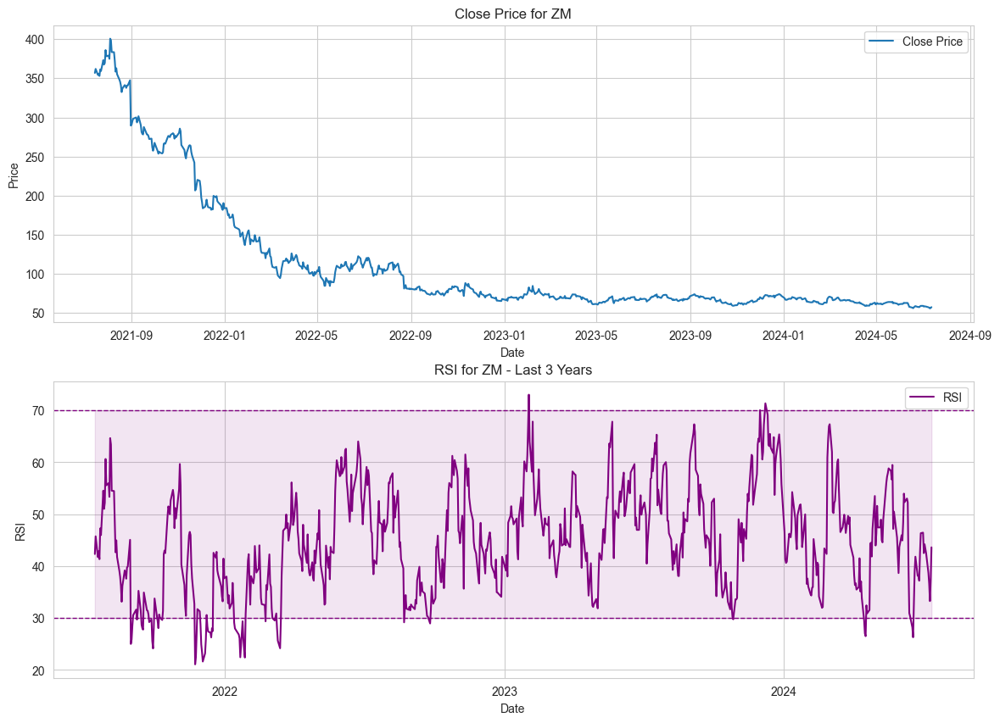

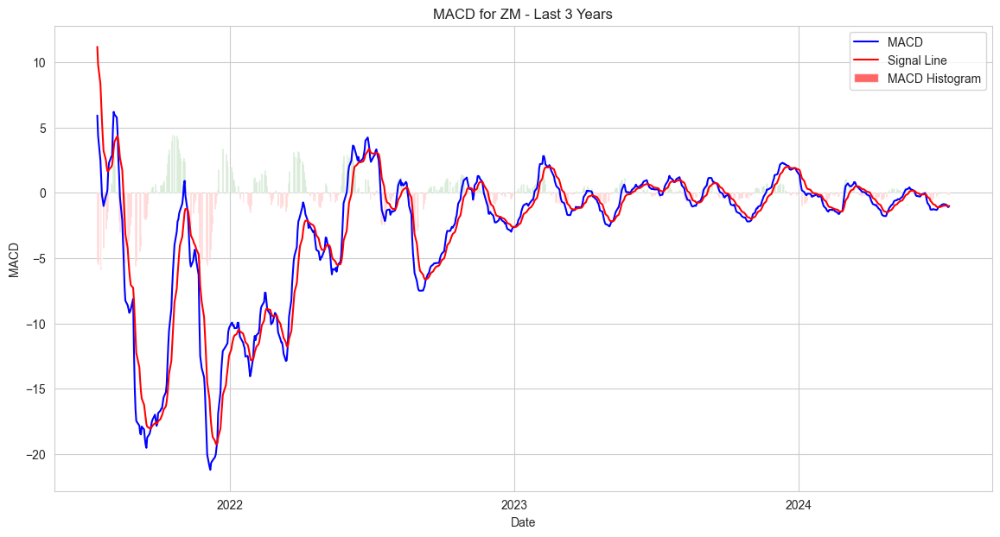

In [827]:
end_date = datetime.now()
start_date = end_date - timedelta(days=3*365)
for ticker in tickers:
    df = cleaned_data[ticker]
    df = calculate_macd(df)

    # Filter data for the last 3 years
    df_filtered = df[df['Date'] >= start_date]
    plot_close_price_with_rsi(df_filtered, ticker)
    plot_macd(ticker)


AAPL


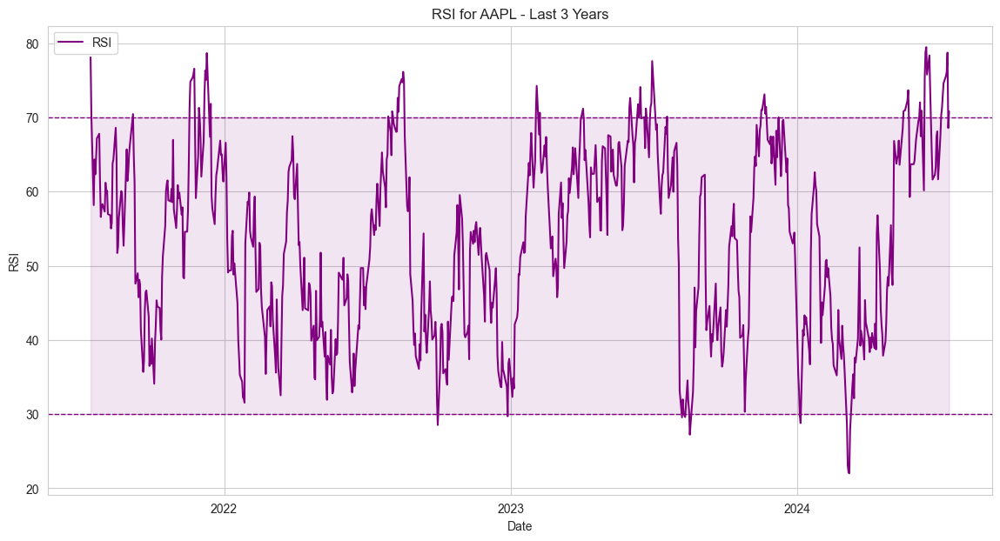

MSFT


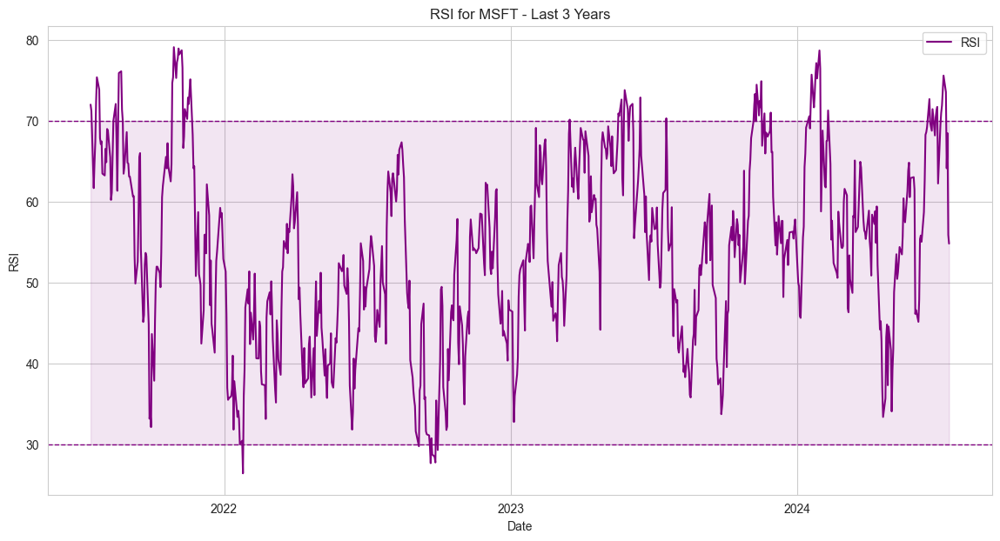

AMZN


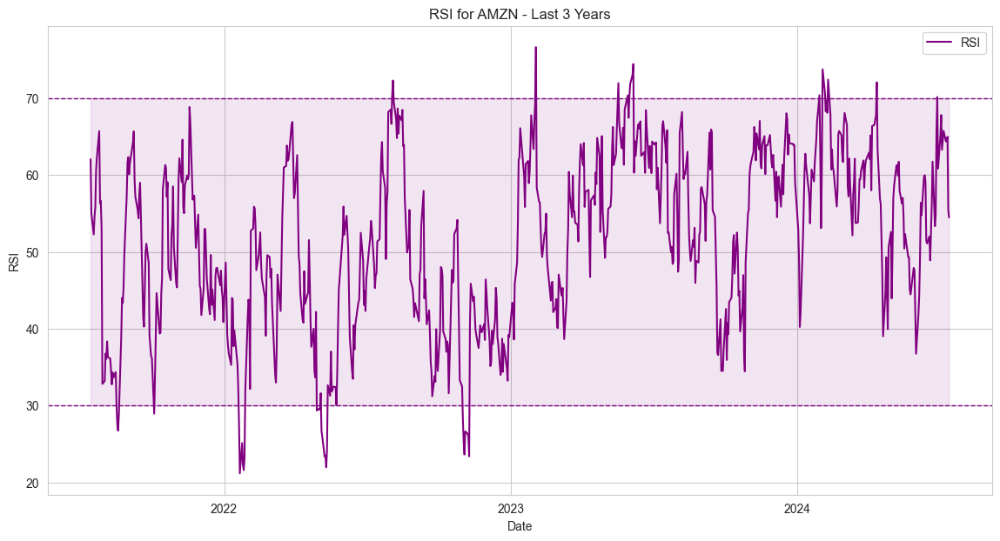

META


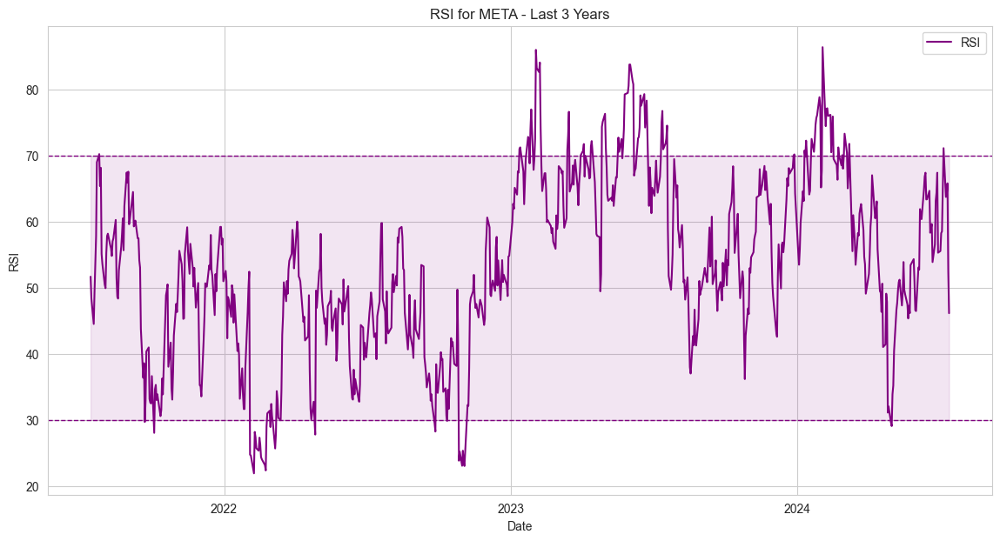

GOOG


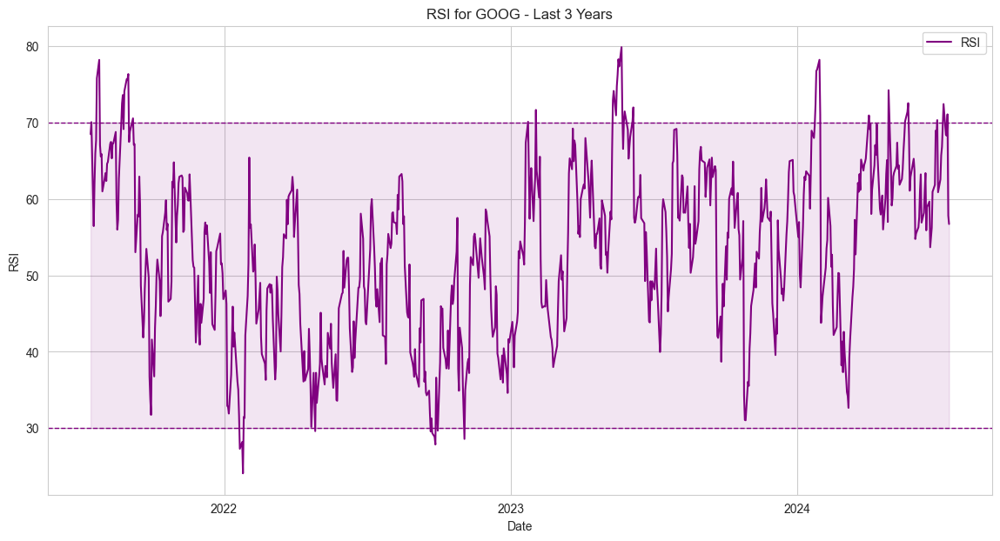

TSLA


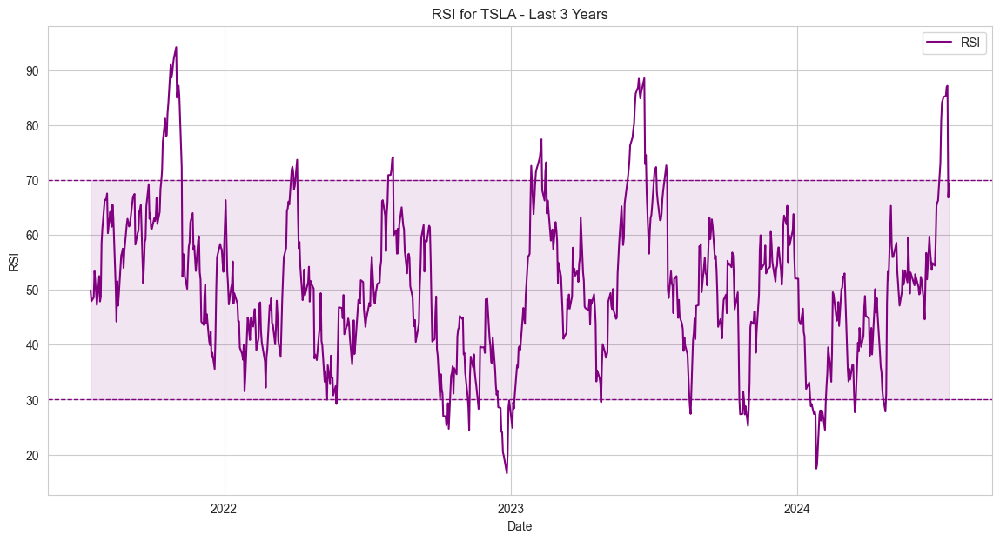

ZM


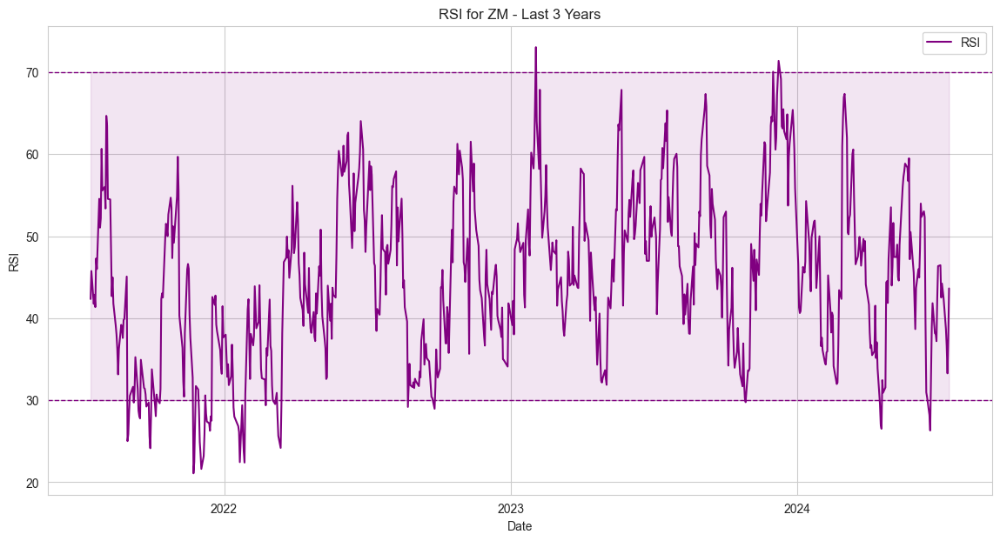

In [826]:
end_date = datetime.now()
start_date = end_date - timedelta(days=3*365)
for ticker in tickers:
    print(ticker)
    df = cleaned_data[ticker]
    df = calculate_rsi(df)

    # Filter data for the last 3 years
    
    plot_rsi(ticker)

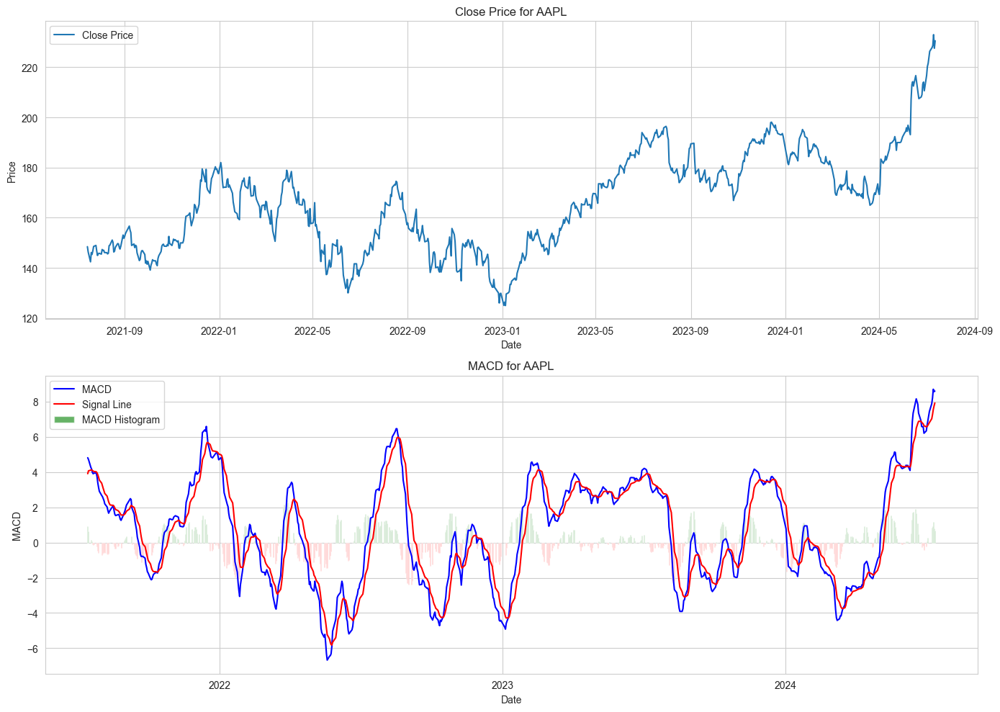

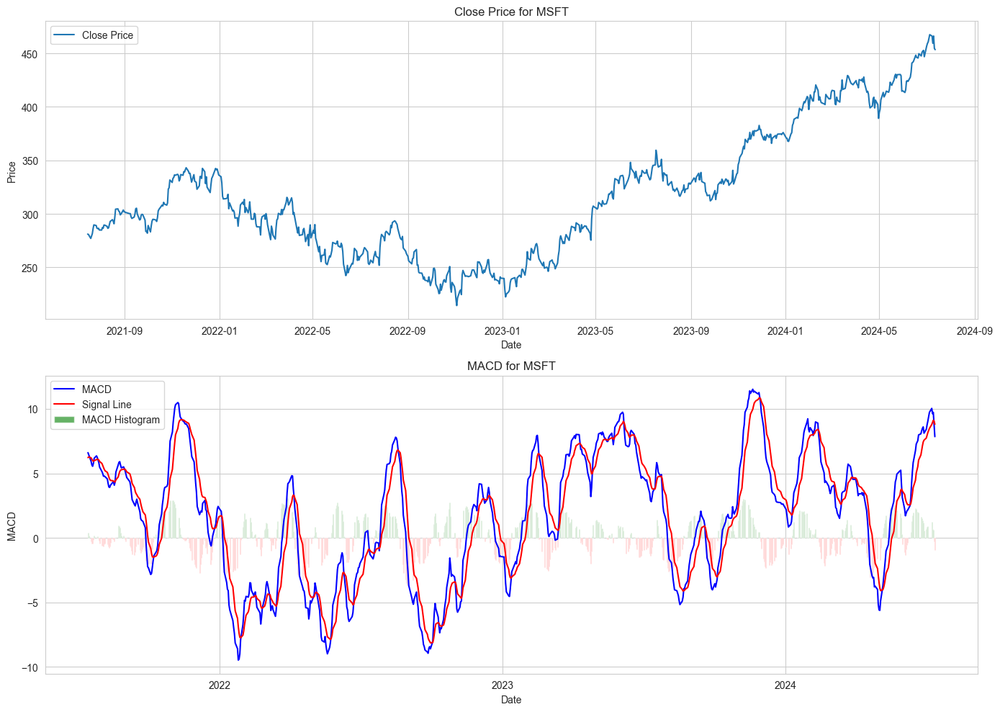

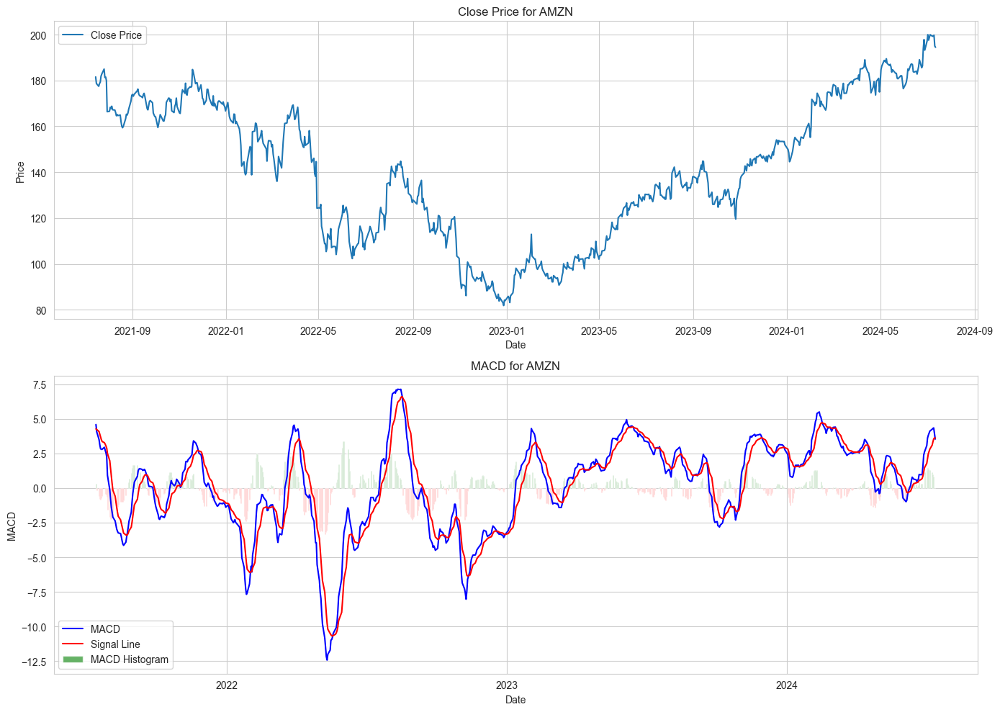

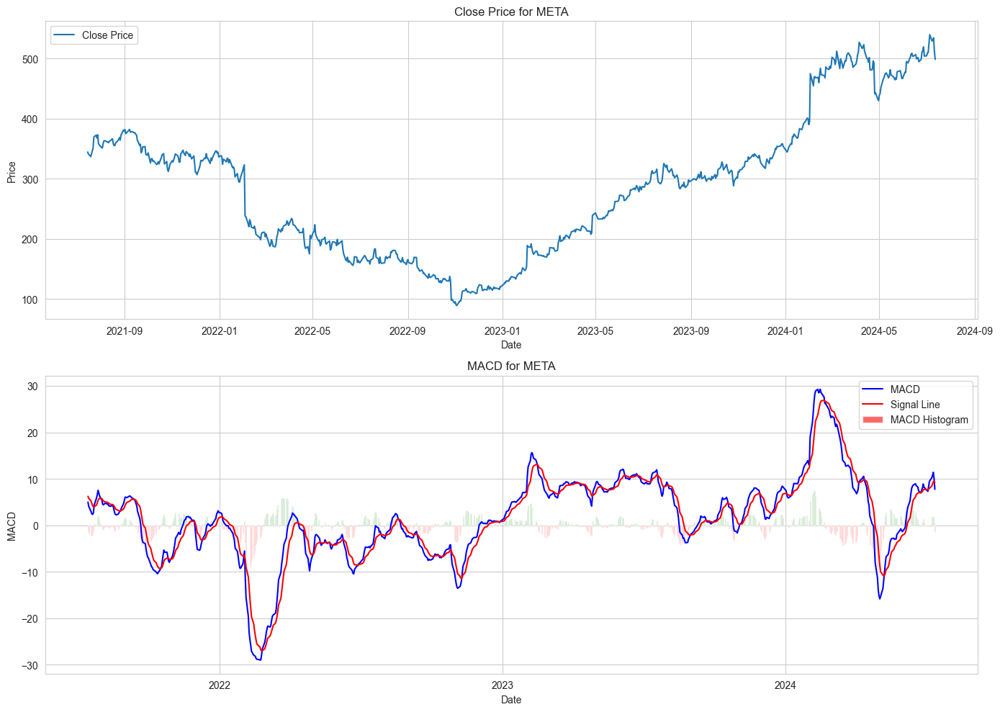

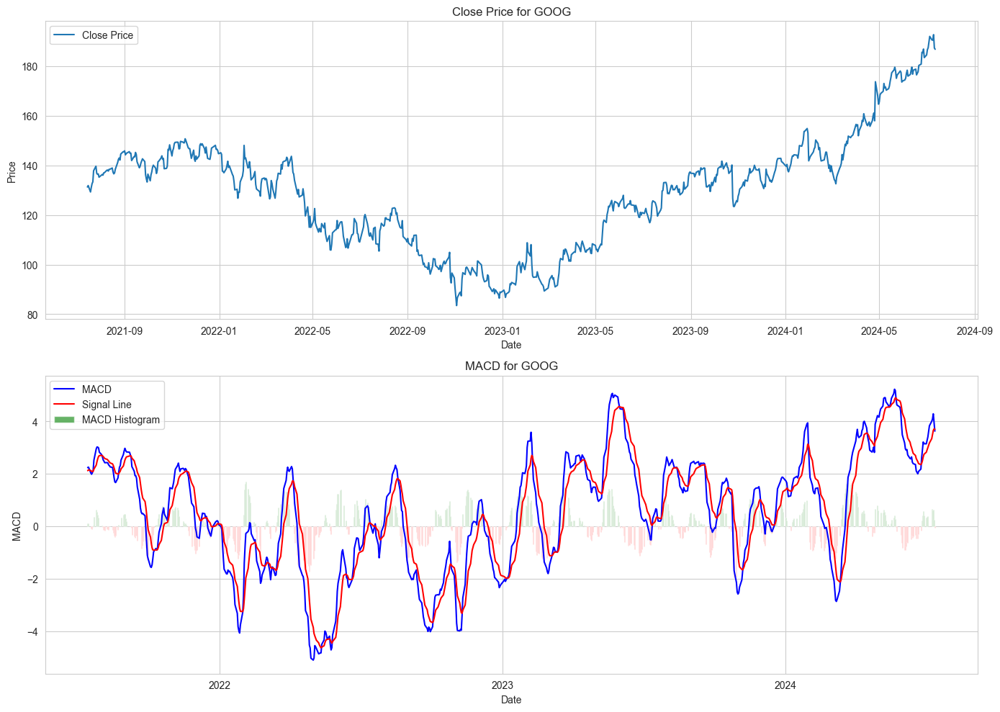

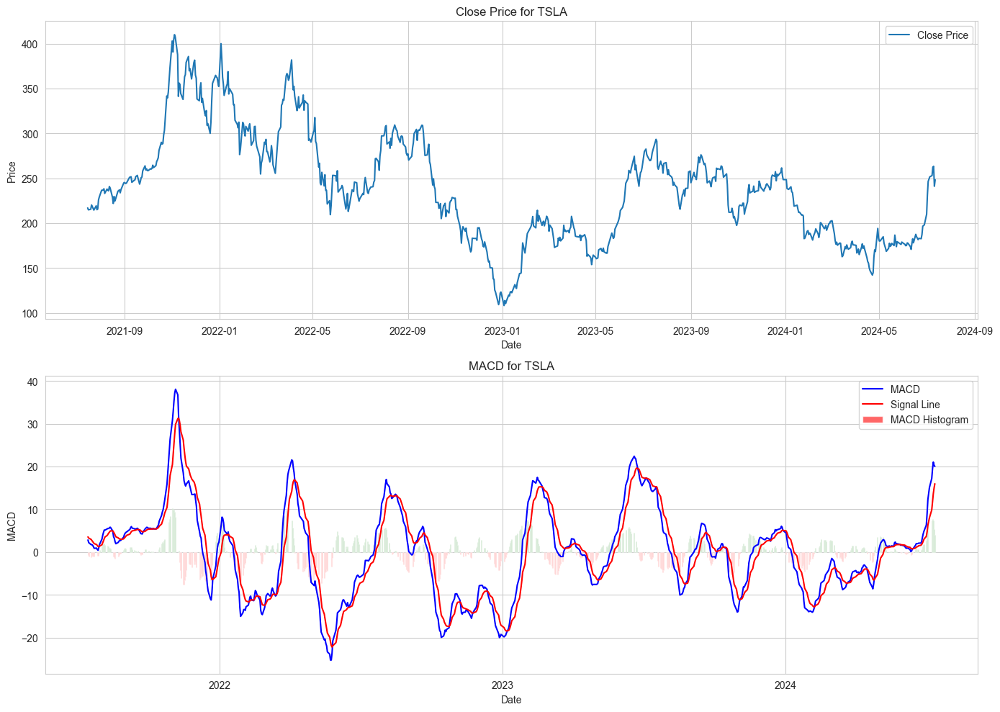

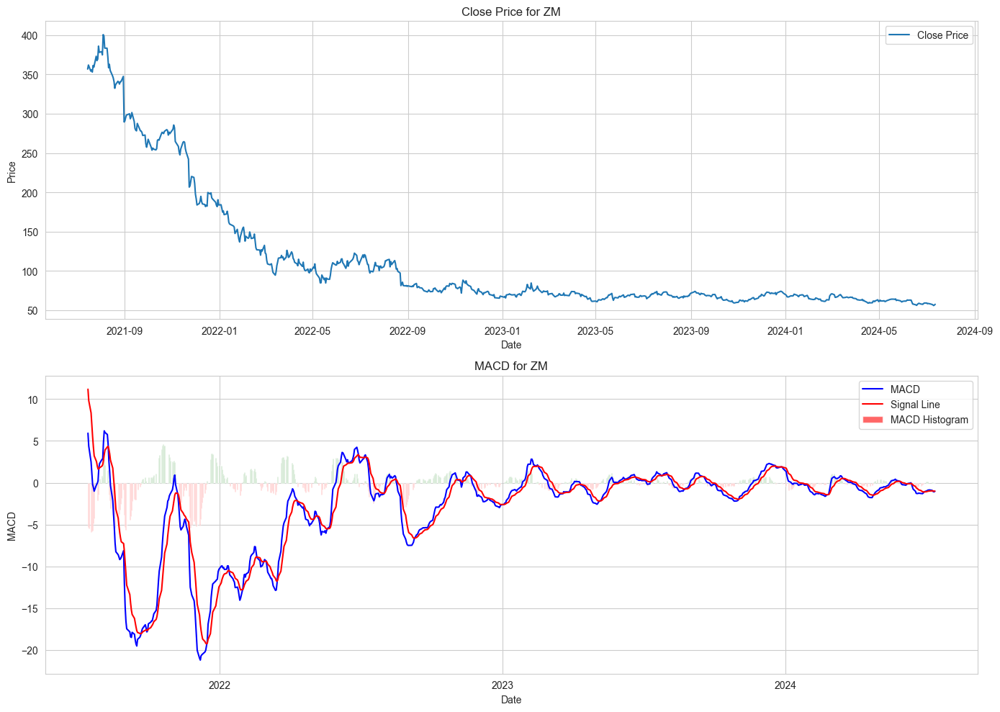

In [828]:

end_date = datetime.now()
start_date = end_date - timedelta(days=3*365)
for ticker in tickers:
    df = cleaned_data[ticker]
    df = calculate_macd(df)

    # Filter data for the last 3 years
    df_filtered = df[df['Date'] >= start_date]
    plot_close_price_with_macd(df_filtered, ticker)


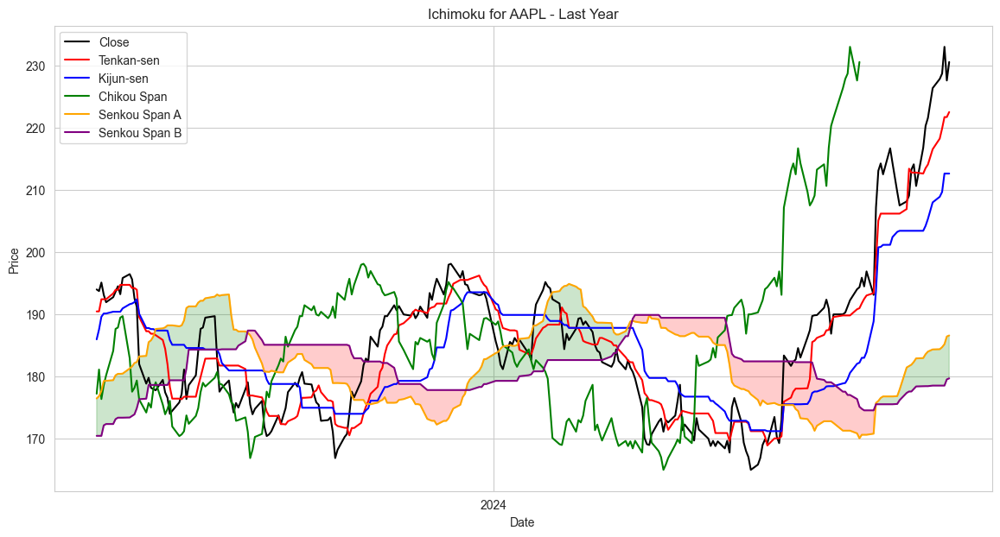

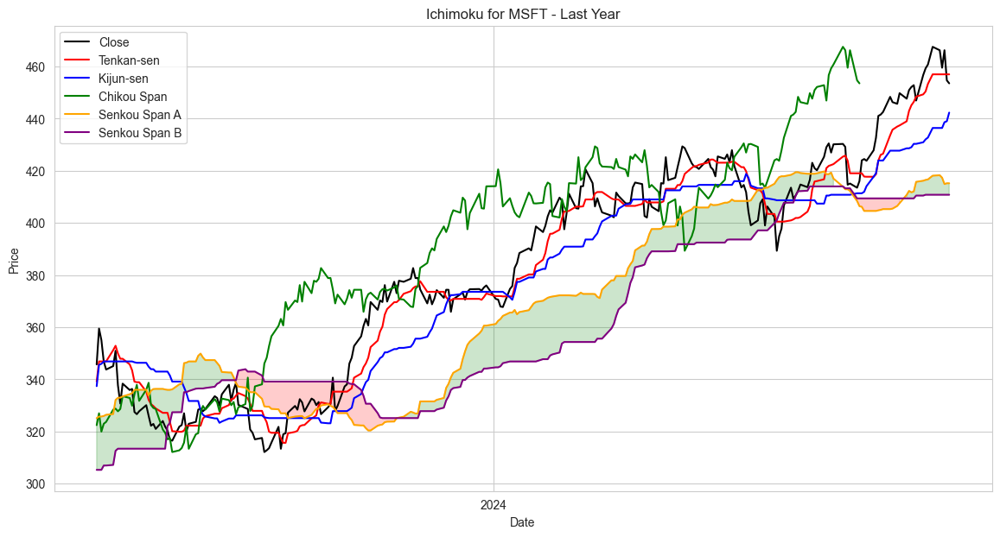

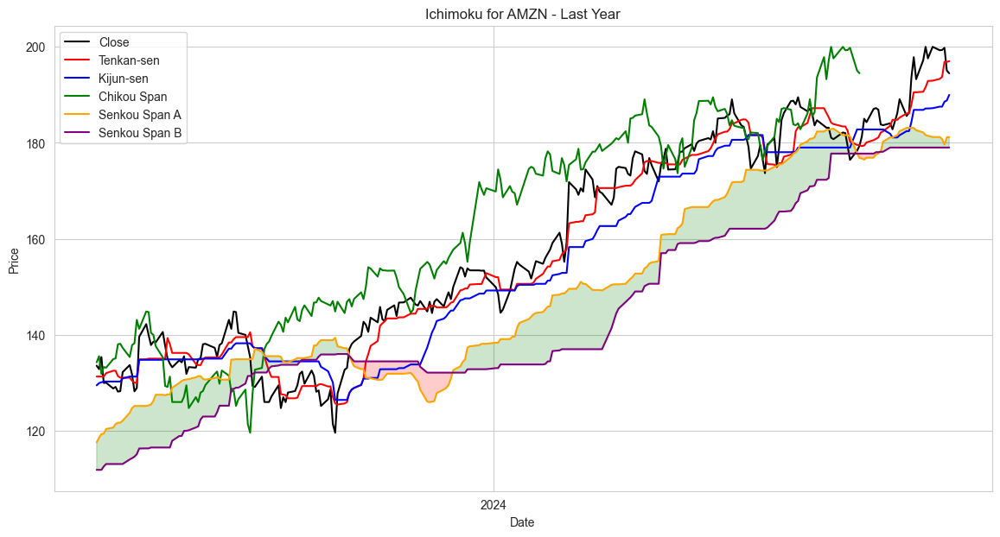

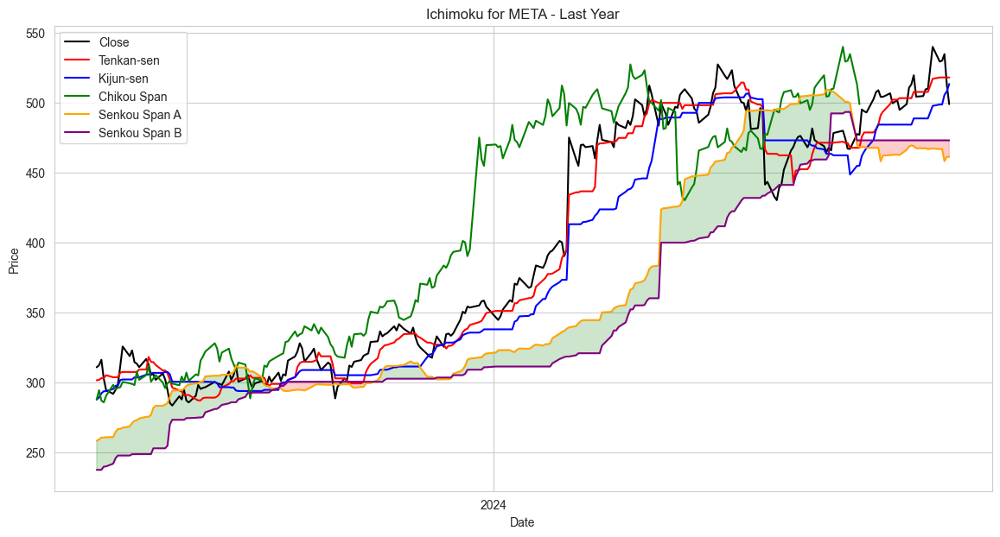

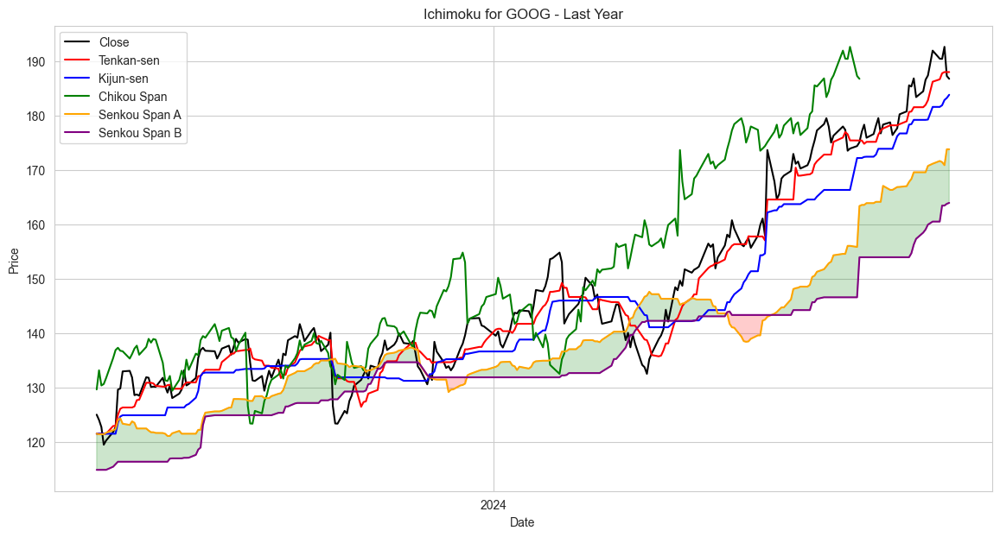

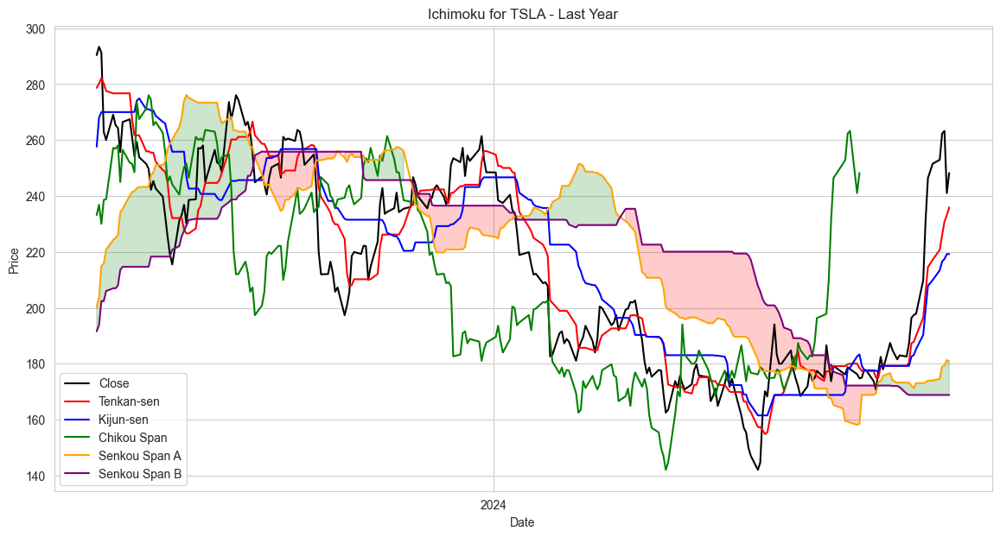

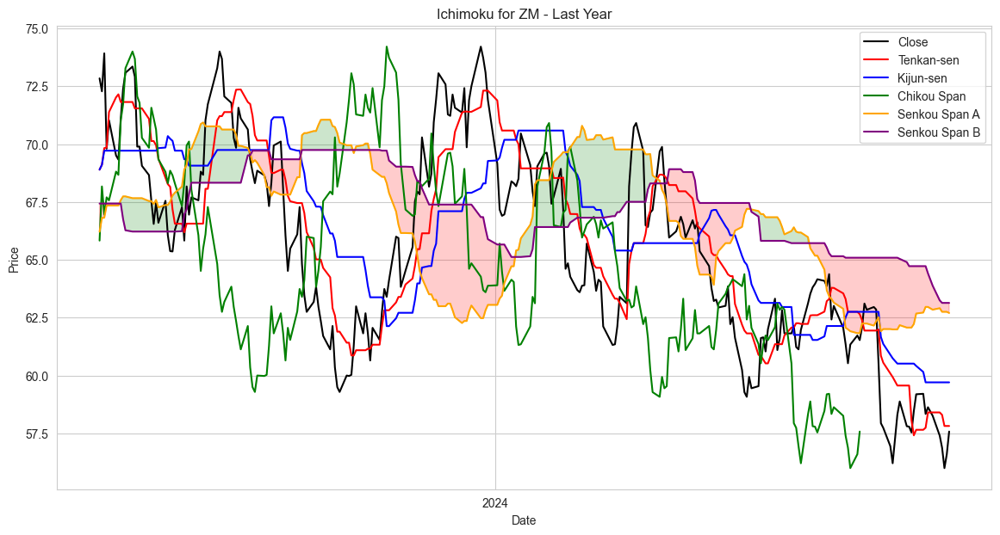

In [829]:

plot_closing_price_and_ichimoku(tickers, cleaned_data)


Parabolic SAR for AAPL:
           Date        PSAR
7542 2024-07-08  208.089599
7543 2024-07-09  210.460848
7544 2024-07-10  213.112329
7545 2024-07-11  216.307156
7546 2024-07-12  218.990812

Parabolic SAR for MSFT:
           Date        PSAR
7542 2024-07-08  452.655602
7543 2024-07-09  455.794483
7544 2024-07-10  458.000000
7545 2024-07-11  468.350006
7546 2024-07-12  468.014006

Parabolic SAR for AMZN:
           Date        PSAR
6829 2024-07-08  190.717607
6830 2024-07-09  192.185141
6831 2024-07-10  193.447221
6832 2024-07-11  201.199997
6833 2024-07-12  201.033197

Parabolic SAR for META:
           Date        PSAR
3051 2024-07-08  494.124013
3052 2024-07-09  496.071452
3053 2024-07-10  497.940994
3054 2024-07-11  499.735754
3055 2024-07-12  542.809998

Parabolic SAR for GOOG:
           Date        PSAR
5003 2024-07-08  184.899997
5004 2024-07-09  186.371996
5005 2024-07-10  187.669597
5006 2024-07-11  193.309998
5007 2024-07-12  193.309998

Parabolic SAR for TSLA:
          

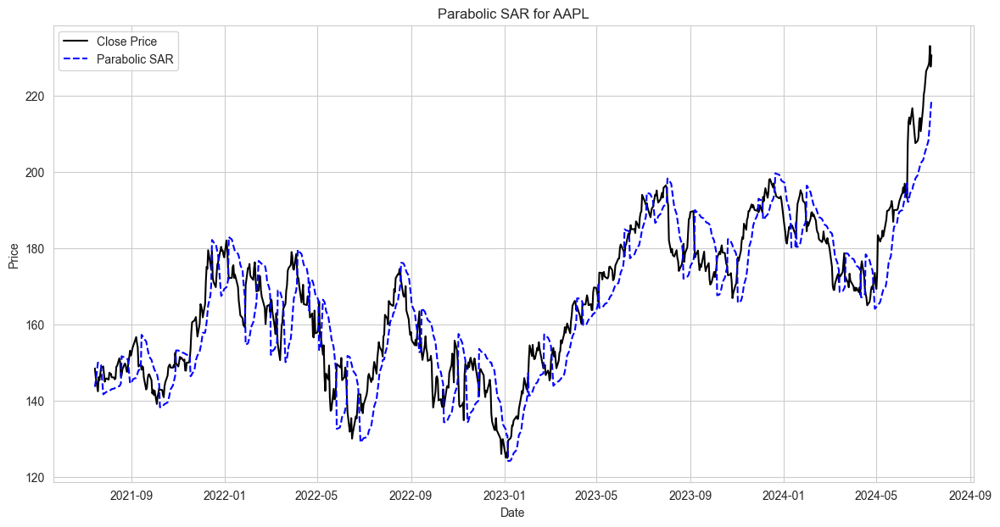

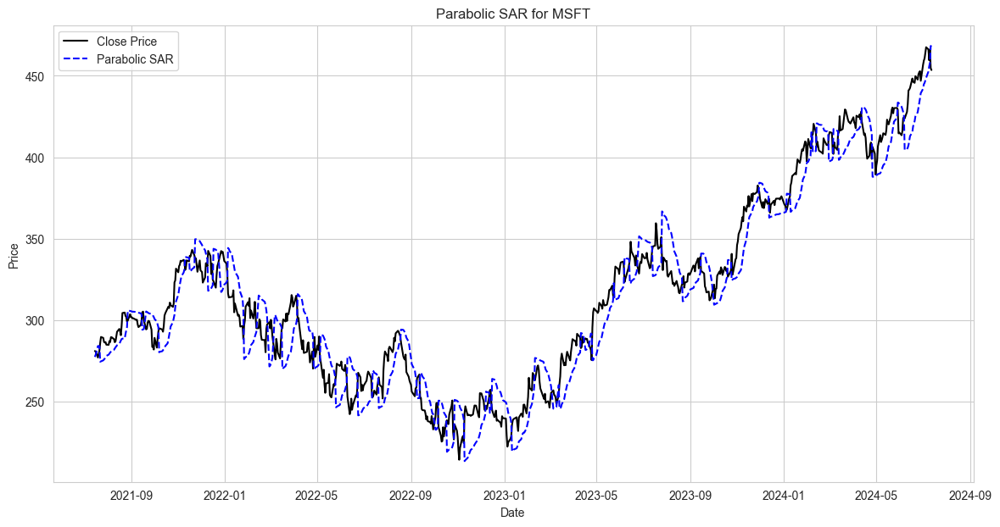

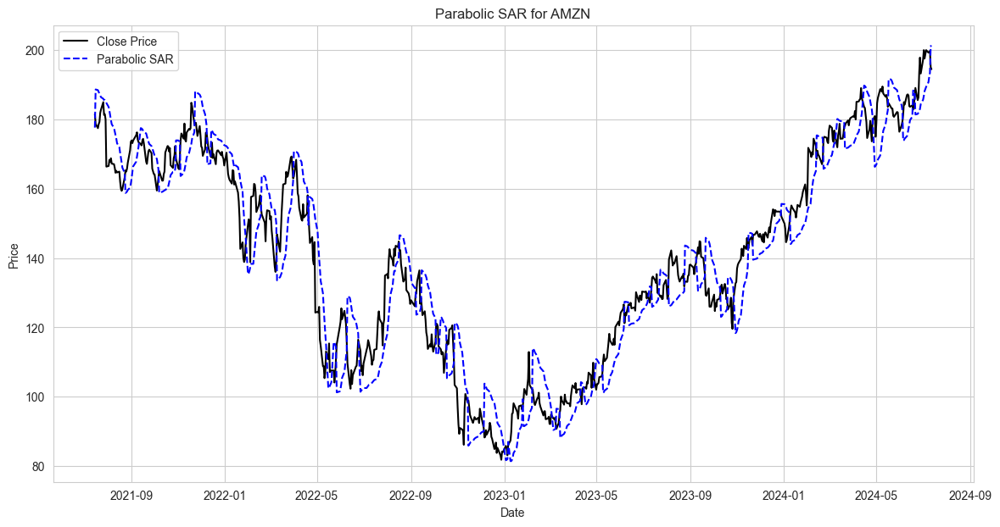

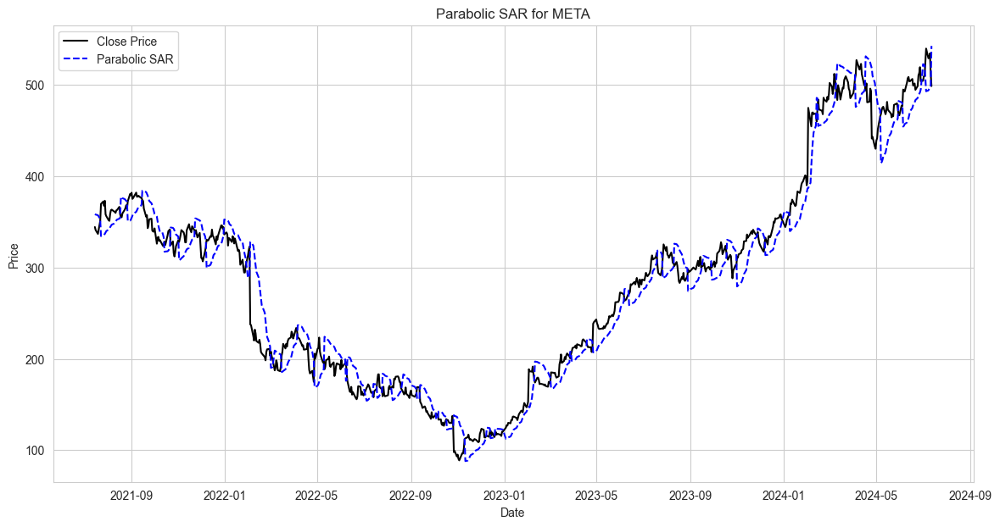

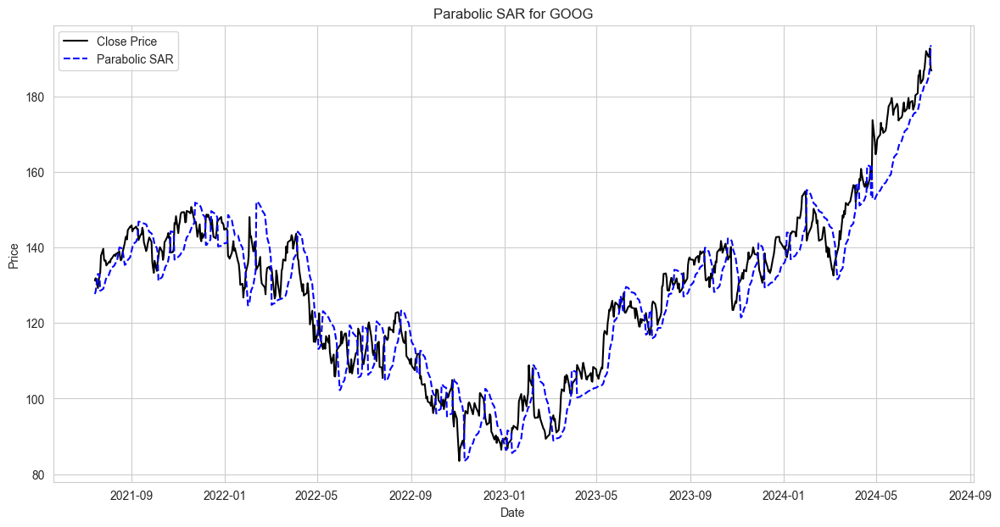

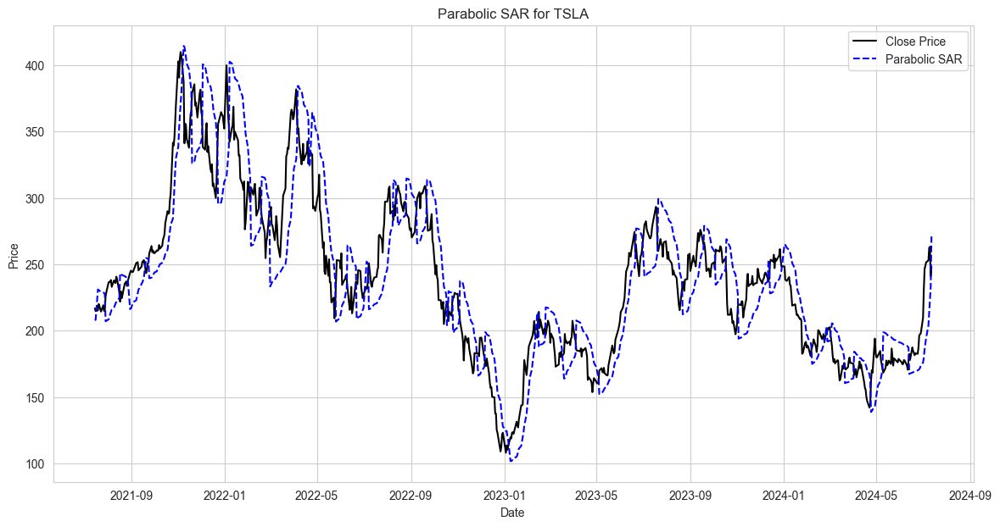

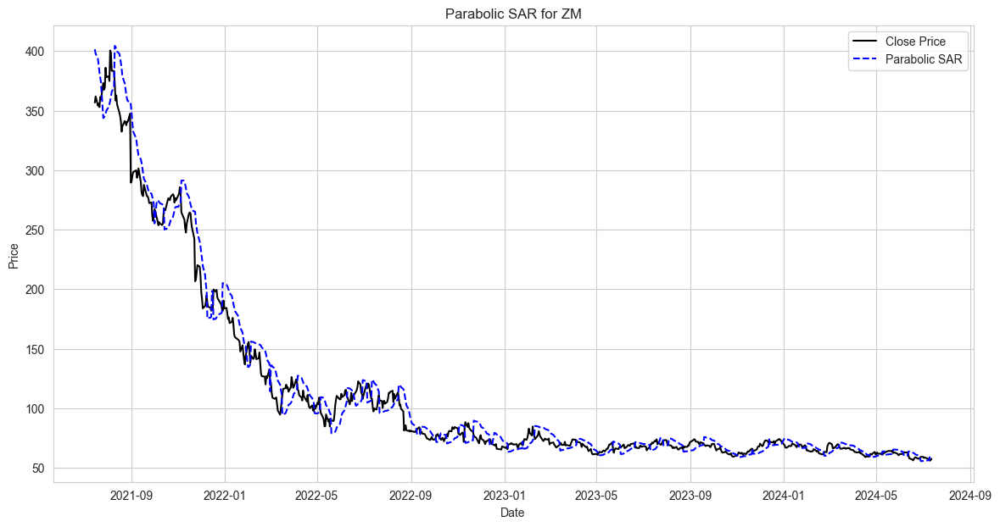

In [830]:
from ta.trend import PSARIndicator

def calculate_parabolic_sar(df):
    psar = PSARIndicator(high=df['High'], low=df['Low'], close=df['Close'])
    df['PSAR'] = psar.psar()
    return df

for ticker, df in cleaned_data.items():
    df = calculate_parabolic_sar(df)
    print(f"\nParabolic SAR for {ticker}:")
    print(df[['Date', 'PSAR']].tail())

def plot_parabolic_sar(df, ticker):
    start_date = datetime.now() - timedelta(days=3*365)
    df = df[df['Date'] >= start_date]
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
    plt.plot(df['Date'], df['PSAR'], label='Parabolic SAR', color='blue', linestyle='--')
    plt.title(f'Parabolic SAR for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

for ticker, df in cleaned_data.items():
    plot_parabolic_sar(df, ticker)



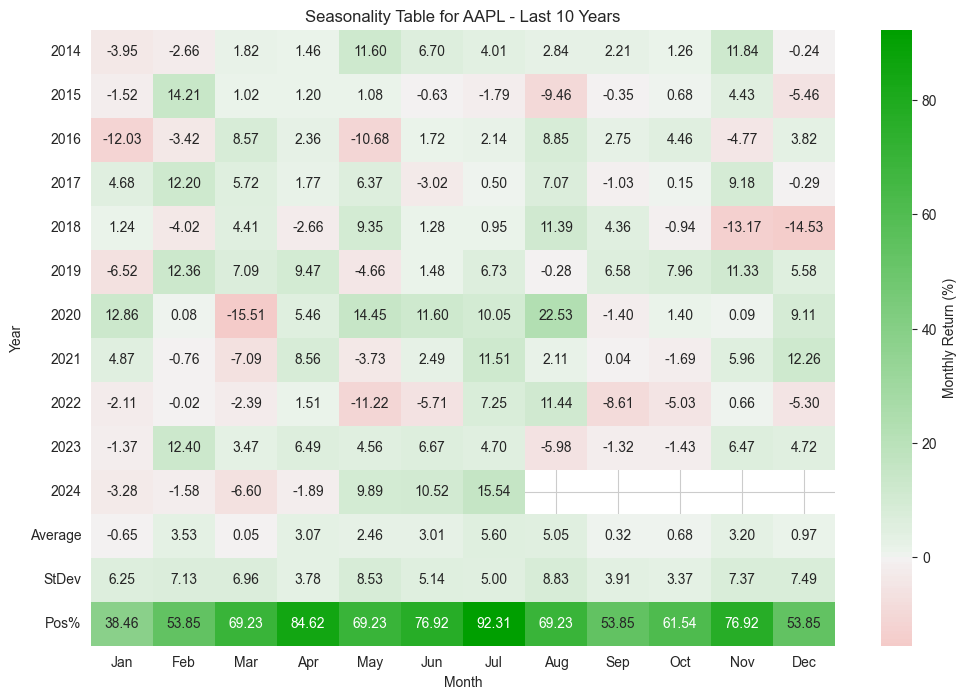

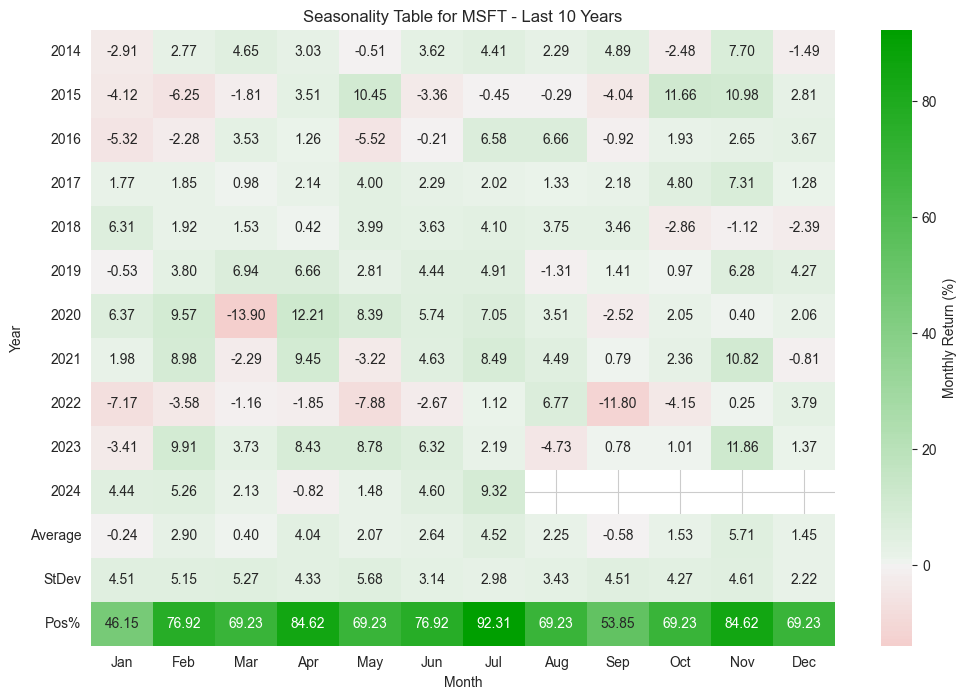

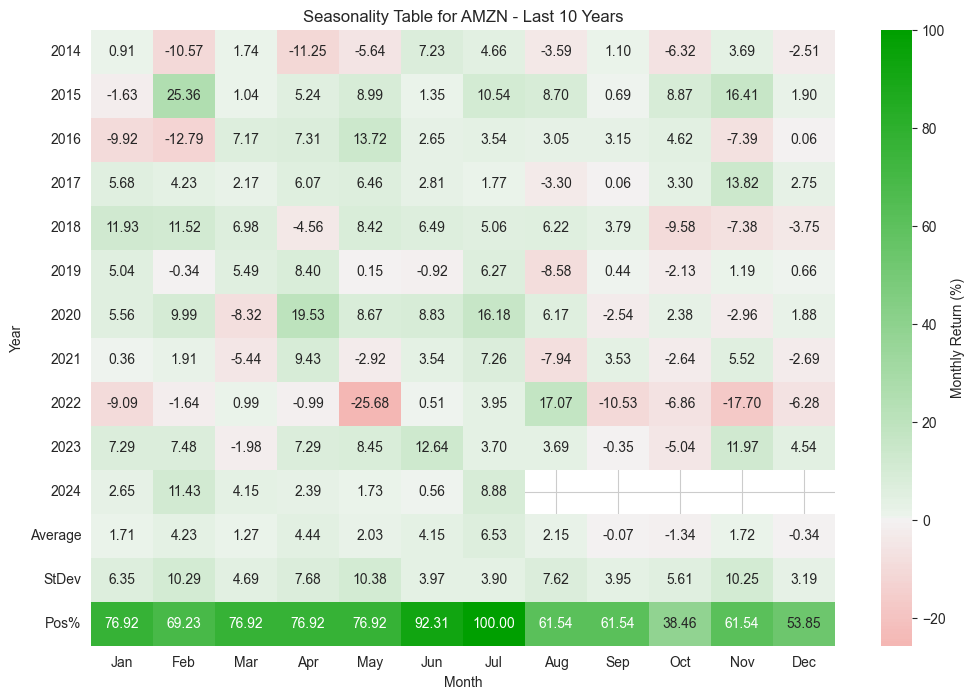

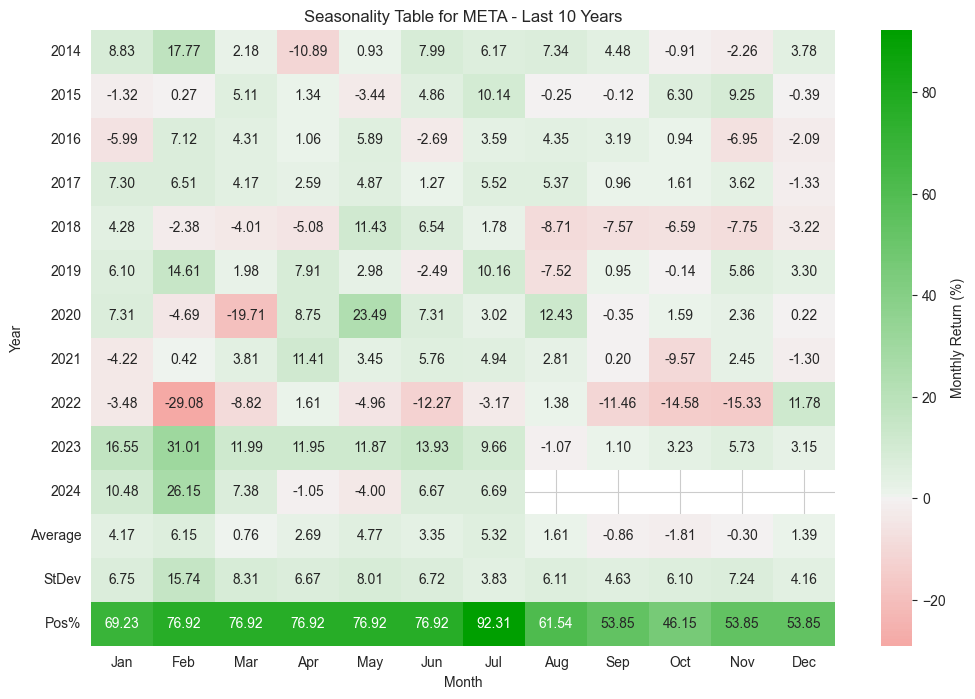

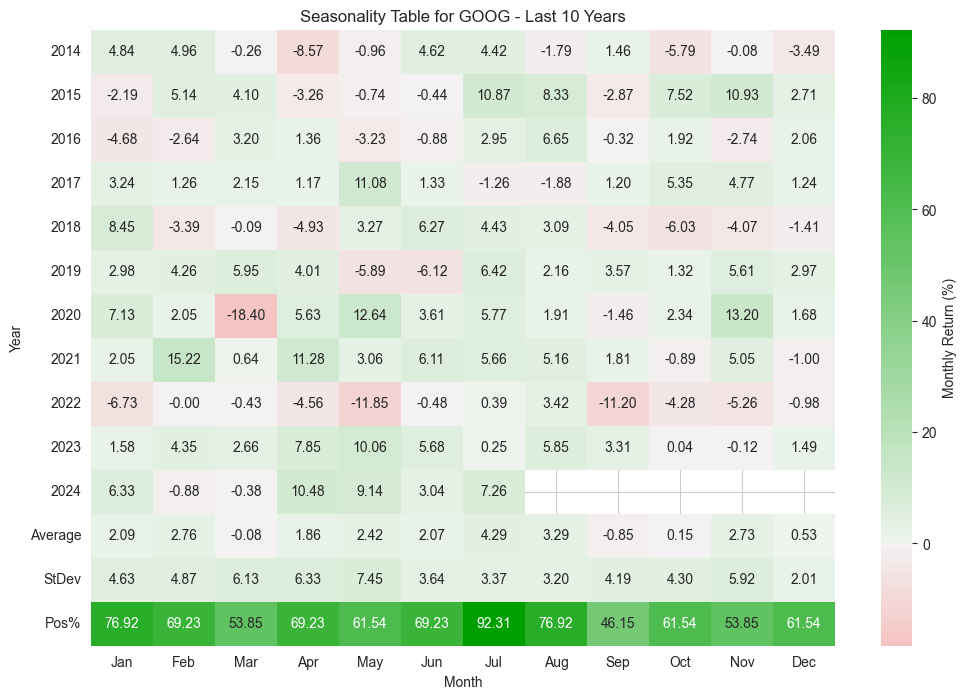

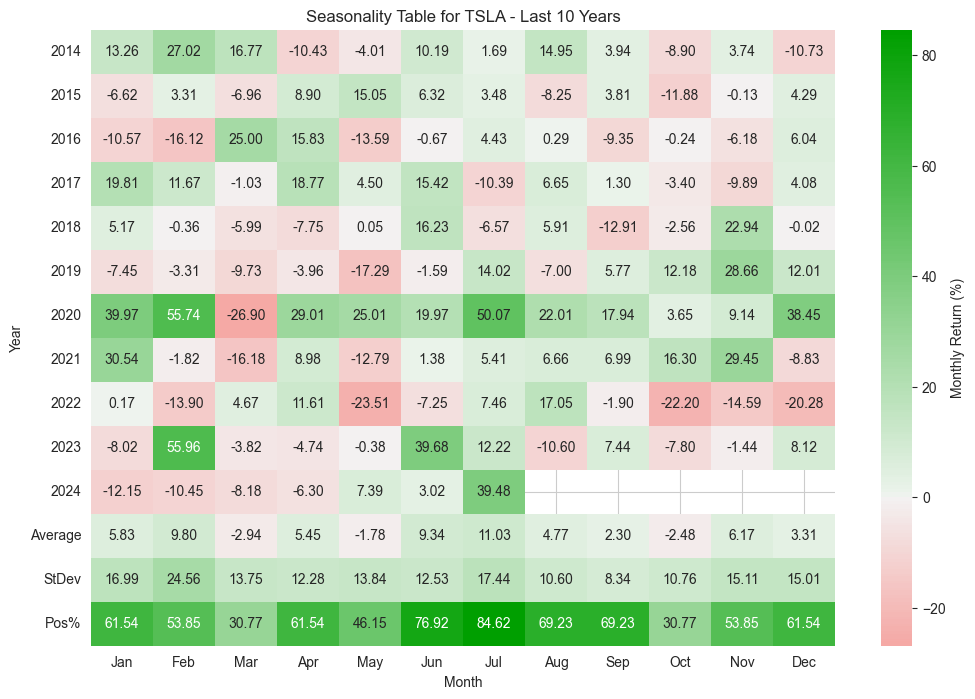

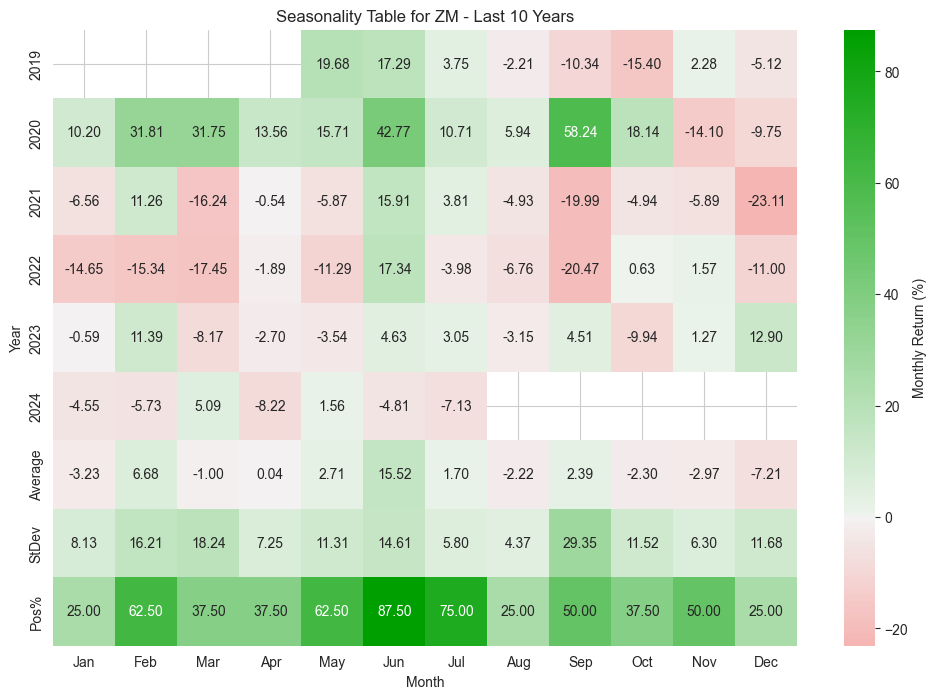

In [831]:

process_and_plot_seasonality(2014)